In [4]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load the dataset from Colab
from google.colab import files
uploaded = files.upload()


Saving multi_method_importance.csv to multi_method_importance.csv


In [6]:
# Read the dataset
df = pd.read_csv('Health Dataset5.csv')
train_all = pd.read_csv('train_all.csv')
test_all = pd.read_csv('test_all.csv')
train_df_transformed = pd.read_csv('train_df_transformed.csv')
test_df_transformed = pd.read_csv('test_df_transformed.csv')
df_transformed = pd.read_csv('df_transformed.csv')
df_combined_with_country = pd.read_csv('df_combined_with_country (1).csv')
df_lagged = pd.read_csv('df_lagged.csv')
df_combined = pd.read_csv('df_combined (1).csv')
multi_method_importance = pd.read_csv('multi_method_importance.csv')
df_model_comparison = pd.read_csv('df_model_comparison.csv')




## QQ Plot of Residuals, Residuals vs. Fitted Values Plot
This plot helps check for the assumptions of linearity and constant variance for a linear regression model.

If curved residual patterns, it indicates that the relationship between predictors and the target is not linear that a linear model may be inappropriate.

The funnel shapes increasing or decreasing spread, which means the variance of the residuals is not constant across all fitted values. This violates one of the key assumptions of linear regression and can lead to inefficient and biased estimates



Modeling for: Life expectancy


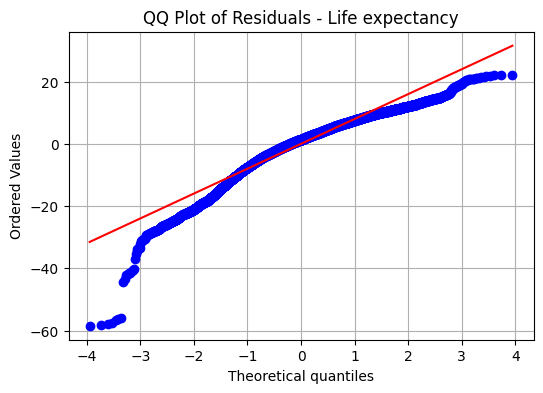

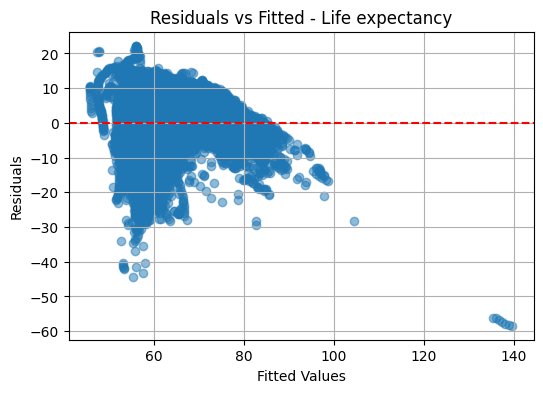

Residuals Summary:
  Mean: -0.0000
  Std Dev: 8.2276
  Skewness: -1.0599
  Kurtosis: 1.9206
  Shapiro-Wilk: Statistic=0.9420, p-value=0.0000
 Residuals deviate from normality.

Modeling for: Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17504.
  res = hypotest_fun_out(*samples, **kwds)


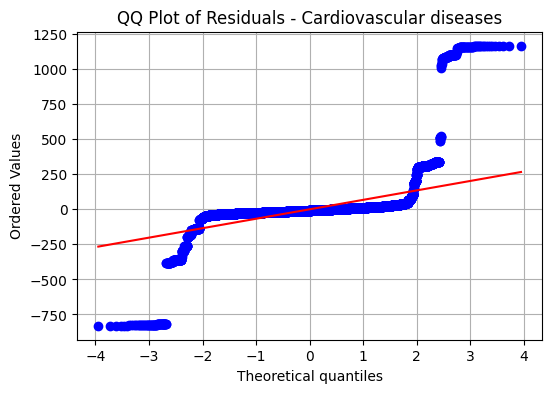

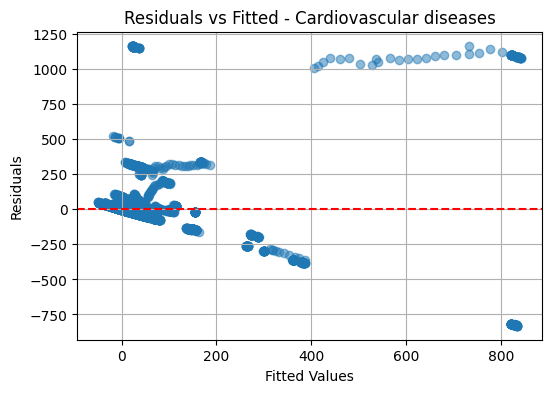

Residuals Summary:
  Mean: 0.0001
  Std Dev: 120.4087
  Skewness: 4.6438
  Kurtosis: 59.1114
  Shapiro-Wilk: Statistic=0.3134, p-value=0.0000
 Residuals deviate from normality.

Modeling for: Diabetes


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17504.
  res = hypotest_fun_out(*samples, **kwds)


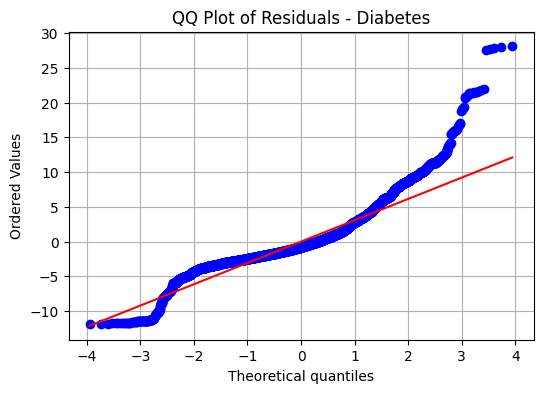

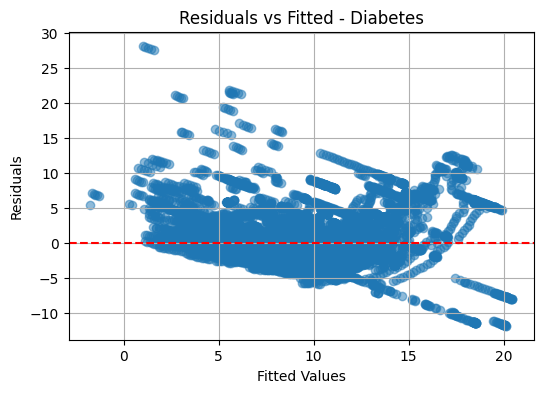

Residuals Summary:
  Mean: -0.0000
  Std Dev: 3.2707
  Skewness: 1.4892
  Kurtosis: 5.4749
  Shapiro-Wilk: Statistic=0.8798, p-value=0.0000
 Residuals deviate from normality.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17504.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy import stats

# List of predictors (make sure column names match exactly in your dataframe)
features = [
    'Income', 'GDP', 'CPI', 'Sex ratio',
    'BMI (female)', 'Cost of a healthy diet', 'Inflation',
    'Incomplete tertiary education', 'Gini coefficient', 'Median age'
]

# Loop through each target variable
for target in ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']:
    print(f"\nModeling for: {target}")

    # Subset and drop rows with missing values
    model_data = df[[target] + features].dropna()
    X = model_data[features]
    y = model_data[target]

    # Add constant (intercept)
    X = sm.add_constant(X)

    # Fit OLS regression model
    model = sm.OLS(y, X).fit()
    residuals = model.resid

    # --- QQ Plot ---
    plt.figure(figsize=(6, 4))
    stats.probplot(residuals, dist="norm", plot=plt)
    plt.title(f'QQ Plot of Residuals - {target}')
    plt.grid(True)
    plt.show()

    # --- Residuals vs. Fitted Values Plot ---
    plt.figure(figsize=(6, 4))
    plt.scatter(model.fittedvalues, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.title(f'Residuals vs Fitted - {target}')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.grid(True)
    plt.show()

    # --- Residual Summary ---
    print("Residuals Summary:")
    print(f"  Mean: {residuals.mean():.4f}")
    print(f"  Std Dev: {residuals.std():.4f}")
    print(f"  Skewness: {residuals.skew():.4f}")
    print(f"  Kurtosis: {residuals.kurtosis():.4f}")

    # --- Shapiro-Wilk Test for Normality ---
    shapiro_test = stats.shapiro(residuals)
    print(f"  Shapiro-Wilk: Statistic={shapiro_test.statistic:.4f}, p-value={shapiro_test.pvalue:.4f}")
    if shapiro_test.pvalue > 0.05:
        print(" Residuals are approximately normal.")
    else:
        print(" Residuals deviate from normality.")

The results of the QQ plot and Residual vs Fitted value:

1. Life Expectancy
The residuals for the life expectancy model have a near-zero mean, which is good. However, they exhibit moderate left skew (skewness = -1.059) and slightly lower-than-normal kurtosis (1.92), suggesting they are not perfectly normally distributed. The Shapiro-Wilk test confirms this, with a p-value of 0.0000 indicating a significant deviation from normality. The QQ plot likely shows curved tails, and if the residuals vs. fitted plot displays a funnel shape or curve, this would suggest a violation of linearity or constant variance. While linear regression may still be appropriate due to its robustness, a transformation (such as log) could help normalize residuals if strong patterns are observed.

2. Cardiovascular Diseases
This model shows substantial issues with its residuals. The residual mean is 5.2 (ideally it should be closer to 0), and the skewness is very high (4.64), indicating extreme right-skew. The kurtosis value of 59.11 is also very large, pointing to heavy tails and likely outliers. With a Shapiro-Wilk p-value of 0.0000, the residuals strongly violate the assumption of normality. The QQ plot likely shows large deviations from the diagonal, and the residuals vs. fitted plot probably reveals non-random patterns and uneven spread. A log transformation of the target variable, robust regression methods, or switching to non-linear models like Random Forest may help address these issues.

3. Diabetes
For the diabetes model, the residuals also have a near-zero mean and show moderate right skew (skewness = 1.489) with heavier tails than normal (kurtosis = 5.47). Though not extreme, the Shapiro-Wilk test still reports a p-value of 0.0000, suggesting the residuals are not normally distributed. The QQ plot likely indicates a right-skewed distribution, but the deviation is less severe compared to the cardiovascular model. If the residuals vs. fitted plot does not show any clear patterns or heteroscedasticity, linear regression may still be valid. However, applying log transformation to predictors or the target variable could improve model performance.

## Histogram and KDE Plot

Histogram and KDE Plot are used to visualize the normalization for each variable


Skewness Summary:
Inflation                        75.489967
CPI                              25.637506
Cardiovascular diseases          10.419131
GDP                               8.488527
Sex ratio                         7.718123
Diabetes                          1.823593
Income                            1.618565
Unemployment Rate                 1.487679
Child mortality rate              1.458613
Incomplete tertiary education     1.154120
Median age                        0.899402
Gini coefficient                  0.820521
Cost of a healthy diet            0.642813
BMI (female)                      0.257175
BMI (male)                        0.065172
Year                             -0.002662
Life expectancy                  -0.691259
dtype: float64


/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


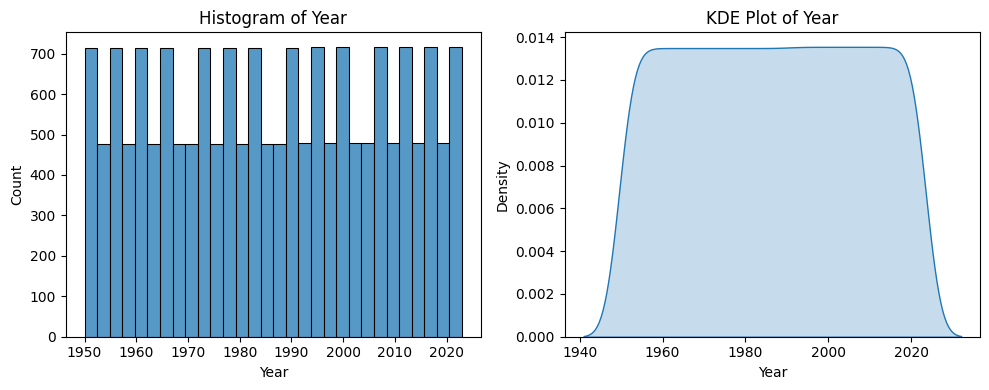

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


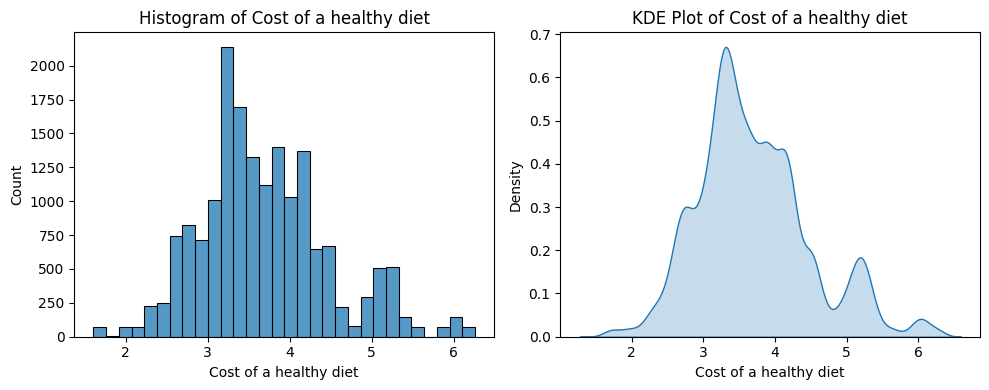

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


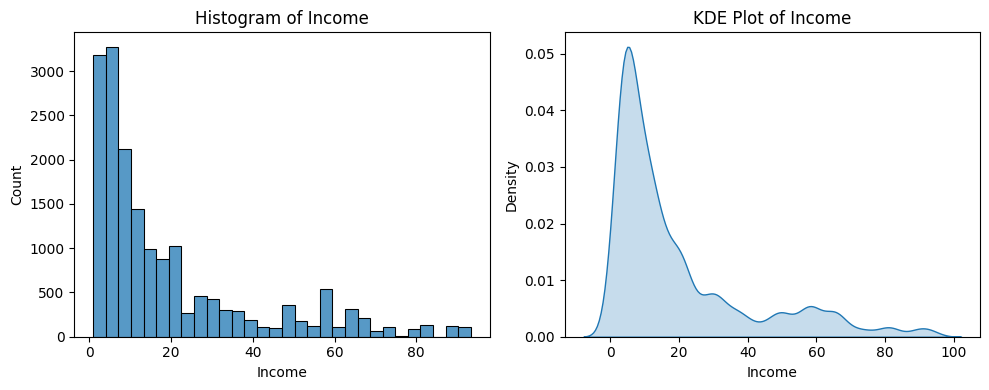

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


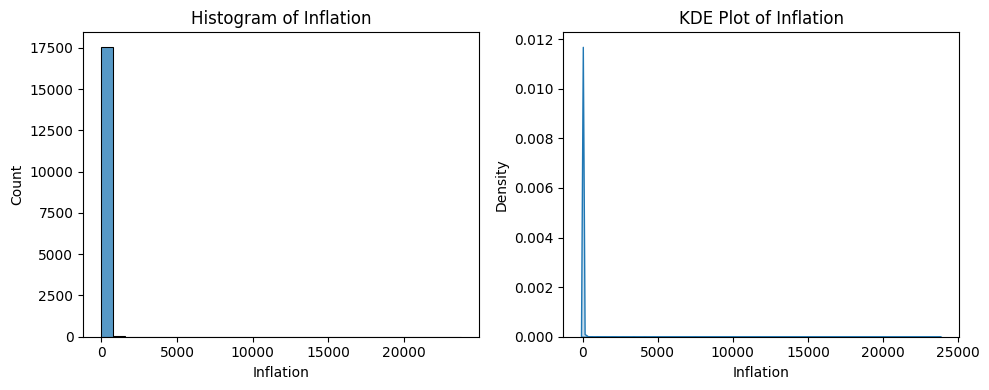

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


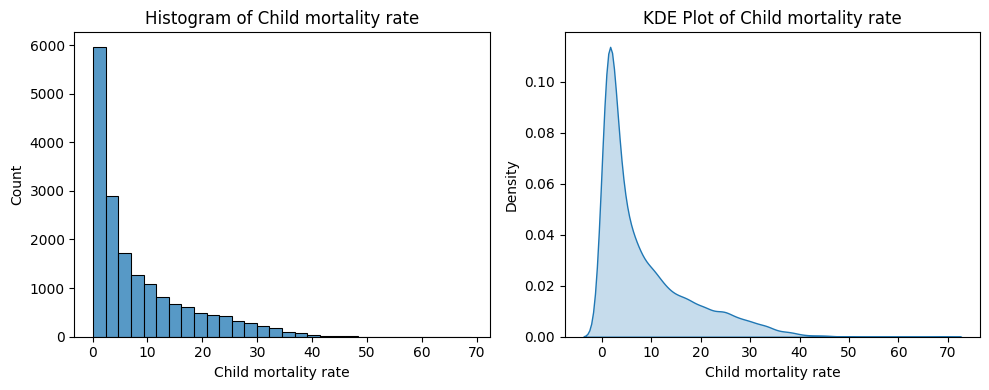

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


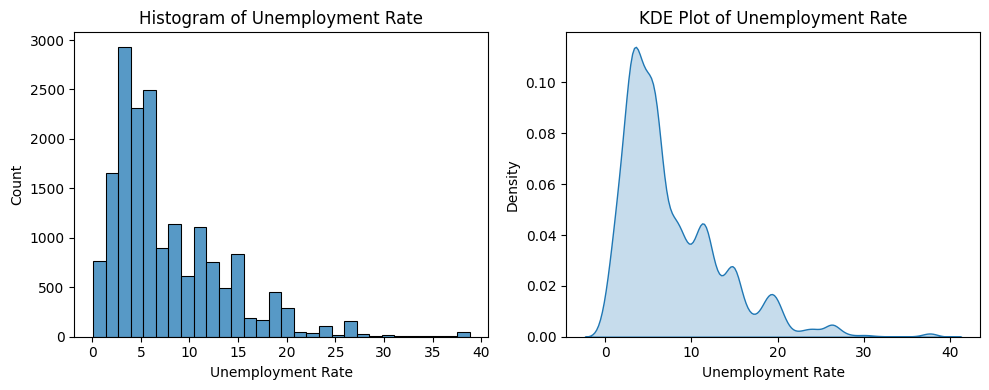

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


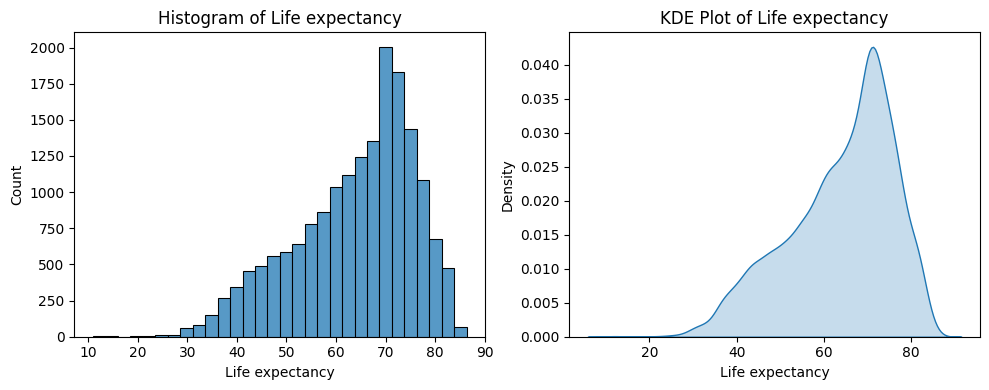

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


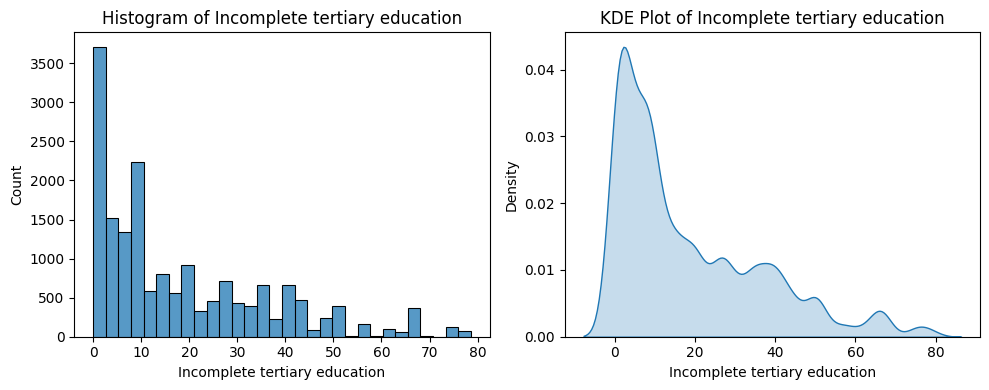

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


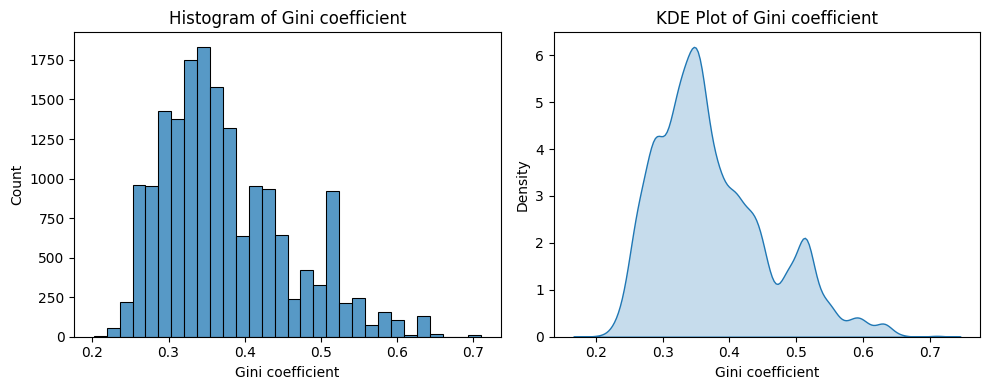

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


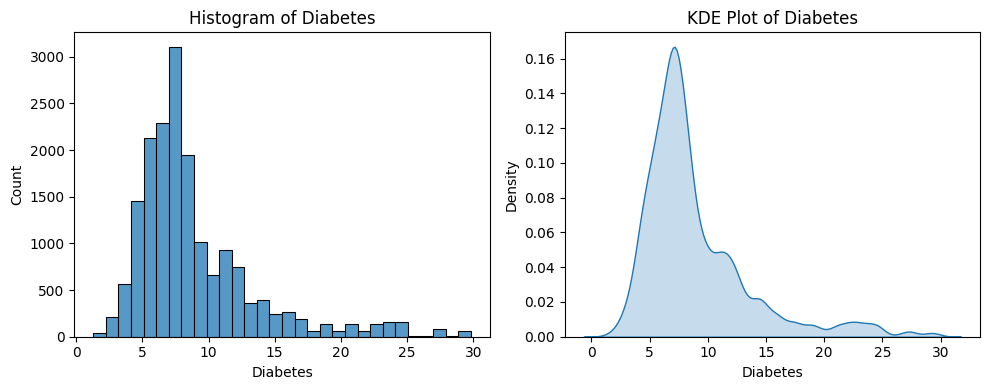

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


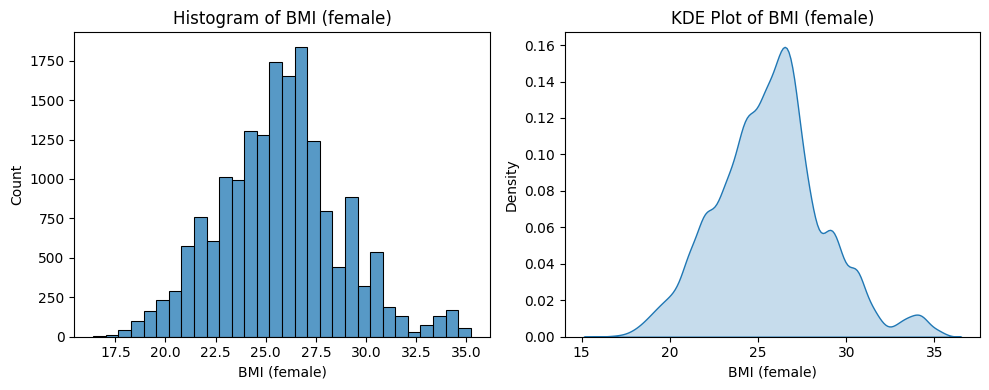

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


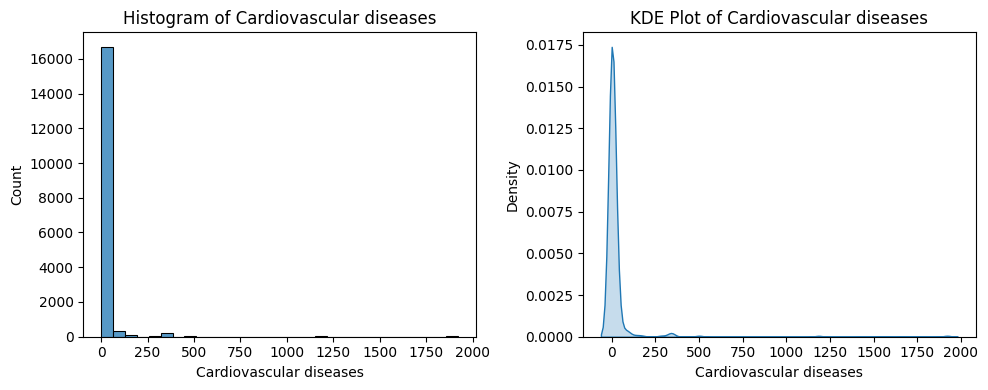

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


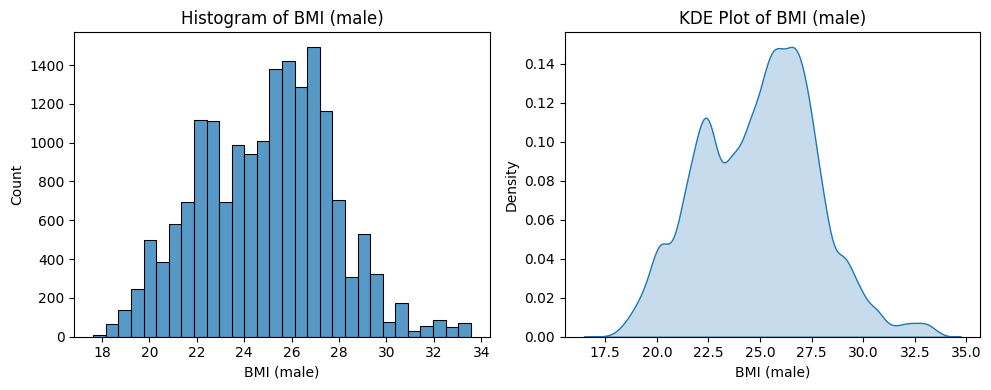

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


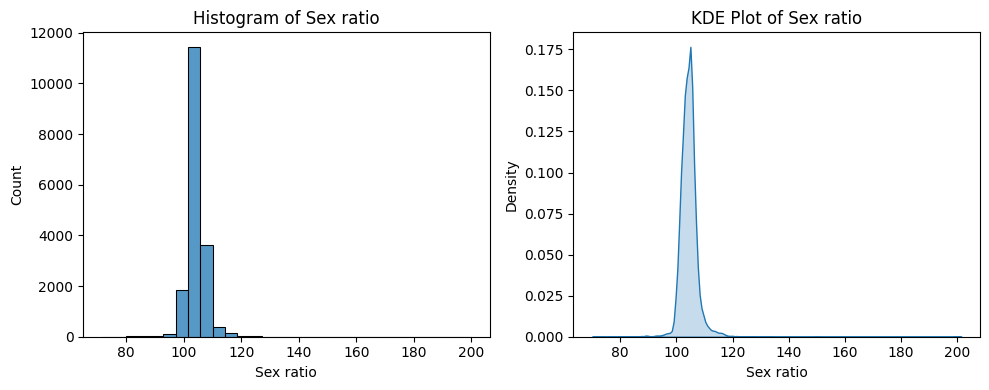

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


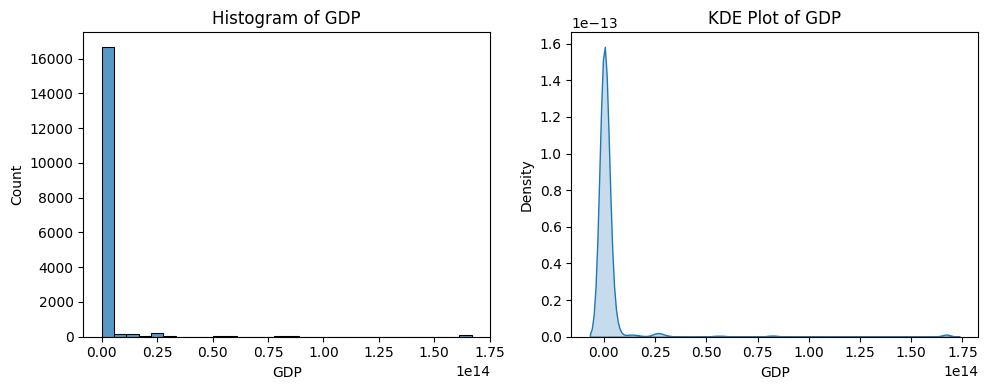

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


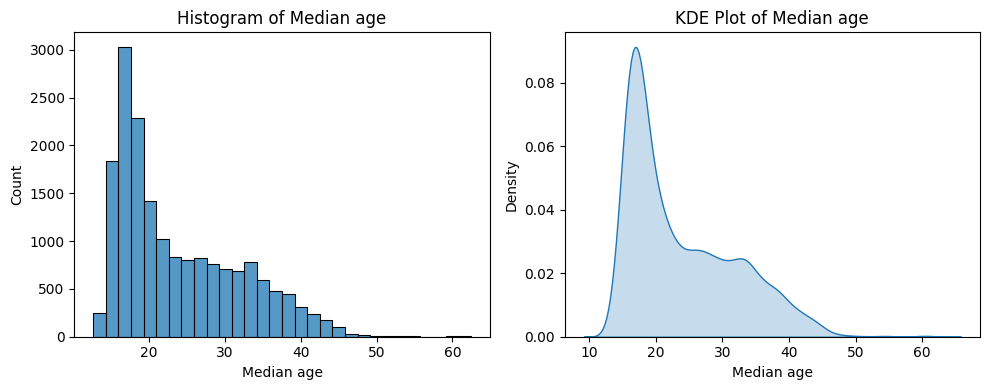

/tmp/ipython-input-7-1776002204.py:27: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col].dropna(), shade=True)


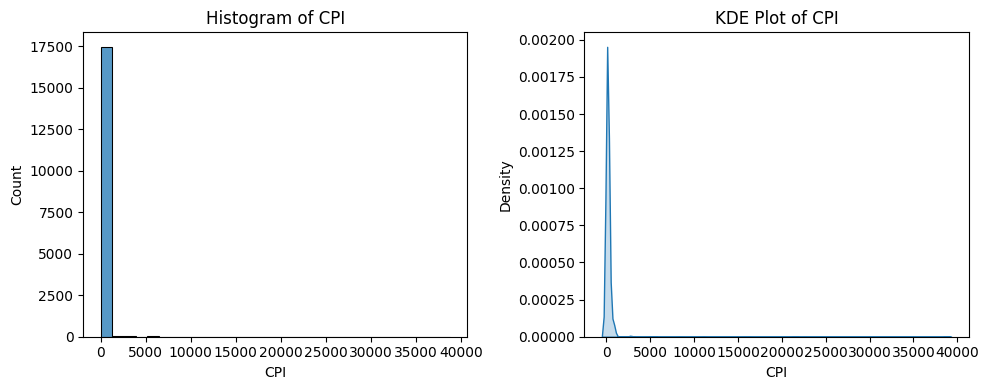

In [ ]:
# Histogram and Skewness Summary

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace this with your actual DataFrame
# df = pd.read_csv('your_dataset.csv')

# Identify numeric columns
numeric_cols = df.select_dtypes(include='number').columns

# Calculate skewness
skewness_summary = df[numeric_cols].skew().sort_values(ascending=False)
print("Skewness Summary:")
print(skewness_summary)

# Plot histogram and KDE for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    sns.histplot(df[col].dropna(), bins=30, kde=False)
    plt.title(f'Histogram of {col}')

    plt.subplot(1, 2, 2)
    sns.kdeplot(df[col].dropna(), shade=True)
    plt.title(f'KDE Plot of {col}')

    plt.tight_layout()
    plt.show()

## Boxplot

Boxplots is a good tool of offering a visual summary of the distribution, skewness, and variability for each numeric variable in the dataset.

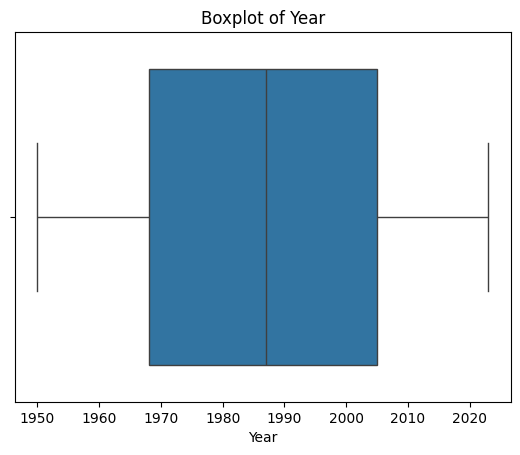

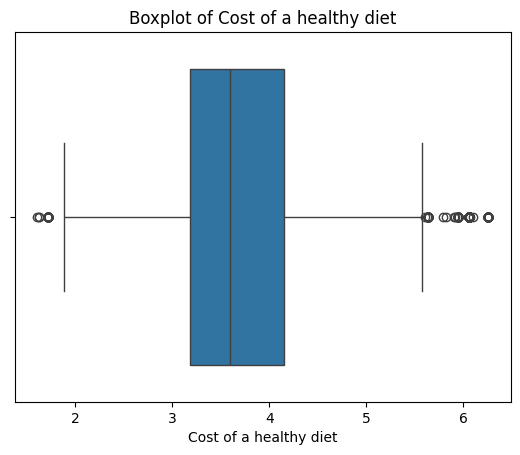

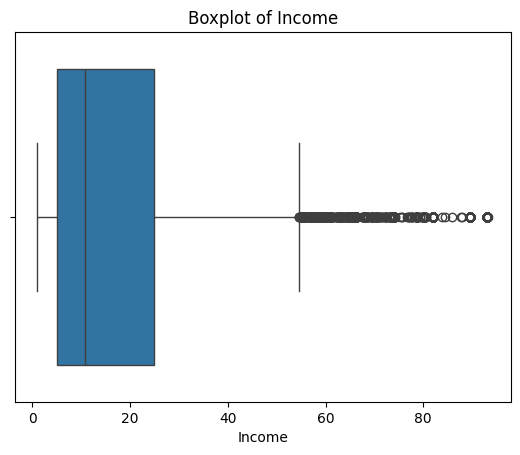

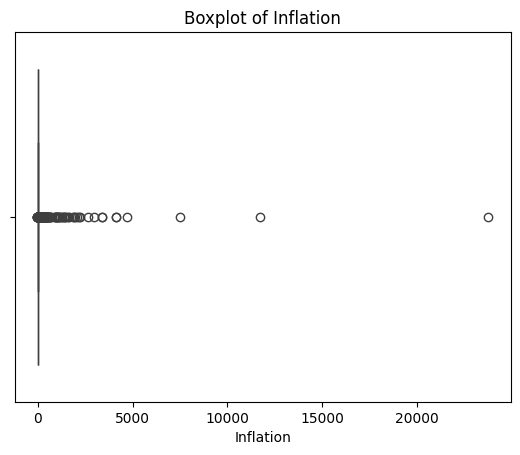

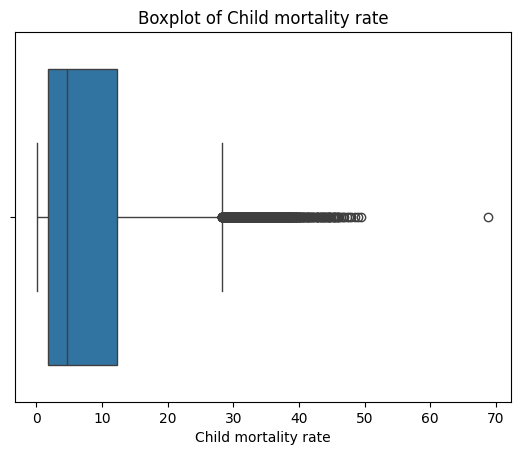

...

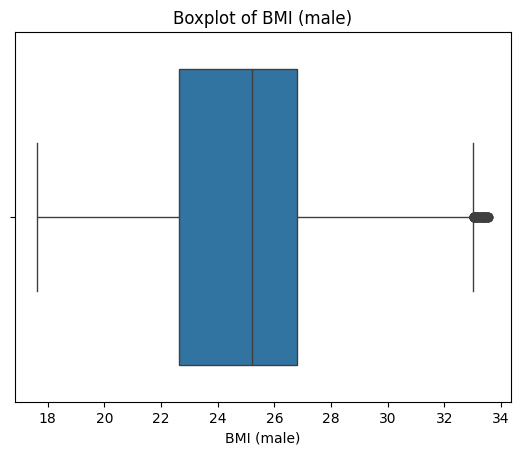

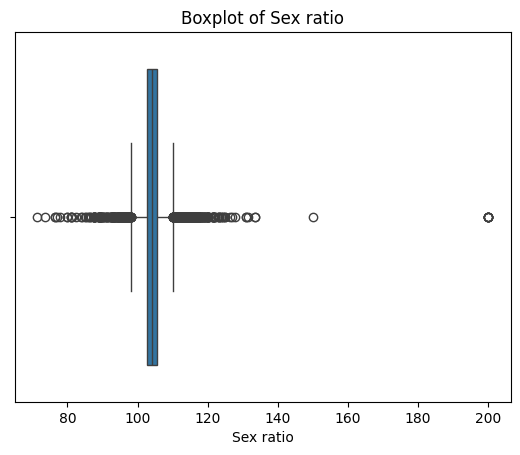

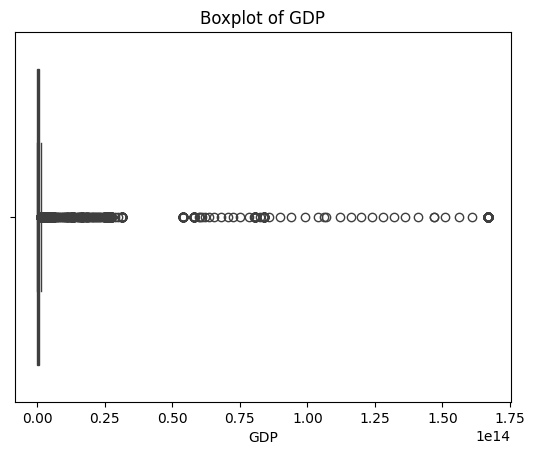

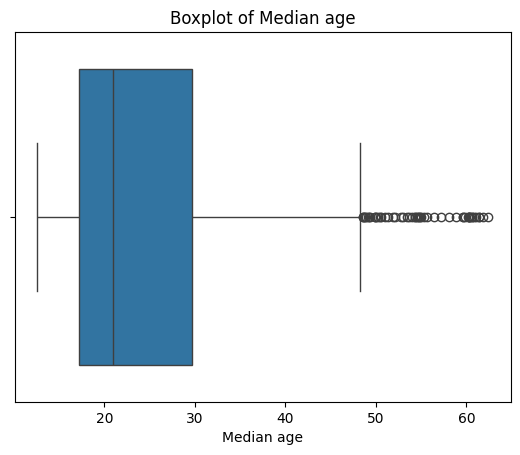

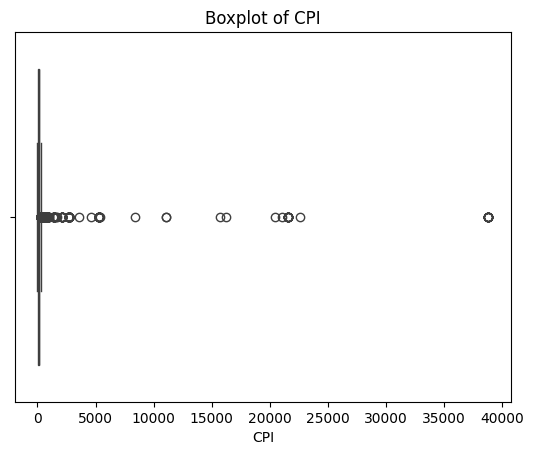

In [ ]:
# Boxplot

import seaborn as sns
import matplotlib.pyplot as plt

# Loop through all numeric columns to create boxplots
for col in df.select_dtypes(include='number').columns:
    # Get the data for the current numeric column
    column_data = df[col].dropna() # Drop NaN values to avoid potential issues with plotting

    # Check if there is enough data for plotting (at least one non-null value)
    if len(column_data) > 0:
        sns.boxplot(x=column_data)
        plt.title(f"Boxplot of {col}")
        plt.xlabel(col)
        plt.show()
    else:
        print(f"Not enough data to generate boxplot for column: {col}")

## Spearman Correlation


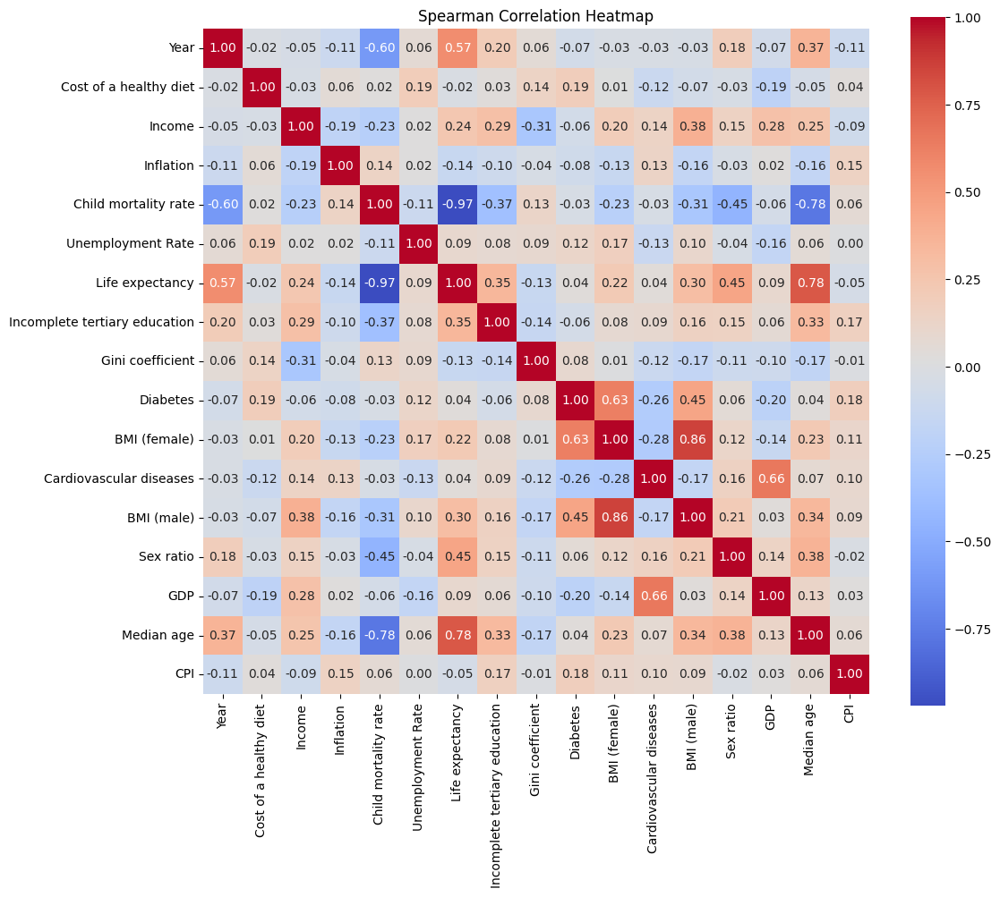

In [ ]:
# Spearman Correlation matrix and heatmap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np # Import numpy for np.number

# Compute correlation matrix - Select only numeric columns
corr_method = 'spearman'
# Select only numeric columns for correlation calculation
df_numeric = df.select_dtypes(include=np.number)
corr_matrix = df_numeric.corr(method=corr_method)

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title(f'{corr_method.capitalize()} Correlation Heatmap')
plt.show()

# Feature Selection Comparison (Summary and Charts)
Compare Feature Selection method and the best nubmer of features using RMSE





🔍 Feature selection for target: Cardiovascular diseases

Method: LASSO
Best number of features: 3
Best RMSE: 144.6855
Selected features: ['BMI_avg_lag2', 'BMI_avg_lag3', 'GDP']

Method: RFE
Best number of features: 3
Best RMSE: 144.5087
Selected features: ['Income', 'GDP', 'BMI_avg']

Method: Forward
Best number of features: 11
Best RMSE: 145.4053
Selected features: ['Unemployment Rate', 'Incomplete tertiary education', 'GDP', 'Unemployment Rate_lag1', 'Unemployment Rate_lag2', 'Unemployment Rate_lag3', 'Incomplete tertiary education_lag1', 'Incomplete tertiary education_lag2', 'Incomplete tertiary education_lag3', 'GDP_lag1', 'lagged']

Method: RandomForest
Best number of features: 3
Best RMSE: 145.3185
Selected features: ['GDP_lag1', 'GDP', 'Incomplete tertiary education']


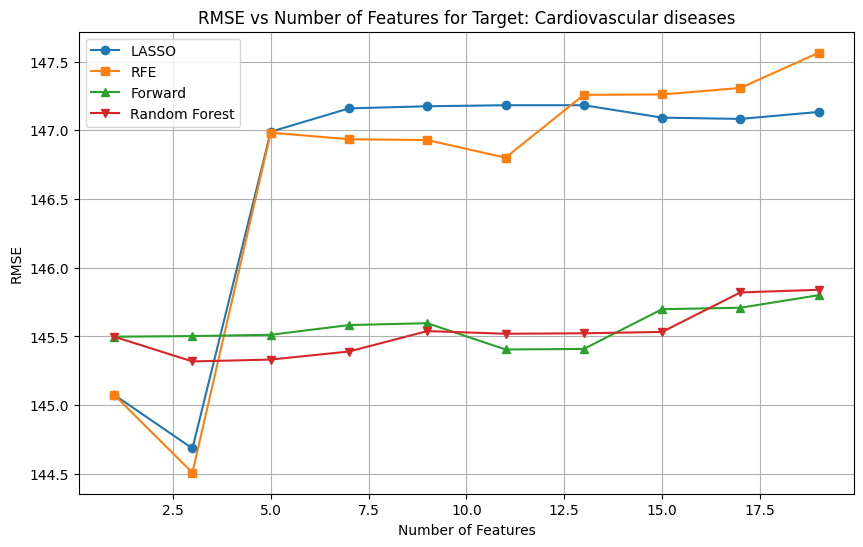


🔍 Feature selection for target: Diabetes

Method: LASSO
Best number of features: 11
Best RMSE: 3.6356
Selected features: ['Incomplete tertiary education_lag3', 'Sex ratio_lag3', 'Incomplete tertiary education', 'Income_lag3', 'CPI', 'Median age_lag3', 'Cost of a healthy diet', 'Income', 'GDP', 'BMI_avg', 'BMI_avg_lag3']

Method: RFE
Best number of features: 9
Best RMSE: 3.6424
Selected features: ['Cost of a healthy diet', 'Income', 'Incomplete tertiary education', 'GDP', 'CPI', 'BMI_avg', 'Income_lag3', 'Median age_lag3', 'BMI_avg_lag3']

Method: Forward
Best number of features: 17
Best RMSE: 3.6281
Selected features: ['Income', 'Inflation', 'Child mortality rate', 'Incomplete tertiary education', 'Sex ratio', 'GDP', 'BMI_avg', 'Cost of a healthy diet_lag2', 'Income_lag1', 'Income_lag2', 'Income_lag3', 'Inflation_lag3', 'Sex ratio_lag3', 'CPI_lag3', 'BMI_avg_lag1', 'BMI_avg_lag3', 'lagged']

Method: RandomForest
Best number of features: 17
Best RMSE: 3.6859
Selected features: ['CPI', 

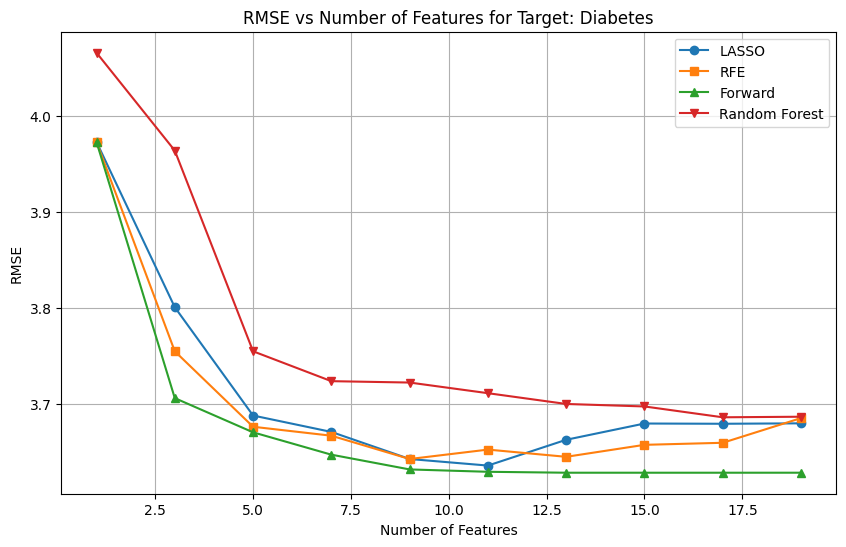


🔍 Feature selection for target: Life expectancy

Method: LASSO
Best number of features: 5
Best RMSE: 3.5032
Selected features: ['Median age_lag3', 'Sex ratio', 'GDP', 'Child mortality rate_lag3', 'Child mortality rate']

Method: RFE
Best number of features: 7
Best RMSE: 3.5002
Selected features: ['Child mortality rate', 'Sex ratio', 'GDP', 'Median age', 'Child mortality rate_lag2', 'Child mortality rate_lag3', 'Median age_lag3']

Method: Forward
Best number of features: 17
Best RMSE: 3.4964
Selected features: ['Child mortality rate', 'Sex ratio', 'GDP', 'Median age', 'Child mortality rate_lag1', 'Child mortality rate_lag2', 'Child mortality rate_lag3', 'Sex ratio_lag1', 'Sex ratio_lag2', 'Sex ratio_lag3', 'GDP_lag1', 'GDP_lag2', 'GDP_lag3', 'Median age_lag2', 'BMI_avg_lag2', 'BMI_avg_lag3', 'lagged']

Method: RandomForest
Best number of features: 9
Best RMSE: 3.5058
Selected features: ['BMI_avg', 'GDP', 'Sex ratio', 'Income', 'Median age_lag3', 'Median age', 'Child mortality rate_lag2

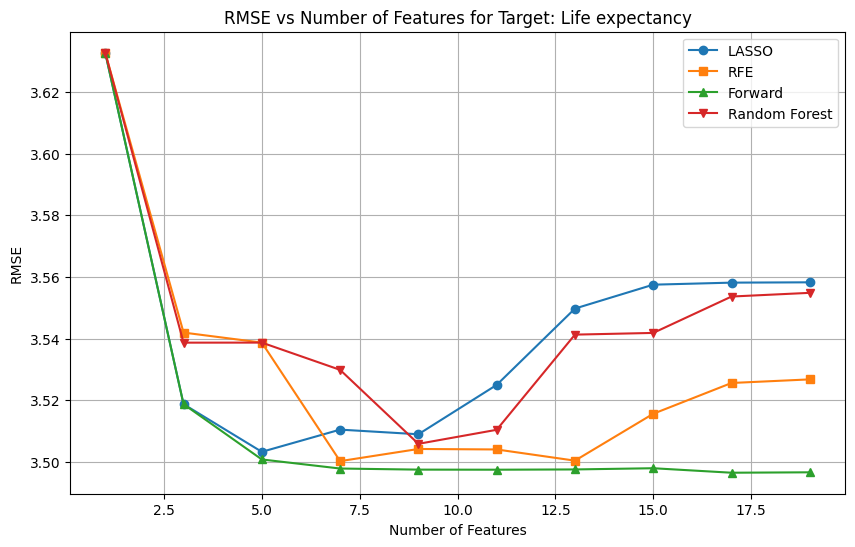

In [ ]:
# feature selection comparison
from sklearn.linear_model import Ridge
from sklearn.impute import SimpleImputer

def find_best_feature_count(X_df, y, max_features=None):
    import numpy as np
    import pandas as pd
    from sklearn.linear_model import LassoCV, LinearRegression
    from sklearn.feature_selection import RFE, SequentialFeatureSelector
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import TimeSeriesSplit
    from sklearn.metrics import mean_squared_error
    from sklearn.preprocessing import StandardScaler

    feature_names = X_df.columns.tolist()

    # 1. Impute missing values
    imputer = SimpleImputer(strategy='mean')  # or 'median', 'most_frequent'
    X_imputed = imputer.fit_transform(X_df)
    y_imputed = imputer.fit_transform(y.values.reshape(-1, 1)).ravel()

    # --- Scale X and y ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_imputed)

    y_imputed = y_imputed.reshape(-1, 1)
    y_scaler = StandardScaler()
    y_scaled = y_scaler.fit_transform(y_imputed).ravel()
    y_original = y_imputed.ravel()

      #y_scaled = y_scaler.fit_transform(y).ravel()
    #y_original = y.ravel()

    tscv = TimeSeriesSplit(n_splits=3)

    def rmse_on_original_scale(model, X_subset):
        y_preds, y_tests = [], []
        for train_idx, test_idx in tscv.split(X_subset):
            model.fit(X_subset[train_idx], y_scaled[train_idx])
            y_pred_scaled = model.predict(X_subset[test_idx])
            y_pred_original = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
            y_preds.extend(y_pred_original)
            y_tests.extend(y_original[test_idx])
        return np.sqrt(mean_squared_error(y_tests, y_preds))

    # --- Feature Selection ---
    max_features = min(max_features or 20, X_scaled.shape[1] - 1)
    lasso = LassoCV(cv=tscv, random_state=42).fit(X_scaled, y_scaled)
    lasso_coef = lasso.coef_
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_scaled, y_scaled)
    importances = rf_model.feature_importances_

    lasso_rmse_list, rfe_rmse_list, sfs_rmse_list, rf_rmse_list = [], [], [], []

    step = 2
    for n in range(1, max_features + 1, step):
        idx_lasso = np.argsort(np.abs(lasso_coef))[-n:]
        X_lasso = X_scaled[:, idx_lasso]
        lasso_rmse_list.append((n, rmse_on_original_scale(LinearRegression(), X_lasso)))

        try:
            rfe = RFE(LinearRegression(), n_features_to_select=n)
            X_rfe = rfe.fit_transform(X_scaled, y_scaled)
            rfe_rmse_list.append((n, rmse_on_original_scale(LinearRegression(), X_rfe)))
        except:
            rfe_rmse_list.append((n, np.nan))

        try:
            sfs = SequentialFeatureSelector(LinearRegression(), n_features_to_select=n, direction='forward', cv=tscv, n_jobs=-1)
            X_sfs = sfs.fit_transform(X_scaled, y_scaled)
            sfs_rmse_list.append((n, rmse_on_original_scale(LinearRegression(), X_sfs)))
        except:
            sfs_rmse_list.append((n, np.nan))

        idx_rf = np.argsort(importances)[-n:]
        X_rf = X_scaled[:, idx_rf]
        rf_rmse_list.append((n, rmse_on_original_scale(LinearRegression(), X_rf)))

    df_combined = (
        pd.DataFrame(lasso_rmse_list, columns=['n_features', 'LASSO_RMSE'])
        .merge(pd.DataFrame(rfe_rmse_list, columns=['n_features', 'RFE_RMSE']), on='n_features')
        .merge(pd.DataFrame(sfs_rmse_list, columns=['n_features', 'Forward_RMSE']), on='n_features')
        .merge(pd.DataFrame(rf_rmse_list, columns=['n_features', 'RF_RMSE']), on='n_features')
    )

    # --- Feature Names ---
    best_lasso_n = df_combined.loc[df_combined['LASSO_RMSE'].idxmin(), 'n_features']
    best_rfe_n = df_combined.loc[df_combined['RFE_RMSE'].idxmin(), 'n_features']
    best_sfs_n = df_combined.loc[df_combined['Forward_RMSE'].idxmin(), 'n_features']
    best_rf_n = df_combined.loc[df_combined['RF_RMSE'].idxmin(), 'n_features']

    lasso_features = [feature_names[i] for i in np.argsort(np.abs(lasso_coef))[-best_lasso_n:]]
    rfe = RFE(LinearRegression(), n_features_to_select=best_rfe_n).fit(X_scaled, y_scaled)
    rfe_features = [feature_names[i] for i, flag in enumerate(rfe.support_) if flag]
    sfs = SequentialFeatureSelector(LinearRegression(), n_features_to_select=best_sfs_n, direction='forward', cv=tscv).fit(X_scaled, y_scaled)
    sfs_features = [feature_names[i] for i, flag in enumerate(sfs.get_support()) if flag]
    rf_features = [feature_names[i] for i in np.argsort(importances)[-best_rf_n:]]

    best_methods = {
        'LASSO': {'n_features': best_lasso_n, 'rmse': df_combined.loc[df_combined['n_features'] == best_lasso_n, 'LASSO_RMSE'].values[0], 'features': lasso_features},
        'RFE': {'n_features': best_rfe_n, 'rmse': df_combined.loc[df_combined['n_features'] == best_rfe_n, 'RFE_RMSE'].values[0], 'features': rfe_features},
        'Forward': {'n_features': best_sfs_n, 'rmse': df_combined.loc[df_combined['n_features'] == best_sfs_n, 'Forward_RMSE'].values[0], 'features': sfs_features},
        'RandomForest': {'n_features': best_rf_n, 'rmse': df_combined.loc[df_combined['n_features'] == best_rf_n, 'RF_RMSE'].values[0], 'features': rf_features}
    }

    return df_combined, best_methods

import matplotlib.pyplot as plt

target_cols = ['Cardiovascular diseases', 'Diabetes', 'Life expectancy']
results = {}

for target in target_cols:
    lag_cols = [f'{target}_lag1', f'{target}_lag2']
    cols_to_drop = target_cols + [col for col in lag_cols if col in df_lagged.columns]
    X = df_lagged.drop(columns=cols_to_drop)
    y = df_lagged[target]

    print(f"\n🔍 Feature selection for target: {target}")
    df_combined, best_methods = find_best_feature_count(X, y)
    results[target] = {'df_combined': df_combined, 'best_methods': best_methods}

    for method, info in best_methods.items():
        print(f"\nMethod: {method}")
        print(f"Best number of features: {info['n_features']}")
        print(f"Best RMSE: {info['rmse']:.4f}")
        print(f"Selected features: {info['features']}")

    plt.figure(figsize=(10,6))
    plt.plot(df_combined['n_features'], df_combined['LASSO_RMSE'], label='LASSO', marker='o')
    plt.plot(df_combined['n_features'], df_combined['RFE_RMSE'], label='RFE', marker='s')
    plt.plot(df_combined['n_features'], df_combined['Forward_RMSE'], label='Forward', marker='^')
    plt.plot(df_combined['n_features'], df_combined['RF_RMSE'], label='Random Forest', marker='v')
    plt.xlabel('Number of Features')
    plt.ylabel('RMSE')
    plt.title(f'RMSE vs Number of Features for Target: {target}')
    plt.grid(True)
    plt.legend()
    plt.show()

## Feature selection Comparison with R sq, MAPE, MSE (Summary and Charts)
Compare Feature selection and the best number of features using Metrics (R square, MAPE, MSE)


🔍 Evaluating for target: Life expectancy


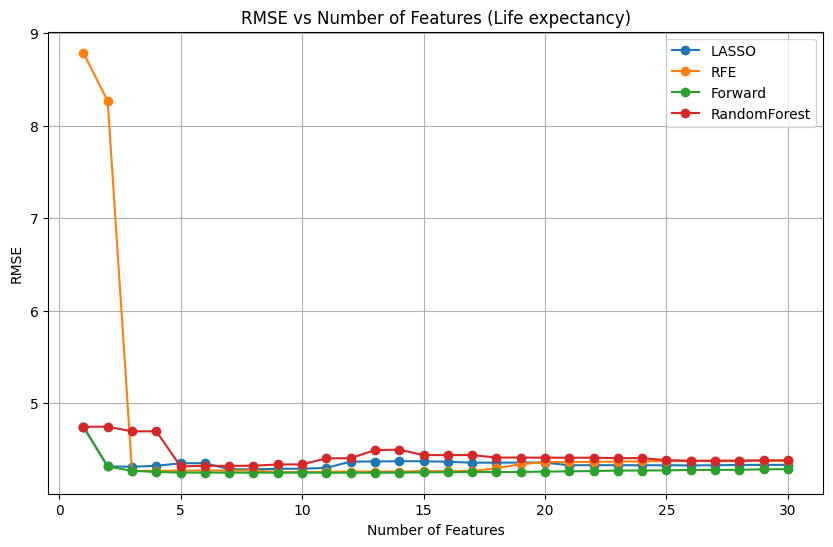

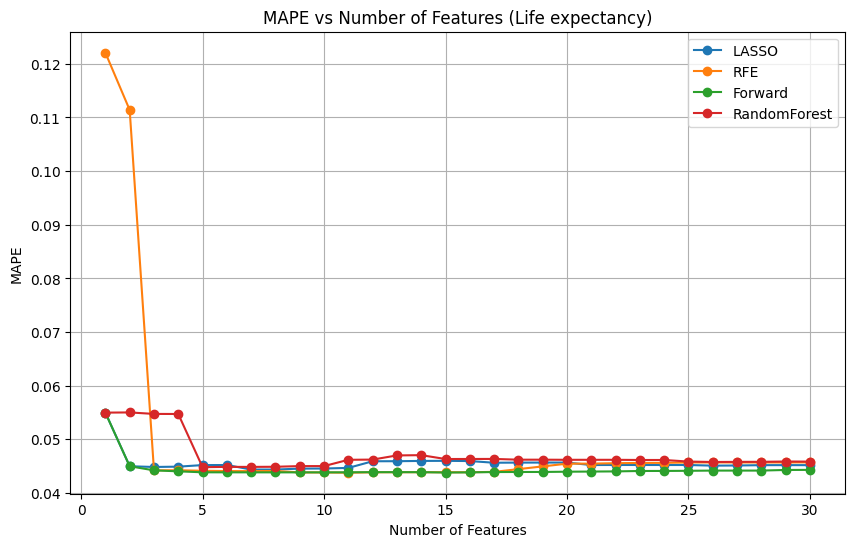

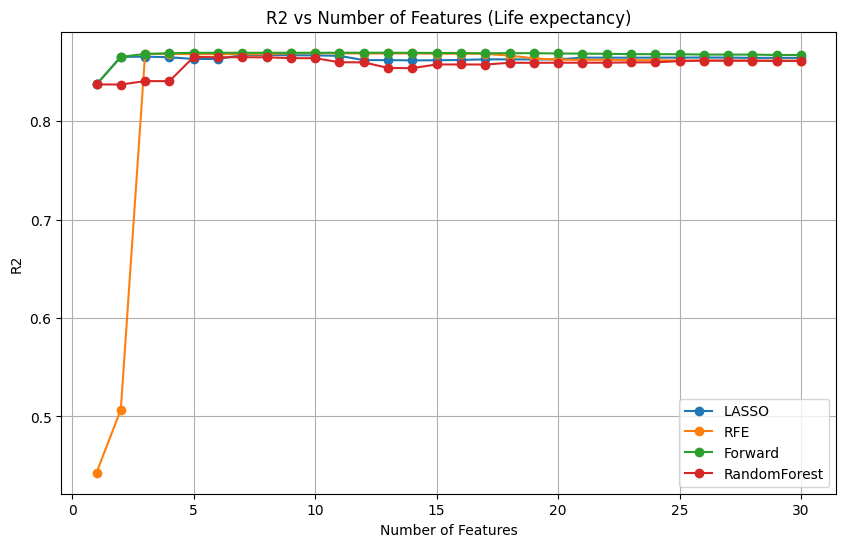


🔍 Evaluating for target: Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3344987559357833, tolerance: 1.2543280301043949
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3041213861906726, tolerance: 1.2543280301043949
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2939728821220342, tolerance: 1.2543280301043949
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:681: Converge

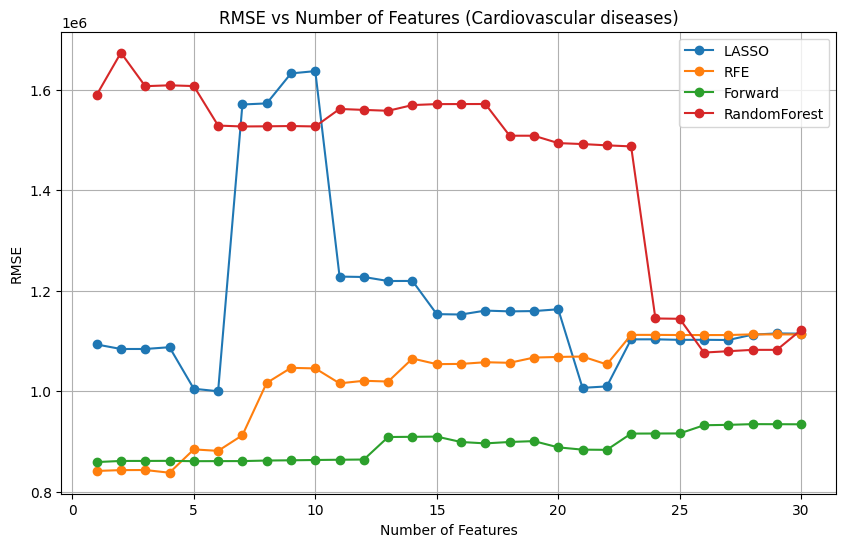

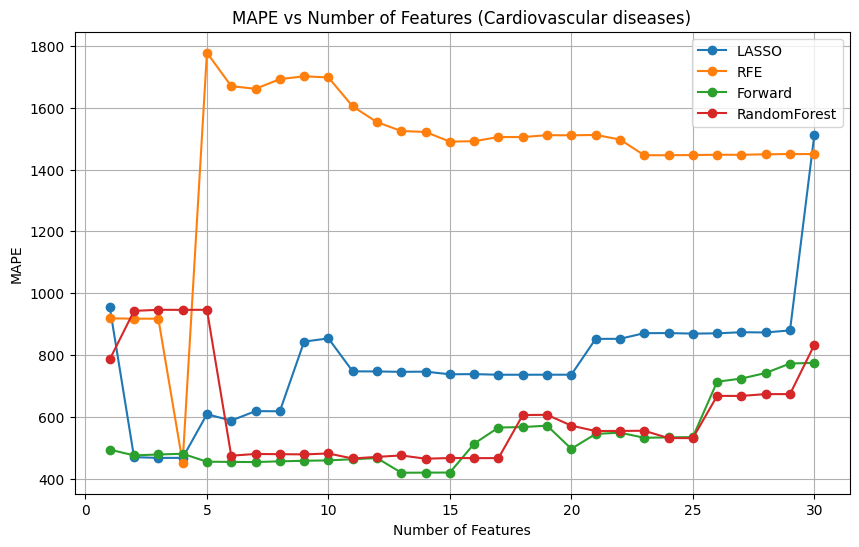

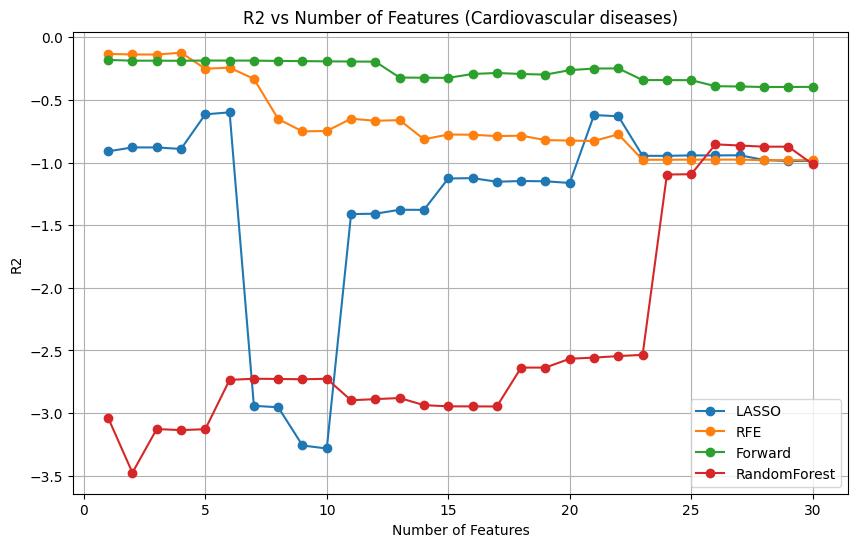


🔍 Evaluating for target: Diabetes


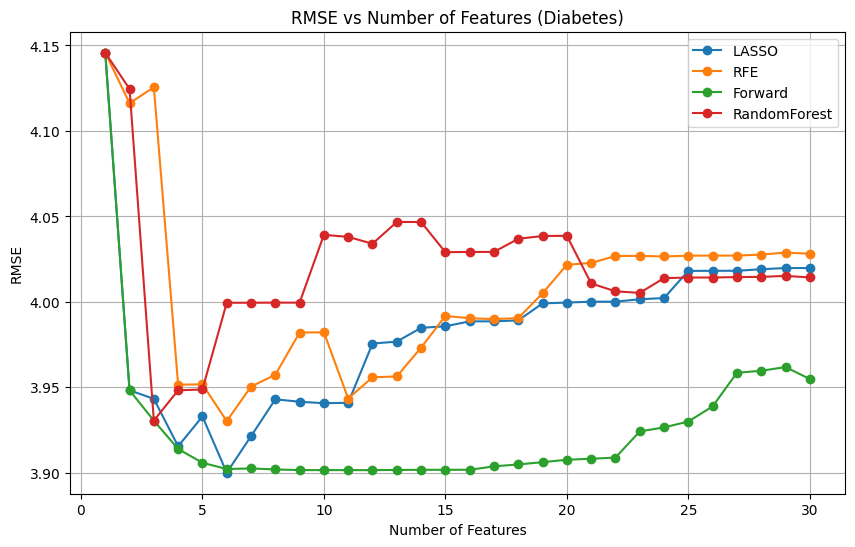

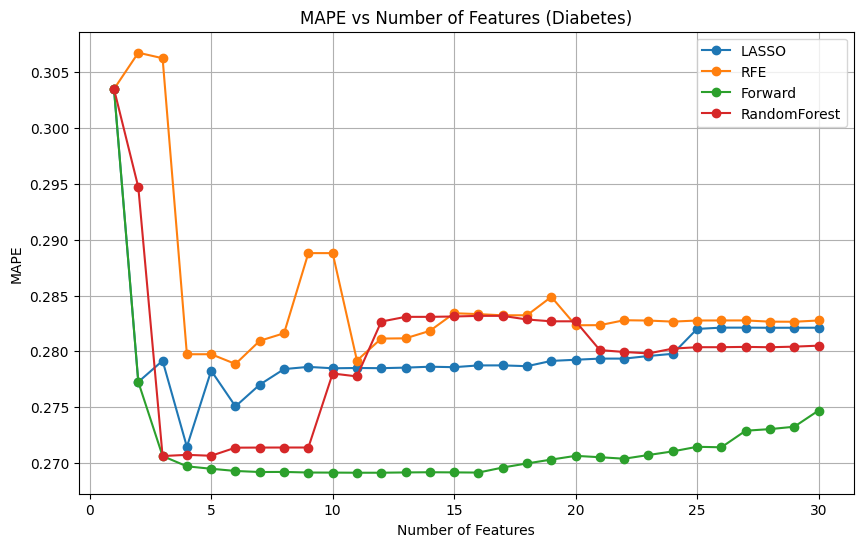

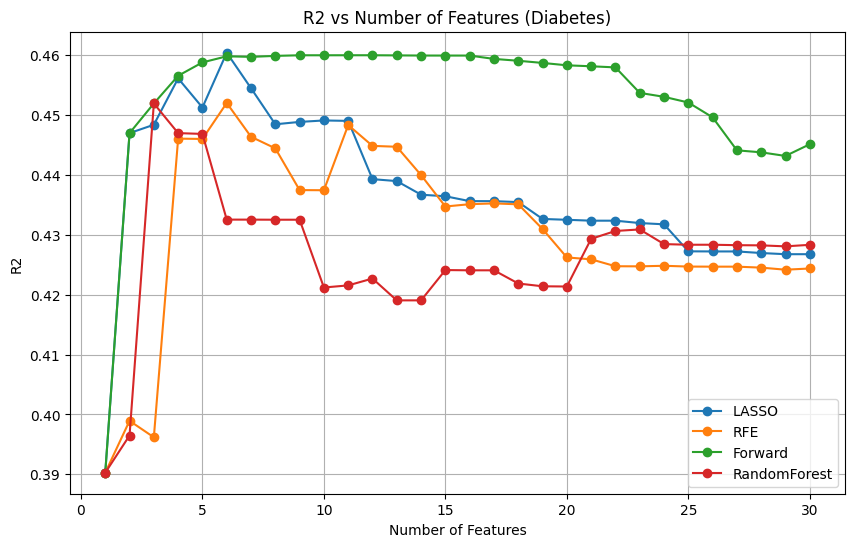

In [ ]:
# Feature selection with R sq, MAPE, MSE

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LassoCV, LinearRegression
from sklearn.feature_selection import RFE, SequentialFeatureSelector
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.preprocessing import StandardScaler

# Move plot_metrics function definition to the beginning
def plot_metrics(df_combined, target_name):
     metrics = ['RMSE', 'MAPE', 'R2']
     methods = ['LASSO', 'RFE', 'Forward', 'RandomForest']

     for metric in metrics:
         plt.figure(figsize=(10,6))
         for method in methods:
             # Check if the metric column exists for the method before plotting
             metric_col = f'{method}_{metric}'
             if metric_col in df_combined.columns:
                 plt.plot(df_combined['n_features'], df_combined[metric_col], label=method, marker='o')
             else:
                 print(f"Warning: Metric column '{metric_col}' not found in DataFrame for plotting.")

         plt.title(f'{metric} vs Number of Features ({target_name})')
         plt.xlabel('Number of Features')
         plt.ylabel(metric)
         plt.legend()
         plt.grid(True)
         plt.show()


def evaluate_model(model, X_subset, y_scaled, y_original, y_scaler, tscv):
    y_preds, y_tests = [], []
    # Ensure X_subset and y_scaled have the same index for splitting
    # Convert X_subset to DataFrame if it's numpy array to use index for splitting
    if not isinstance(X_subset, pd.DataFrame):
        # Assuming X_subset corresponds to the same rows as y_scaled
        X_subset_df = pd.DataFrame(X_subset, index=pd.Series(y_scaled).index)
    else:
        X_subset_df = X_subset

    for train_idx, test_idx in tscv.split(X_subset_df): # Use X_subset_df for splitting
        # Select data using indices from the split
        X_train, X_test = X_subset_df.iloc[train_idx], X_subset_df.iloc[test_idx]
        y_train_scaled, y_test_scaled = y_scaled[train_idx], y_scaled[test_idx]
        y_test_original = y_original[test_idx] # Select original y for test set


        # Ensure there's data in train and test sets for the current fold
        if len(X_train) > 0 and len(X_test) > 0:
            try:
                model.fit(X_train, y_train_scaled)
                y_pred_scaled = model.predict(X_test)
                y_pred_original = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
                y_preds.extend(y_pred_original)
                y_tests.extend(y_test_original)
            except Exception as e:
                 print(f"Error during model fitting or prediction in a fold: {e}")
                 # Extend with NaNs or skip if error occurs in a fold
                 y_preds.extend([np.nan] * len(y_test_original))
                 y_tests.extend(y_test_original) # Still add the test actuals to keep lists aligned

    # Calculate metrics only if y_tests and y_preds are not empty and don't contain NaNs/Infs
    y_tests_cleaned = np.array(y_tests)
    y_preds_cleaned = np.array(y_preds)

    # Remove pairs where either actual or prediction is NaN/Inf
    valid_indices = np.isfinite(y_tests_cleaned) & np.isfinite(y_preds_cleaned)
    y_tests_cleaned = y_tests_cleaned[valid_indices]
    y_preds_cleaned = y_preds_cleaned[valid_indices]

    if len(y_tests_cleaned) > 0:
        rmse = np.sqrt(mean_squared_error(y_tests_cleaned, y_preds_cleaned))
        mape = mean_absolute_percentage_error(y_tests_cleaned, y_preds_cleaned)
        r2 = r2_score(y_tests_cleaned, y_preds_cleaned)
    else:
        # Return NaN if no valid data points for metric calculation
        rmse, mape, r2 = np.nan, np.nan, np.nan

    return rmse, mape, r2

def find_best_features_with_metrics(X_df, y, max_features=None):
    # Ensure X_df has a proper index for splitting in evaluate_model
    if not isinstance(X_df.index, pd.MultiIndex):
        # Assuming X_df came from df_lagged which has MultiIndex, try to restore it
        # This might require passing the original index or ensuring X_df retains it
        # For robustness, let's assume X_df needs an index for splitting
        # A simpler approach might be to reset index in evaluate_model if it's numpy array
        pass # Let's handle index in evaluate_model as it receives X_subset

    X_scaler = StandardScaler()
    # Fit scaler on X_df values, but keep X_df as DataFrame to retain index
    X_scaled_values = X_scaler.fit_transform(X_df.values)
    X_scaled_df = pd.DataFrame(X_scaled_values, columns=X_df.columns, index=X_df.index) # Recreate DataFrame with index

    feature_names = X_scaled_df.columns.tolist()

    y = y.values.reshape(-1, 1) # y is already a Series from df_lagged, convert to numpy array
    y_original = y.ravel() # Keep original y values as numpy array

    y_scaler = StandardScaler()
    y_scaled = y_scaler.fit_transform(y).ravel() # Scale y


    tscv = TimeSeriesSplit(n_splits=5)
    max_features = min(max_features or 30, X_scaled_df.shape[1]) # Max features up to total features

    # Handle case where there are no features
    if X_scaled_df.shape[1] == 0:
        print("No features available in X_df. Skipping feature selection.")
        return pd.DataFrame(), {'LASSO': {'n_features': 0, 'rmse': np.nan, 'features': []},
                                'RFE': {'n_features': 0, 'rmse': np.nan, 'features': []},
                                'Forward': {'n_features': 0, 'rmse': np.nan, 'features': []},
                                'RandomForest': {'n_features': 0, 'rmse': np.nan, 'features': []}}


    lasso = LassoCV(cv=tscv, random_state=42).fit(X_scaled_df, y_scaled)
    lasso_coef = lasso.coef_
    # Ensure Random Forest is fitted on X_scaled_df (DataFrame)
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42).fit(X_scaled_df, y_scaled)
    importances = rf_model.feature_importances_

    results = {'LASSO': [], 'RFE': [], 'Forward': [], 'RandomForest': []}

    # Max features for loop should be <= total features
    max_loop_features = min(max_features, X_scaled_df.shape[1])


    for n in range(1, max_loop_features + 1):
        # LASSO
        idx = np.argsort(np.abs(lasso_coef))[-n:]
        # Select columns using index from X_scaled_df
        X_subset_lasso = X_scaled_df.iloc[:, idx]
        # Pass DataFrame to evaluate_model
        results['LASSO'].append((n, *evaluate_model(LinearRegression(), X_subset_lasso, y_scaled, y_original, y_scaler, tscv)))

        # RFE
        try:
            # RFE requires n_features_to_select <= n_features
            if n <= X_scaled_df.shape[1]:
                rfe = RFE(LinearRegression(), n_features_to_select=n)
                # Fit on X_scaled_df (DataFrame) and get transformed numpy array
                X_subset_rfe_np = rfe.fit_transform(X_scaled_df, y_scaled)
                # Pass numpy array to evaluate_model - evaluate_model handles conversion to DataFrame for splitting
                results['RFE'].append((n, *evaluate_model(LinearRegression(), X_subset_rfe_np, y_scaled, y_original, y_scaler, tscv)))
            else:
                 results['RFE'].append((n, np.nan, np.nan, np.nan))

        except Exception as e:
             print(f"RFE failed for n={n}: {e}")
             results['RFE'].append((n, np.nan, np.nan, np.nan))


        # Forward
        try:
            # SFS requires k_features <= n_features
            if n <= X_scaled_df.shape[1]:
                # Use X_scaled_df (DataFrame) for SFS fit
                sfs = SequentialFeatureSelector(LinearRegression(), n_features_to_select=n, direction='forward', cv=tscv, n_jobs=-1)
                 # Fit on X_scaled_df (DataFrame) and get transformed numpy array
                X_subset_sfs_np = sfs.fit_transform(X_scaled_df, y_scaled)
                # Pass numpy array to evaluate_model
                results['Forward'].append((n, *evaluate_model(LinearRegression(), X_subset_sfs_np, y_scaled, y_original, y_scaler, tscv)))
            else:
                results['Forward'].append((n, np.nan, np.nan, np.nan))
        except Exception as e:
            print(f"Forward Selection failed for n={n}: {e}")
            results['Forward'].append((n, np.nan, np.nan, np.nan))


        # RF Importance
        idx = np.argsort(importances)[-n:]
        # Select columns using index from X_scaled_df
        X_subset_rf = X_scaled_df.iloc[:, idx]
        # Pass DataFrame to evaluate_model
        results['RandomForest'].append((n, *evaluate_model(LinearRegression(), X_subset_rf, y_scaled, y_original, y_scaler, tscv)))

    # Build metrics DataFrame
    dfs = []
    for method, vals in results.items():
        df = pd.DataFrame(vals, columns=['n_features', f'{method}_RMSE', f'{method}_MAPE', f'{method}_R2'])
        dfs.append(df)

    df_combined = dfs[0]
    for df in dfs[1:]:
        df_combined = df_combined.merge(df, on='n_features', how='outer')

    return df_combined

# Assuming df_lagged is available and contains the data with lags
# Assuming target_cols is defined

target_cols = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']
results = {}

for target in target_cols:
    # Ensure df_lagged is available and contains the target column
    if 'df_lagged' in locals() and target in df_lagged.columns:
        lag_cols = [f'{target}_lag1', f'{target}_lag2']
        # Ensure we only try to drop columns that exist in df_lagged
        cols_to_drop = [target] + [col for col in lag_cols if col in df_lagged.columns]

        # Select features for X - drop target(s) and their lags
        X = df_lagged.drop(columns=cols_to_drop)
        # Select the current target variable and drop NaNs
        y = df_lagged[target].dropna()

        # Align X with the cleaned y by index
        X = X.loc[y.index]


        # Ensure X is not empty after aligning with y
        if X.empty:
            print(f"No valid data points after dropping NaNs for target: {target}. Skipping evaluation.")
            results[target] = pd.DataFrame() # Store an empty DataFrame
            continue


        print(f"\n🔍 Evaluating for target: {target}")
        # Pass X as a DataFrame and y as a Series (without NaNs)
        df_metrics = find_best_features_with_metrics(X, y)
        results[target] = df_metrics

        # Plot metrics for the current target only if df_metrics is not empty
        if not df_metrics.empty:
             plot_metrics(df_metrics, target)
        else:
             print(f"No metrics to plot for target: {target}.")


    else:
        print(f"df_lagged or target column '{target}' not found. Skipping evaluation for this target.")

## Comparative Summary Table - Feature Selection with metrics (RMSE, MAPE, and R²)


In [ ]:
## The best Feature Selection with different metrics TABLE -  REVISED - Seed not fixed

# Install tabulate if needed
!pip install tabulate

from sklearn.linear_model import Ridge, LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SequentialFeatureSelector, RFE
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer # Import Imputer

# Main function to calculate metrics for a given set of features
def calculate_metrics_for_features(X_df, y, feature_indices):
    # Impute missing values in X_df
    imputer = SimpleImputer(strategy='mean')
    X_df_imputed = pd.DataFrame(imputer.fit_transform(X_df), columns=X_df.columns, index=X_df.index)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_df_imputed) # Use imputed data here
    y = y.values.reshape(-1, 1)
    y_scaler = StandardScaler().fit(y)
    y_scaled = y_scaler.transform(y).ravel()
    y_original = y.ravel()
    tscv = TimeSeriesSplit(n_splits=3)

    X_subset = X_scaled[:, feature_indices]

    y_preds, y_tests = [], []
    for train_idx, test_idx in tscv.split(X_subset):
        model = Ridge()
        model.fit(X_subset[train_idx], y_scaled[train_idx])
        pred = model.predict(X_subset[test_idx])
        y_pred = y_scaler.inverse_transform(pred.reshape(-1, 1)).ravel()
        y_preds.extend(y_pred)
        y_tests.extend(y_original[test_idx])

    return (
        np.sqrt(mean_squared_error(y_tests, y_preds)),
        mean_absolute_error(y_tests, y_preds),
        r2_score(y_tests, y_preds)
    )

# Extract Best Results per Method from the 'results' dictionary
def extract_best_per_method(results_dict, X_data_for_targets, y_data_for_targets):
    summary = []
    for target, target_results in results_dict.items():
        df_combined = target_results['df_combined']
        best_methods_info = target_results['best_methods']
        X_target = X_data_for_targets[target] # Get the correct X for this target
        y_target = y_data_for_targets[target] # Get the correct y for this target


        for method, info in best_methods_info.items():
            n_features = info['n_features']
            selected_feature_names = info['features']

            # Get the indices of the selected features from the X_target DataFrame columns
            try:
                # Ensure selected_feature_names are in the columns of X_target
                valid_selected_features = [col for col in selected_feature_names if col in X_target.columns]
                feature_indices = [X_target.columns.get_loc(col) for col in valid_selected_features]

            except KeyError as e:
                 print(f"Error: Feature '{e}' not found in original DataFrame columns for target {target}, method {method}. Skipping.")
                 continue # Skip this combination if features are not found


            if n_features > 0 and feature_indices:
                 # Calculate metrics using the selected features and the correct X_target and y_target
                 # Pass the subset of X_target using the valid_selected_features column names
                 rmse, mae, r2 = calculate_metrics_for_features(X_target[valid_selected_features], y_target, list(range(len(valid_selected_features)))) # Pass indices relative to the subset


                 summary.append({
                     'Target': target,
                     'Method': method,
                     'n_features': len(valid_selected_features), # Use the count of valid features
                     'RMSE': round(rmse, 2),
                     'MAE': round(mae, 2),
                     'R²': round(r2, 4)
                 })
            elif n_features == 0:
                 # Handle case with 0 features if necessary, although typically we select at least 1
                 summary.append({
                     'Target': target,
                     'Method': method,
                     'n_features': 0,
                     'RMSE': np.nan, # Or a baseline metric if applicable
                     'MAE': np.nan,
                     'R²': np.nan
                 })


    return pd.DataFrame(summary)

# Assuming df_lagged is available from previous steps
# Prepare the X and y dataframes for each target as they were used in the feature selection loop
target_cols = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']
X_data_for_targets = {}
y_data_for_targets = {}

if 'df_lagged' in locals():
    for target in target_cols:
        if target in df_lagged.columns:
            lag_cols = [f'{target}_lag1', f'{target}_lag2']
            cols_to_drop = [target] + [col for col in lag_cols if col in df_lagged.columns]
            X = df_lagged.drop(columns=cols_to_drop)
            y = df_lagged[target].dropna() # Use the y with NaNs dropped as in the previous cell

            # Align X with the cleaned y by index
            X = X.loc[y.index]

            X_data_for_targets[target] = X
            y_data_for_targets[target] = y
        else:
            print(f"Target column '{target}' not found in df_lagged. Cannot prepare data for this target.")

# Extract Best Results per Method
# Use the 'results' dictionary generated from the previous cell's execution and the prepared X and y data
if 'results' in locals() and results and X_data_for_targets and y_data_for_targets:
    best_performance_df = extract_best_per_method(results, X_data_for_targets, y_data_for_targets)

    # Print Final Table
    if not best_performance_df.empty:
        print("\nBest Performance per Method\n")
        print(tabulate(best_performance_df, headers='keys', tablefmt='fancy_grid', showindex=False))
    else:
        print("\nNo best performance results to display.")
else:
    print("\n'results' dictionary, X_data_for_targets, or y_data_for_targets not found or is empty. Please run the feature selection cell first and ensure data is prepared correctly.")

# export and download file
best_performance_df.to_csv("best_feature_selection_summary.csv", index=False)

from google.colab import files
files.download("best_feature_selection_summary.csv")




Best Performance per Method

╒═════════════════════════╤══════════════╤══════════════╤════════╤═══════╤═════════╕
│ Target                  │ Method       │   n_features │   RMSE │   MAE │      R² │
╞═════════════════════════╪══════════════╪══════════════╪════════╪═══════╪═════════╡
│ Cardiovascular diseases │ LASSO        │            3 │ 144.69 │ 37.6  │  0.0043 │
├─────────────────────────┼──────────────┼──────────────┼────────┼───────┼─────────┤
│ Cardiovascular diseases │ RFE          │            3 │ 144.51 │ 38.52 │  0.0067 │
├─────────────────────────┼──────────────┼──────────────┼────────┼───────┼─────────┤
│ Cardiovascular diseases │ Forward      │           11 │ 145.41 │ 37.95 │ -0.0056 │
├─────────────────────────┼──────────────┼──────────────┼────────┼───────┼─────────┤
│ Cardiovascular diseases │ RandomForest │            3 │ 145.32 │ 37.89 │ -0.0044 │
├─────────────────────────┼──────────────┼──────────────┼────────┼───────┼─────────┤
│ Diabetes                │ LASSO  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Base on the result of the table, the following Feature Selection method and number of features will be used in this study as follows:

* Life Expectancy	 -  Forward	Selection  - # of features = 17	     

* Cardiovascular Diseases -	RFE  - # of features = 3	   

* Diabetes	- Forward Selection	 - # of features = 17	   

In [ ]:
# Feature Importance Table - REVISED

from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# === Setup
targets = ['Cardiovascular diseases', 'Diabetes', 'Life expectancy']
methods = ['Forward', 'RFE', 'LASSO', 'Random Forest']
all_features = [
    'Child mortality rate', 'Child mortality rate_lag3', 'GDP', 'Sex ratio_lag1', 'Unemployment Rate_lag1',
    'Cost of a healthy diet', 'Child mortality rate_lag2', 'Sex ratio', 'Sex ratio_lag2', 'Unemployment Rate',
    'Unemployment Rate_lag3', 'Unemployment Rate_lag2', 'Sex ratio_lag3', 'Cost of a healthy diet_lag1',
    'Cost of a healthy diet_lag2', 'Cost of a healthy diet_lag3', 'GDP_lag1','BMI_avg_lag3', 'Income',
    'GDP_lag3', 'Median age_lag3', 'Income_lag3', 'Income_lag2', 'Income_lag1', 'GDP_lag2', 'BMI_avg_lag2',
    'BMI_avg_lag1', 'BMI_avg','Incomplete tertiary education'
]

# === Initialize importance table
multi_method_importance = pd.DataFrame(index=all_features,
                                       columns=pd.MultiIndex.from_product([targets, methods]),
                                       dtype=float).fillna(0.0)

# === Function: Standardization and prep
def prepare_data(target, features):
    valid_features = [f for f in features if f in df_lagged.columns]
    df_temp = df_lagged[valid_features + [target]].dropna()
    X = df_temp[valid_features]
    y = df_temp[target]
    X_scaled = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns)
    return X_scaled, y, valid_features

# === FORWARD SELECTION
def run_forward(X, y, valid_features, max_features):
    selected = []
    remaining = valid_features.copy()
    for _ in range(min(max_features, len(remaining))):
        scores = {}
        for f in remaining:
            trial = selected + [f]
            model = LinearRegression()
            neg_mse = cross_val_score(model, X[trial], y,
                                      scoring='neg_mean_squared_error', cv=5)
            rmse = np.mean(np.sqrt(-neg_mse))
            scores[f] = rmse
        best_feature = min(scores, key=scores.get)
        selected.append(best_feature)
        remaining.remove(best_feature)
    for f in selected:
        multi_method_importance.loc[f, (target, 'Forward')] = 1

# === RFE
def run_rfe(X, y, valid_features, num_features):
    model = LinearRegression()
    selector = RFE(model, n_features_to_select=num_features)
    selector = selector.fit(X, y)
    for f, support in zip(valid_features, selector.support_):
        if support:
            multi_method_importance.loc[f, (target, 'RFE')] = 1

# === LASSO
def run_lasso(X, y):
    model = LassoCV(cv=5, random_state=42)
    model.fit(X, y)
    for i, f in enumerate(X.columns):
        multi_method_importance.loc[f, (target, 'LASSO')] = round(abs(model.coef_[i]), 4)

# === RANDOM FOREST
def run_rf(X, y):
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    importances = rf.feature_importances_
    for i, f in enumerate(X.columns):
        multi_method_importance.loc[f, (target, 'Random Forest')] = round(importances[i], 4)

# === Run loop for all targets
for target in targets:
    if target not in df_lagged.columns:
        print(f"⚠️ Skipping {target} — not found in dataset.")
        continue

    X_scaled, y, valid = prepare_data(target, all_features)

    run_forward(X_scaled, y, valid, max_features=17 if target != 'Cardiovascular diseases' else 3)
    run_rfe(X_scaled, y, valid, num_features=3)
    run_lasso(X_scaled, y)
    run_rf(X_scaled, y)

# === Display styled table
styled_multi_table = multi_method_importance.style \
    .set_caption("📊 Multi-Method Feature Importance Table") \
    .format(precision=4) \
    .set_table_styles([
        {'selector': 'table', 'props': [('border-collapse', 'collapse'),
                                        ('border', '1px solid black')]},
        {'selector': 'th, td', 'props': [('border', '1px solid black'), ('padding', '4px')]}
    ])

# Display multi table

# Summary table combining the feature importance score with descending order for each target
for target in targets:
    col_forward = (target, 'Forward')
    col_rfe = (target, 'RFE')
    col_lasso = (target, 'LASSO')
    col_rf = (target, 'Random Forest')

    combined_name = (target, 'Combined')
    multi_method_importance[combined_name] = (
        multi_method_importance[col_forward].fillna(0) +
        multi_method_importance[col_rfe].fillna(0) +
        multi_method_importance[col_lasso].fillna(0) +
        multi_method_importance[col_rf].fillna(0)
    )

# === Reorder for display: sort by combined score for each target
for target in targets:
    sort_col = (target, 'Combined')
    sorted_features = multi_method_importance.sort_values(by=sort_col, ascending=False).index
    multi_method_importance = multi_method_importance.loc[sorted_features]

# === Display enhanced table
styled_combined_table = multi_method_importance.style \
    .set_caption("⭐ Enhanced Feature Importance Comparison (4 Methods + Combined)") \
    .format(precision=4) \
    .set_table_styles([
        {'selector': 'table', 'props': [('border-collapse', 'collapse'), ('border', '1px solid black')]},
        {'selector': 'th, td', 'props': [('border', '1px solid black'), ('padding', '5px')]}
    ])

display(styled_combined_table)

# Save the file
multi_method_importance.to_csv("enhanced_feature_importance_comparison.csv", index=True)

# Download the file (include full path)
from google.colab import files
files.download('enhanced_feature_importance_comparison.csv')





<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Refer to the above table - The feature importance analysis across multiple selection methods—Forward Selection, Recursive Feature Elimination (RFE), LASSO, and Random Forest—reveals distinct and insightful patterns in how different variables relate to three key health outcomes: life expectancy, diabetes, and cardiovascular diseases (CVD). For life expectancy, the most dominant predictor is child mortality rate, including its lagged versions. This finding underscores a strong inverse relationship between child mortality and life expectancy, highlighting the long-term benefits of improving early childhood health. Other notable features include lagged BMI averages and socioeconomic indicators such as income and sex ratio, suggesting that both historical health trends and broader demographic factors influence longevity.

In the case of diabetes, the most influential feature is BMI_avg_lag3, indicating that higher BMI levels from three years prior are a strong predictor of diabetes prevalence. This reflects the chronic and gradual development of diabetes linked to long-term obesity. Socioeconomic factors like income, the cost of a healthy diet, and lagged income variables also emerge as important predictors, suggesting that financial access to healthy food and lifestyle conditions are significant contributors. Additionally, lagged sex ratio and income highlight the delayed impact of gender distribution and earnings on diabetes rates.

For cardiovascular diseases, BMI_avg_lag3 again stands out as a major factor, pointing to obesity’s long-term role in heart-related conditions. Uniquely, education-related features, such as incomplete tertiary education, show relevance only for CVD, indicating that educational attainment may influence cardiovascular health through awareness, healthcare access, or lifestyle choices. Economic indicators like GDP and income also contribute but to a lesser extent than for diabetes or life expectancy.

Across all targets, lagged variables consistently outperform current-year features, emphasizing the delayed effects of socioeconomic and health conditions on public health outcomes. For instance, lagged income, BMI, and child mortality often provide stronger predictive power than their contemporaneous counterparts. This suggests that interventions in health or economic policy may take several years to manifest in population health metrics, reinforcing the need for long-term planning in public health strategies.

The results also align well with potential research questions. Firstly, key predictors for each outcome were identified, showing that health outcomes are driven by a mix of socio-economic, demographic, and lagged health indicators. Secondly, the importance of lagged features strongly supports the hypothesis that delayed effects exist and can be captured through temporal modeling. Lastly, certain predictors such as BMI_avg_lag3, income, and child mortality prove robust across multiple selection methods, confirming their consistent relevance.

In summary, this feature importance analysis not only highlights the leading drivers of life expectancy, diabetes, and cardiovascular diseases but also reveals the critical role of historical data in shaping current health outcomes. These insights provide valuable guidance for public health planning, suggesting that investments in early-life health, economic accessibility, and education can yield significant long-term benefits across diverse health indicators.

## Feature Importance Plot

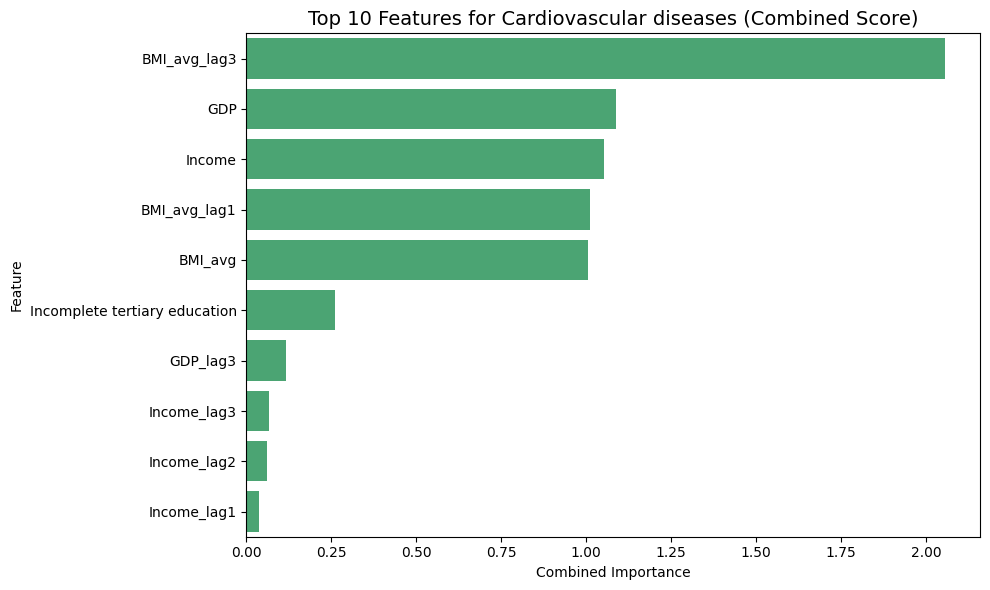

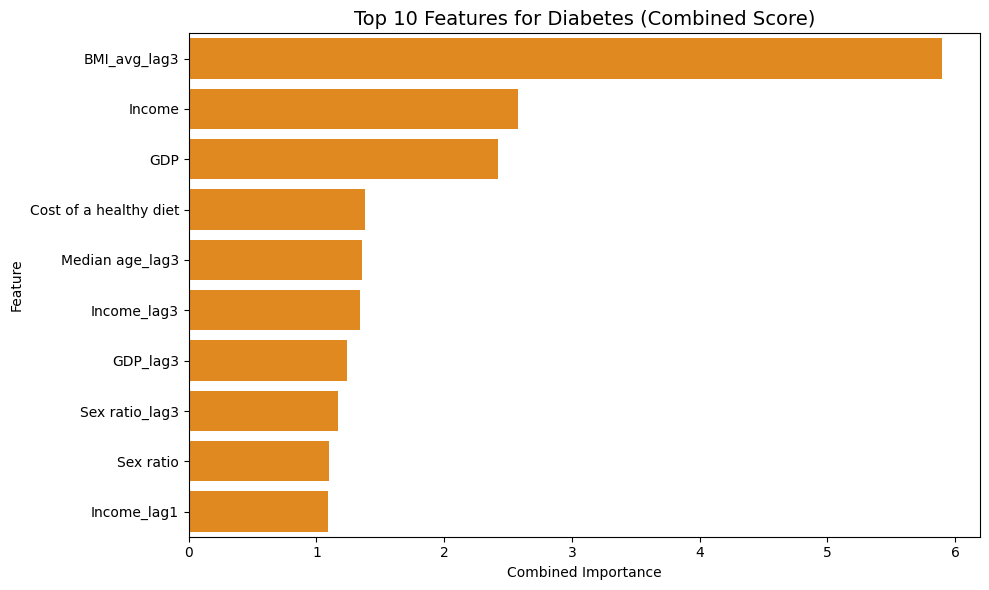

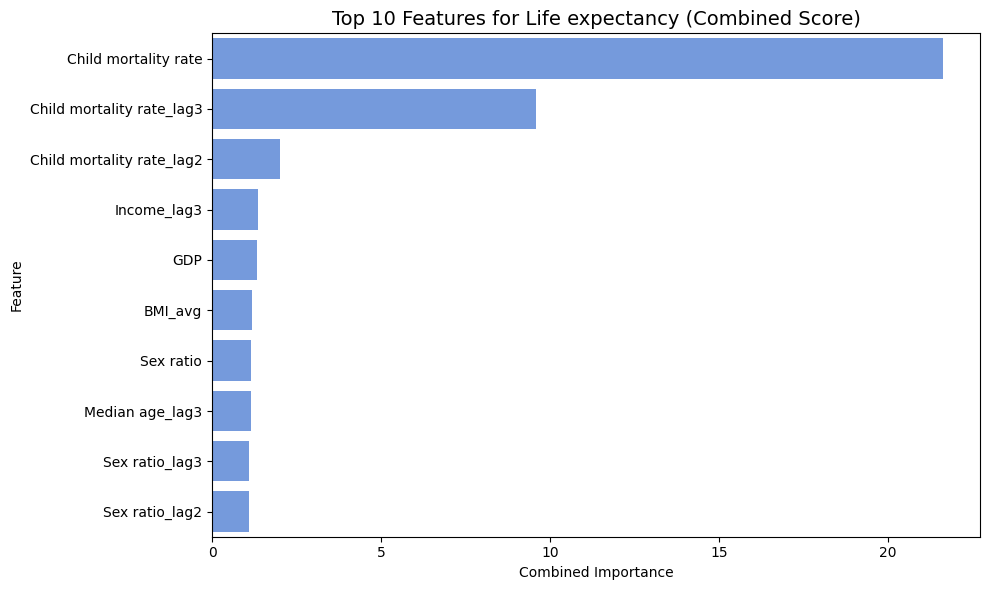

In [ ]:
# Bar Plot top features per target based on combined score

# === Custom color map
custom_colors = {
    'Cardiovascular diseases': 'mediumseagreen',
    'Diabetes': 'darkorange',
    'Life expectancy': 'cornflowerblue'
}
targets = ['Cardiovascular diseases', 'Diabetes', 'Life expectancy']
# === Plot top features per target with color
top_n = 10  # adjust as needed
for target in targets:
    combined_col = (target, 'Combined')
    df_top = multi_method_importance[[combined_col]].copy()
    df_top.columns = ['Combined Score']
    df_top = df_top.sort_values(by='Combined Score', ascending=False).head(top_n)

    plt.figure(figsize=(10, 6))
    sns.barplot(x='Combined Score', y=df_top.index, data=df_top, color=custom_colors[target])
    plt.title(f"Top {top_n} Features for {target} (Combined Score)", fontsize=14)
    plt.xlabel("Combined Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

The Augmented Dickey-Fuller (ADF) test results provide critical insight into the time series characteristics of the three key health outcomes in this study: life expectancy, diabetes, and cardiovascular diseases. All three variables demonstrate strong stationarity, as indicated by highly negative ADF statistics (e.g., -18.54 for life expectancy, -12.63 for cardiovascular diseases, and -12.32 for diabetes) and extremely low p-values (all near zero). These values are well below conventional significance thresholds (0.01 or 0.05), confirming that the time series are stationary—that is, their statistical properties such as mean and variance remain stable over time.rmance over time.



## ACF and PACF plot

ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function) plots are visual tools used to analyze the correlation structure of time series data. They help identify patterns and dependencies between data points at different lags (time intervals) and are crucial for determining appropriate models for time series forecasting, particularly AR (Autoregressive) and MA (Moving Average) models.


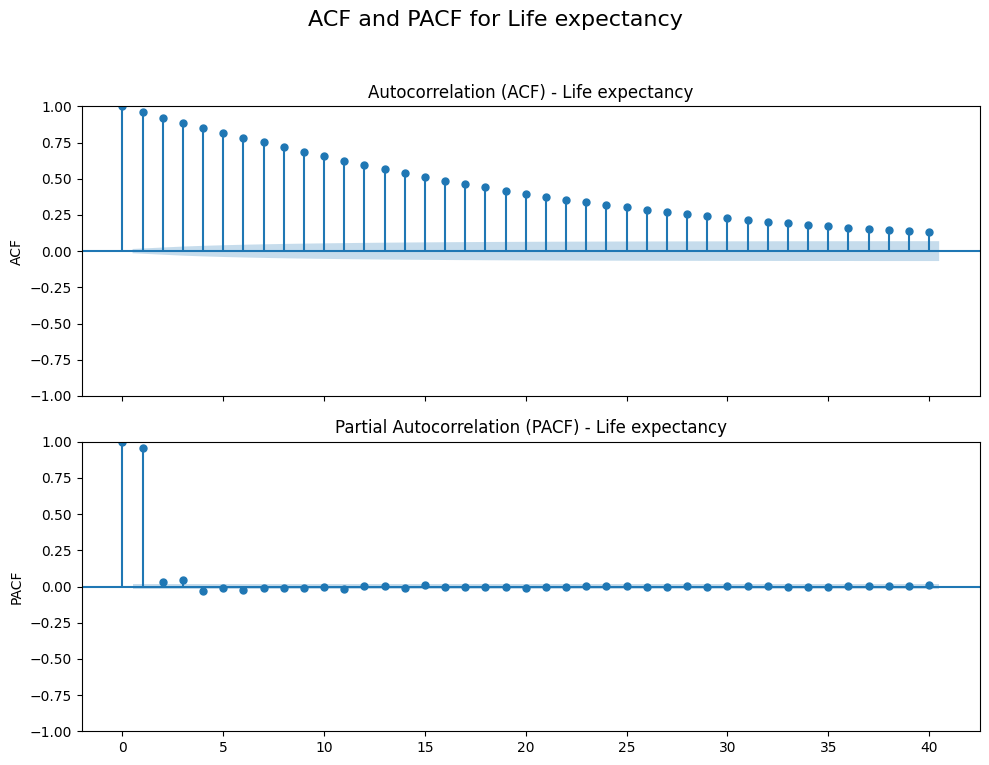

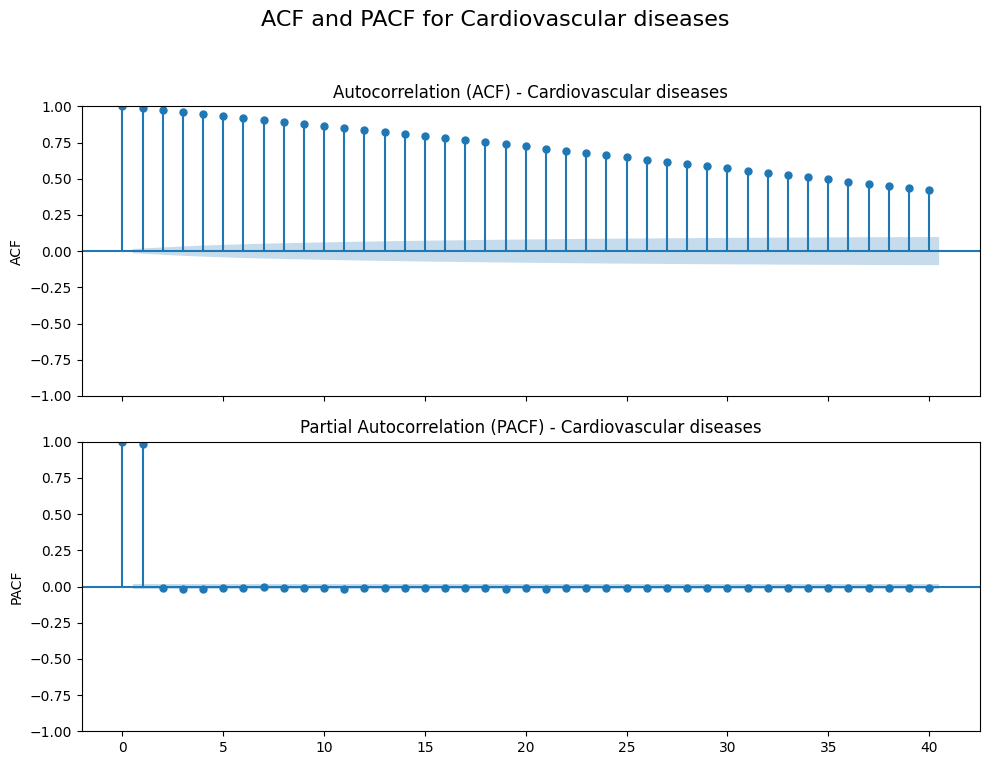

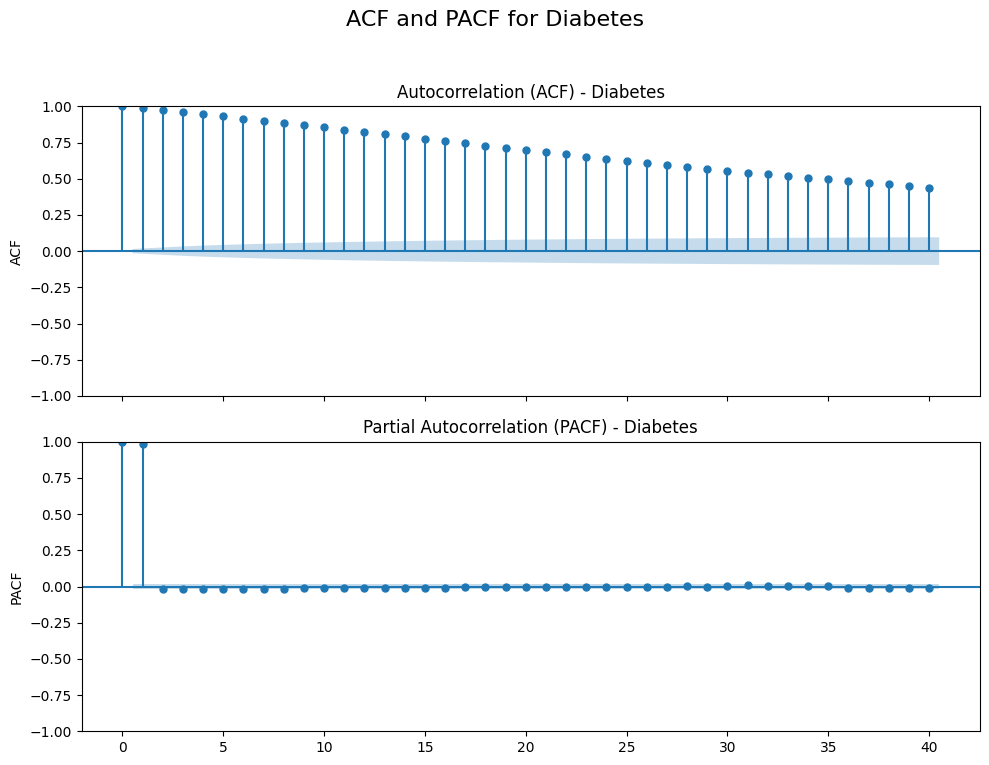

In [ ]:
# ACF and PACF plot

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming df_lagged is your dataset and contains time-series data
target_cols = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']

for target in target_cols:
    series = df_lagged[target].dropna()

    fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
    fig.suptitle(f'ACF and PACF for {target}', fontsize=16)

    plot_acf(series, lags=40, ax=ax[0])
    ax[0].set_title(f'Autocorrelation (ACF) - {target}')
    ax[0].set_ylabel('ACF')

    plot_pacf(series, lags=40, ax=ax[1], method='ywm')
    ax[1].set_title(f'Partial Autocorrelation (PACF) - {target}')
    ax[1].set_ylabel('PACF')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Based on the plot of ACF and PACF, for all targets on both the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots show significant spikes that gradually decay over time, it strongly suggests that the series contains autocorrelation — meaning past values have a measurable influence on future ones. This is particularly common in time-series data with memory or lag effects. The ACF’s slow decay pattern indicates that a moving average (MA) component may be present, while the PACF plot with very strong spikes at the first two lags points to a likely autoregressive structure of order two, also known as AR(2). In this case, the series is heavily influenced by its own values from one and two time steps prior. Together, these patterns imply that an ARIMA model would be a suitable fit, specifically one with parameters ARIMA(2, 0, q), where "p = 2" captures the autoregressive lags, "d = 0" reflects the fact that the series is stationary (as shown in the ADF test), and "q" is chosen based on how far the ACF continues to show significant autocorrelation. These insights are instrumental in designing lag-based features or selecting model architectures that are sensitive to temporal dynamics, such as ARIMA, SARIMA, or even recurrent neural networks.

In this forecasting project, three lags (lag1, lag2, and lag3) were chosen for time-dependent predictors based on both statistical diagnostics and inference validation. The Partial Autocorrelation Function (PACF) plots consistently showed strong spikes at lag 1 and lag 2, with a noticeable flattening from lag 3 onward. This suggested an autoregressive structure primarily governed by the first two time steps. However, subsequent HAC-corrected regression analysis revealed that certain lag3 features, including economic and health indicators, eg. CPI, BMI, Inflation and Income etc. were still statistically significant (p < 0.05), confirming their meaningful contribution despite weaker autocorrelation beyond lag 2. By including lag3 in the modeling framework alongside lag1 and lag2, the models captured short-term memory effects while allowing for delayed impacts that are often present in real-world socioeconomic dynamics. This decision ensures a balance between temporal relevance and statistical validity, strengthening both the explanatory power and forecasting accuracy of the models.



## Residual diagnostics (heteroscedasticity, autocorrelation)

Residual diagnostics and the ADF (Augmented Dickey-Fuller) test are important tools in time series modeling that help ensure the models are valid, interpretable, and produce reliable forecasts.

Residual diagnostics involve analyzing the residuals means the differences between the actual values and the predicted values from your model. These diagnostics test whether your model assumptions hold, particularly in regression or forecasting models. For example, the Breusch-Pagan test checks for heteroscedasticity, which is when the variance of residuals is not constant over time. Constant variance is a key assumption in linear regression; if violated, it can lead to inefficient or biased estimates. Similarly, the Ljung-Box test assesses whether residuals are autocorrelated, which means they are correlated across time. If residuals show autocorrelation, your model has likely failed to capture some time-based structure in the data, indicating the model is underfitting or misspecified. Performing these diagnostics ensures that your model is statistically sound and that the insights or forecasts it provides are trustworthy.

In [ ]:
# Residual Diagnostics - Test and Summary Table -  REVISED

import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.diagnostic import acorr_ljungbox
import pandas as pd
import numpy as np
from tabulate import tabulate
from google.colab import files

# === Function: Residual Diagnostics for one target ===
def residual_diagnostics(X, y):
    data = pd.concat([X, y], axis=1).dropna()
    X_cleaned = data[X.columns]
    y_cleaned = data[y.name]

    X_const = sm.add_constant(X_cleaned)
    model = sm.OLS(y_cleaned, X_const).fit()
    residuals = model.resid

    # Breusch-Pagan Test
    bp_test = het_breuschpagan(residuals, X_const.loc[residuals.index])
    bp_labels = ['LM stat', 'BP p-value', 'BP f-value', 'BP f p-value']
    bp_results = dict(zip(bp_labels, bp_test))

    # Ljung-Box Test
    if len(residuals) > 10:
        lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
        lb_pvalue = lb_test['lb_pvalue'].iloc[0]
    else:
        lb_pvalue = "Insufficient data (n < 10)"

    return bp_results, lb_pvalue, residuals

# === Setup
target_cols = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']
diagnostics_summary = []

if 'df_lagged' in locals():
    for target_col in target_cols:
        print(f"\n Running diagnostics for: {target_col}")

        if target_col not in df_lagged.columns:
            print(f" Skipping {target_col} — not found in df_lagged")
            continue

        y = df_lagged[target_col]
        X = df_lagged.drop(columns=target_cols, errors='ignore')

        data = pd.concat([X, y], axis=1).dropna()
        if data.empty:
            print(" Not enough data after dropping NaNs")
            continue

        bp_results, lb_pvalue, residuals = residual_diagnostics(X, y)
        diagnostics_summary.append({
            "Target": target_col,
            "Breusch-Pagan LM stat": round(bp_results['LM stat'], 4),
            "BP p-value": round(bp_results['BP p-value'], 4),
            "BP f-value": round(bp_results['BP f-value'], 4),
            "BP f p-value": round(bp_results['BP f p-value'], 4),
            "Ljung-Box p-value (lag=10)": lb_pvalue,
            "Residual Mean": round(residuals.mean(), 4),
            "Residual Variance": round(residuals.var(), 4)
        })

    # === Create summary table
    diagnostics_df = pd.DataFrame(diagnostics_summary)

    # Print as fancy table
    print("\n📋 Residual Diagnostics Summary:")
    print(tabulate(diagnostics_df, headers='keys', tablefmt='fancy_grid', showindex=False))

    # === Export to CSV
    filename = "residual_diagnostics_summary.csv"
    diagnostics_df.to_csv(filename, index=False)

    # Download the file (include full path)
    from google.colab import files
    files.download(filename)

else:
    print("❗ df_lagged is not defined. Please run your preprocessing cell first.")





 Running diagnostics for: Life expectancy

 Running diagnostics for: Cardiovascular diseases

 Running diagnostics for: Diabetes

📋 Residual Diagnostics Summary:
╒═════════════════════════╤═════════════════════════╤══════════════╤══════════════╤════════════════╤══════════════════════════════╤═════════════════╤═════════════════════╕
│ Target                  │   Breusch-Pagan LM stat │   BP p-value │   BP f-value │   BP f p-value │   Ljung-Box p-value (lag=10) │   Residual Mean │   Residual Variance │
╞═════════════════════════╪═════════════════════════╪══════════════╪══════════════╪════════════════╪══════════════════════════════╪═════════════════╪═════════════════════╡
│ Life expectancy         │                1054.96  │            0 │      23.3712 │              0 │                            0 │               0 │             11.3211 │
├─────────────────────────┼─────────────────────────┼──────────────┼──────────────┼────────────────┼──────────────────────────────┼─────────────────┼

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


For life expectancy, the model displays significant signs of both heteroscedasticity and autocorrelation. The Breusch-Pagan test results show extremely low p-values, indicating that the variance of residuals is not constant and may vary depending on specific predictor values. This suggests that the linear model may be missing key nonlinear components or interaction terms that could stabilize prediction behavior. Additionally, the Ljung-Box test reveals strong autocorrelation at lag 10, meaning past errors are influencing current ones — a sign that temporal patterns are not fully addressed. While the mean residual is centered at zero, which reflects no bias, the residual variance of 11.32 indicates moderate inconsistency in prediction accuracy across observations.

For diabetes, the residual profile reveals similar issues. The Breusch-Pagan test indicates pronounced heteroscedasticity, reinforcing the idea that predictor influence changes across the prediction space, particularly among metabolic or demographic variables like BMI and age. Autocorrelation is again significant according to the Ljung-Box test, implying model limitations in capturing lagged or sequential health dynamics. Although the mean residual is virtually zero — a good sign for bias — the variance of 9.85 suggests moderate prediction error dispersion, warranting further refinement in feature interaction or time-aware modeling.

The cardiovascular diseases model also shows clear heteroscedasticity, as highlighted by the Breusch-Pagan results with very low p-values. Autocorrelation is present, which points to time-based dependencies not fully captured in the linear framework. Most strikingly, the residual variance is extremely high at 19,607.45, hinting at either model instability, data skewness, or presence of outliers that are drastically affecting performance. Despite having a neutral residual mean, the model appears highly sensitive to certain predictors and may benefit from robust regression techniques or transformations to control volatility.

Overall, all three models demonstrate residual patterns that suggest issues with non-constant variance and temporal correlation. These findings recommend considering more flexible approaches such as time-series models, generalized least squares, or regression techniques that accommodate heteroscedasticity and autocorrelation directly. Enhancing each model to better capture nonlinearities or lag structures could meaningfully improve predictive reliability and interpretability.

## Residual Diagrams
## Heteroscedasticity and Autocorrelation Consistent (HAC)




According the result of Residual Diagnostics indicate that the model's residuals exhibit both heteroscedasticity and autocorrelation, which violate the assumption of constant variance and independence of residuals ordinary least squares (OLS) regression.  

To solve this problem by using robust standard errors (Heteroskedasticity-Autocorrelation Consistent or HAC standard errors) that account for both heteroscedasticity and autocorrelation in the variance-covariance matrix.

HAC corrected standard errors (like from Newey-West estimator) adjust the model's coefficient uncertainty when residuals are non-constant and correlated across time. It doesn't change the point estimates, but it makes the statistical tests more reliable — especially t-values, p-values, and confidence intervals.


=== Newey-West Adjusted OLS Results for: Life expectancy ===
                            OLS Regression Results                            
Dep. Variable:        Life expectancy   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     1.278
Date:                Thu, 24 Jul 2025   Prob (F-statistic):              0.276
Time:                        19:55:10   Log-Likelihood:                -44559.
No. Observations:               16928   AIC:                         8.922e+04
Df Residuals:                   16879   BIC:                         8.959e+04
Df Model:                          48                                         
Covariance Type:                  HAC                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 48, but rank is 4
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1884: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


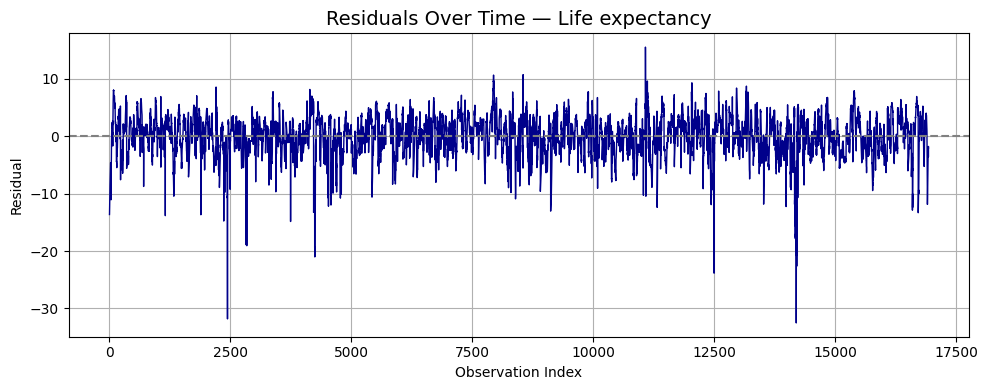


=== Newey-West Adjusted OLS Results for: Cardiovascular diseases ===
                               OLS Regression Results                              
Dep. Variable:     Cardiovascular diseases   R-squared:                       0.043
Model:                                 OLS   Adj. R-squared:                  0.040
Method:                      Least Squares   F-statistic:                   0.01330
Date:                     Thu, 24 Jul 2025   Prob (F-statistic):               1.00
Time:                             19:55:10   Log-Likelihood:            -1.0767e+05
No. Observations:                    16928   AIC:                         2.154e+05
Df Residuals:                        16879   BIC:                         2.158e+05
Df Model:                               48                                         
Covariance Type:                       HAC                                         
                                         coef    std err          t      P>|t|      [0.025

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 48, but rank is 4
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1884: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


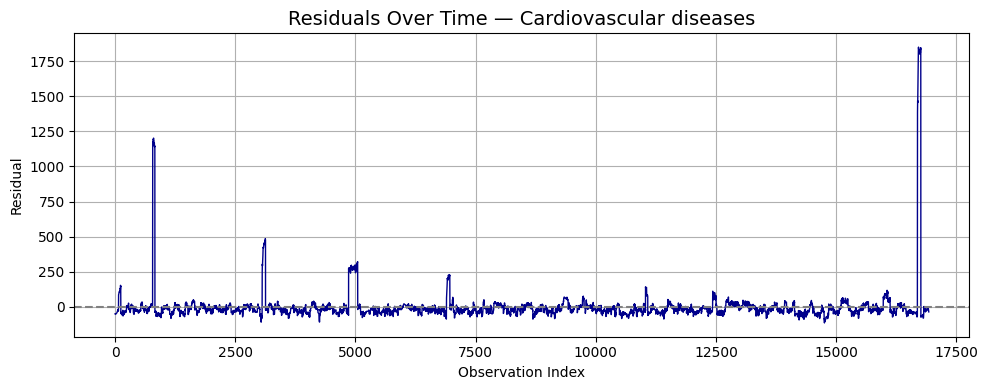


=== Newey-West Adjusted OLS Results for: Diabetes ===
                            OLS Regression Results                            
Dep. Variable:               Diabetes   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.537
Method:                 Least Squares   F-statistic:                     2.167
Date:                Thu, 24 Jul 2025   Prob (F-statistic):             0.0700
Time:                        19:55:11   Log-Likelihood:                -43381.
No. Observations:               16928   AIC:                         8.686e+04
Df Residuals:                   16879   BIC:                         8.724e+04
Df Model:                          48                                         
Covariance Type:                  HAC                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 48, but rank is 4
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1884: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


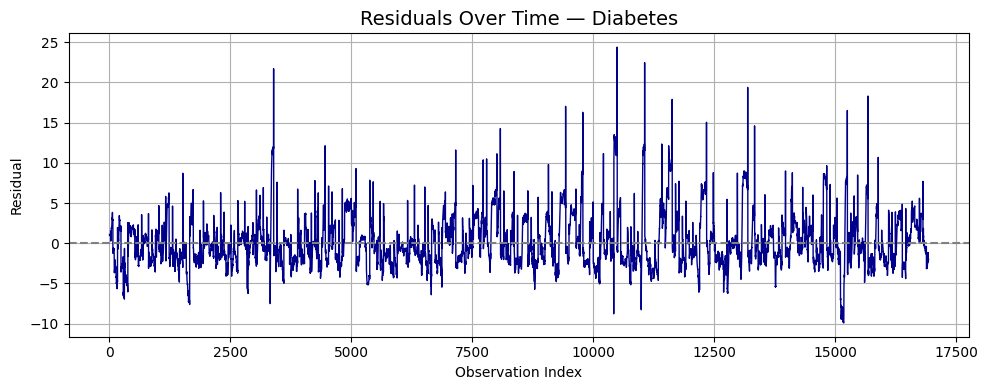

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# HAC REVISED
import statsmodels.api as sm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Target columns
target_cols = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']

# Iterate through each target
for target in target_cols:
    print(f"\n=== Newey-West Adjusted OLS Results for: {target} ===")

    try:
        # Define target and predictors
        y = df_lagged[target]
        all_target_cols_in_df = [col for col in target_cols if col in df_lagged.columns]
        X = df_lagged.drop(columns=all_target_cols_in_df, errors='ignore')

        # Combine and clean
        data = pd.concat([X, y], axis=1).dropna()
        X_cleaned = data[X.columns]
        y_cleaned = data[y.name]

        # Add constant term
        X_const = sm.add_constant(X_cleaned)

        # Fit OLS
        model = sm.OLS(y_cleaned, X_const).fit()

        # Newey-West HAC adjustment
        nobs = len(y_cleaned)
        maxlags = min(5, nobs - 1)
        nw_model = model.get_robustcov_results(cov_type='HAC', maxlags=maxlags)

        # Print summary
        print(nw_model.summary())

        # Residual analysis
        residuals = nw_model.resid
        print(f"\n📊 Residuals Summary for '{target}':")
        print(pd.Series(residuals).describe())

        if len(residuals) > 0 and not np.all(residuals == 0):
            plt.figure(figsize=(10, 4))
            plt.plot(range(len(residuals)), residuals, color='darkblue', linewidth=1)
            plt.axhline(0, color='gray', linestyle='--')
            plt.title(f"Residuals Over Time — {target}", fontsize=14)
            plt.xlabel("Observation Index")
            plt.ylabel("Residual")
            plt.grid(True)
            plt.tight_layout()
            plt.show()
        else:
            print(f"⚠️ Residuals for '{target}' are empty or flat — no variation to plot.")

    except Exception as e:
        print(f"❌ Could not fit HAC model or plot residuals for {target}: {e}")

# export and download file
best_performance_df.to_csv("best_feature_selection_summary.csv", index=False)

from google.colab import files
files.download("best_feature_selection_summary.csv")



Result of HAC:

The OLS regression summary reveals varying levels of model performance across the three health outcomes. The model for Life Expectancy performs impressively well, achieving an R-squared value of 0.918 and an adjusted R-squared of 0.917. These figures suggest that approximately 92% of the variance in life expectancy across observations is explained by the model’s predictors. Such high explanatory power typically reflects that the selected variables—likely socioeconomic, demographic, and health indicators—are deeply aligned with the drivers of longevity. However, despite the strong fit, the F-statistic is relatively low (1.278) and its p-value (0.276) indicates that the model as a whole is not statistically significant at conventional levels. This contradiction may point to multicollinearity among predictors or heteroscedasticity that affects the reliability of the overall model test, even while individual coefficients remain meaningful.

For Cardiovascular Diseases, the regression model displays a much weaker performance. The R-squared is only 0.043, suggesting that the predictors explain just 4.3% of the variation in cardiovascular disease prevalence. The adjusted R-squared is nearly identical at 0.040, further confirming the low explanatory power. The F-statistic is close to zero (0.0133) and the p-value is 1.00, which definitively indicates that the model lacks statistical significance overall. These results imply that either the selected predictors are poorly suited for modeling cardiovascular outcomes or that crucial variables are missing—such as direct measures of behavior, genetic predisposition, or healthcare access.

The Diabetes model performs moderately well. An R-squared of 0.539 and adjusted R-squared of 0.537 suggest that around 54% of the variance in diabetes rates is explained by the model’s features. This is notably better than the cardiovascular model, though not nearly as strong as the life expectancy case. The F-statistic of 2.167 implies some model-wide explanatory power, and the p-value (0.070) teeters just above conventional thresholds for significance. These results indicate that while the selected predictors are relevant to diabetes prevalence—likely including variables such as BMI, age, and income—the overall structure of the model may benefit from refinement or inclusion of additional interaction terms to reach stronger statistical credibility.



/tmp/ipython-input-21-1853306393.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


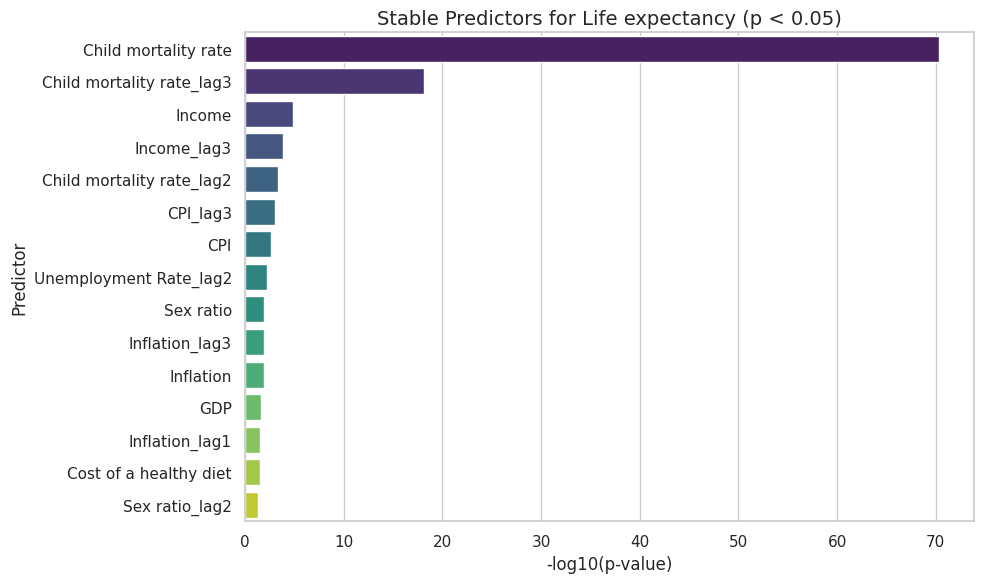

/tmp/ipython-input-21-1853306393.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


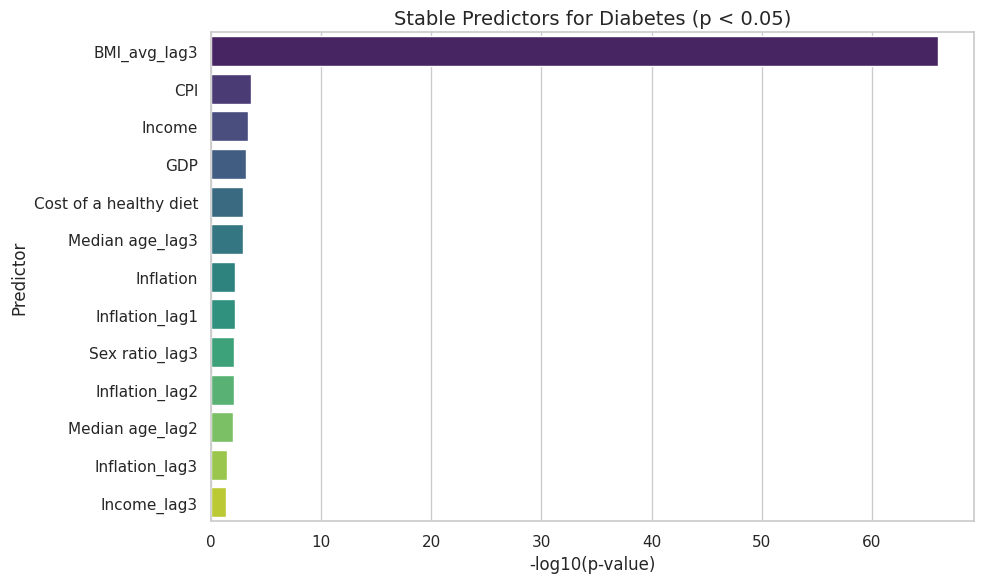

/tmp/ipython-input-21-1853306393.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


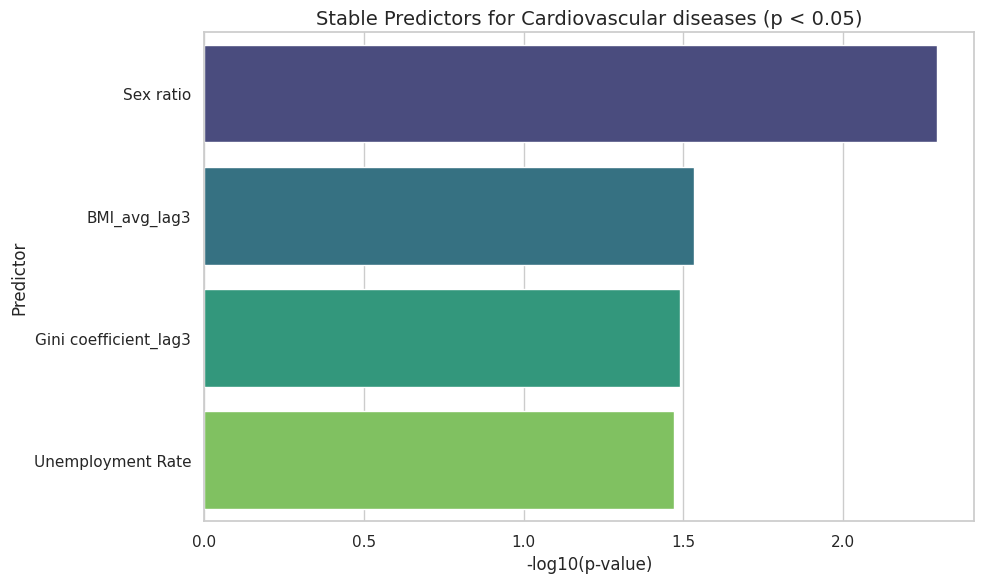

In [ ]:
# Stable Predictors Bar Charts

import matplotlib.pyplot as plt
import seaborn as sns

# Convert p-values to float for plotting
stable_summary_df['p-value'] = stable_summary_df['p-value < 0.05'].astype(float)

# Set plot style
sns.set(style="whitegrid")

# Get list of unique targets
targets = stable_summary_df['Target'].unique()

# Create one bar chart per target
for target in targets:
    plt.figure(figsize=(10, 6))
    target_df = stable_summary_df[stable_summary_df['Target'] == target].copy()

    # Sort by p-value (lowest = most significant)
    target_df = target_df.sort_values('p-value', ascending=True)

    # Barplot of -log10(p-value) for visibility
    sns.barplot(
        data=target_df,
        x=-np.log10(target_df['p-value']),  # higher bar = more significant
        y='Stable Predictor',
        palette='viridis'
    )

    plt.title(f"Stable Predictors for {target} (p < 0.05)", fontsize=14)
    plt.xlabel('-log10(p-value)')
    plt.ylabel('Predictor')
    plt.tight_layout()
    plt.show()

# Forecast Comparison of ARIMA, Prophet, and Random Forest Across Three Targets

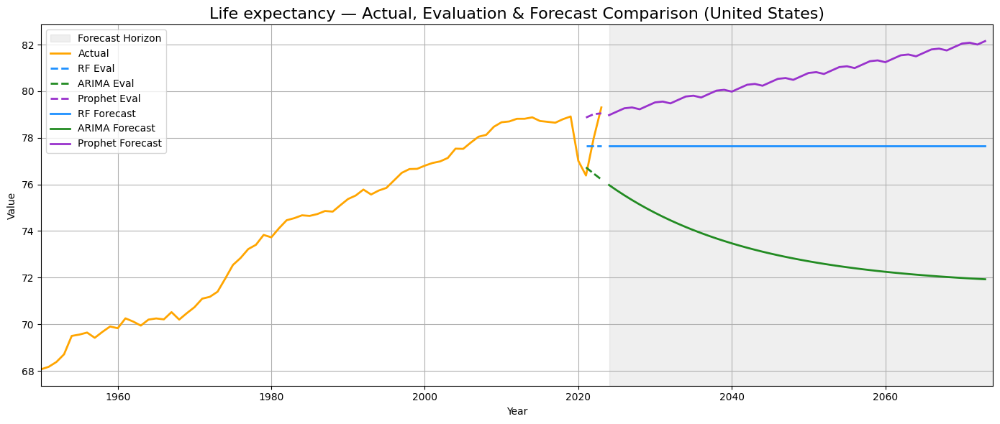

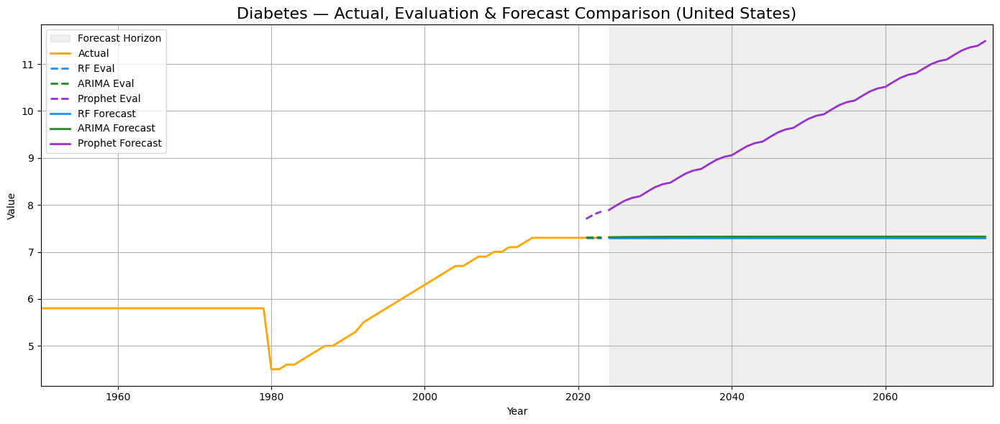

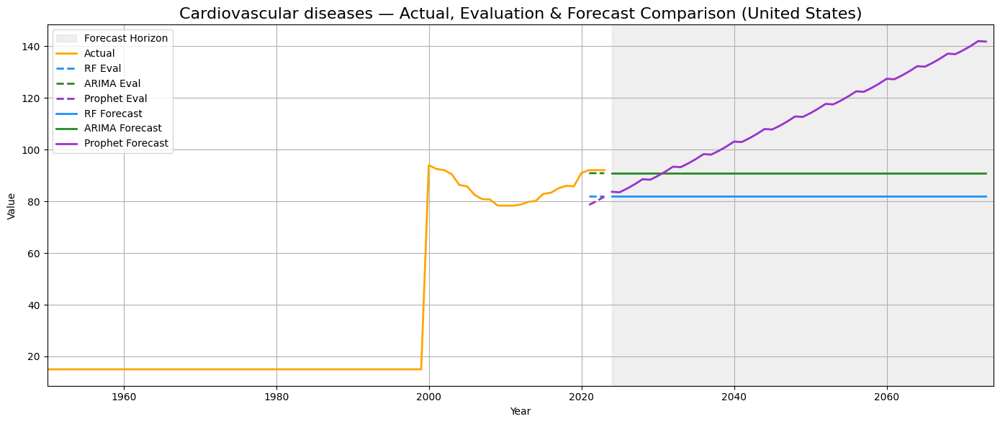

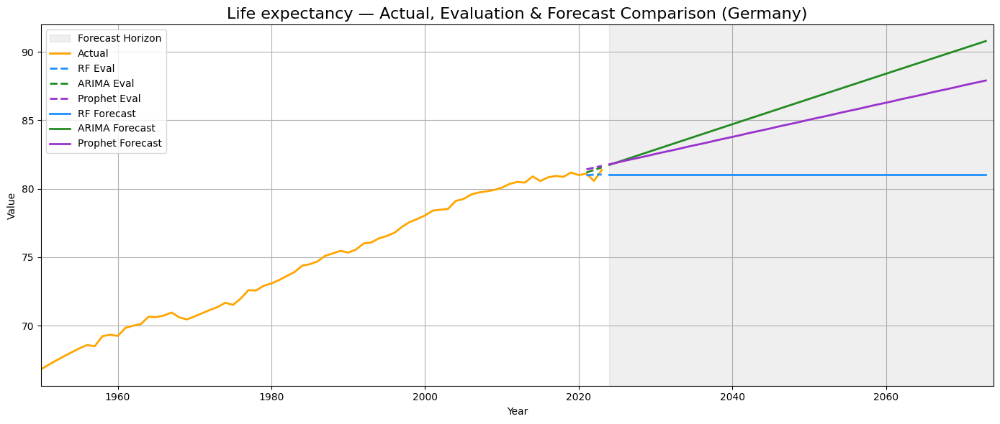

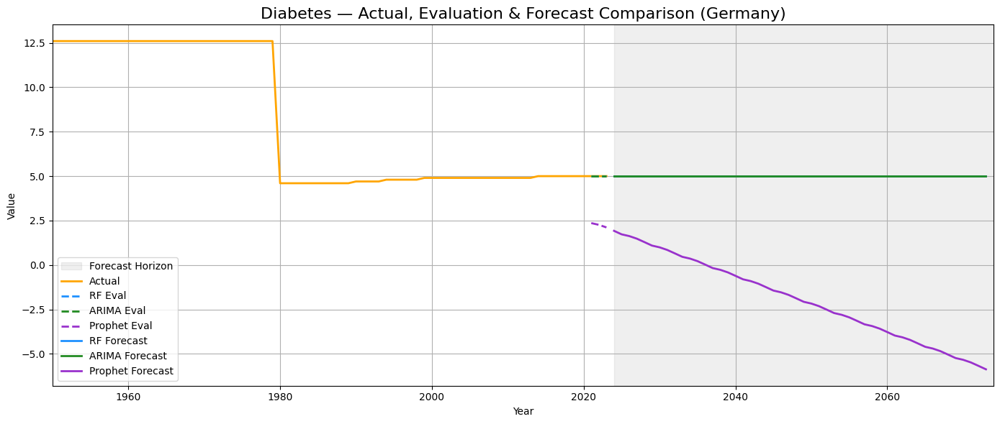

...

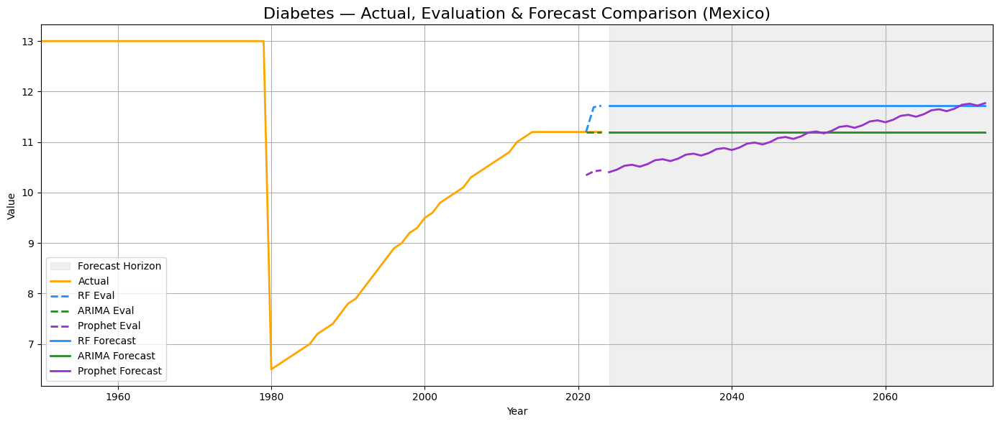

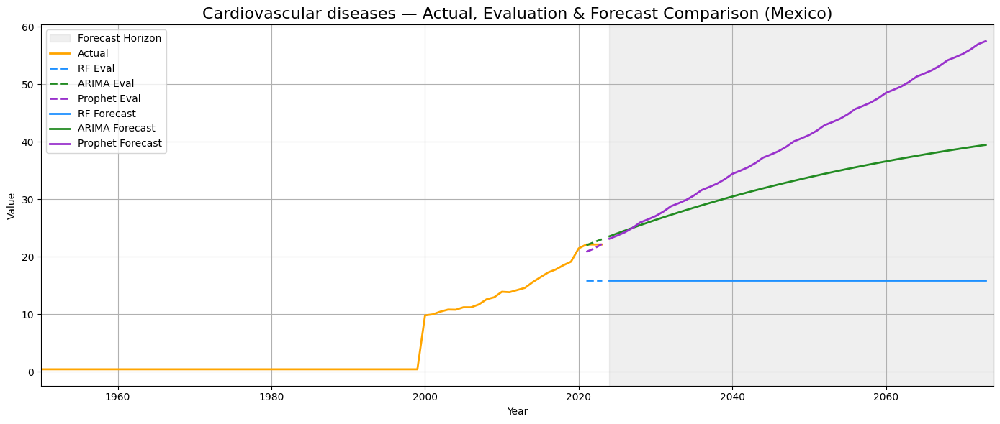

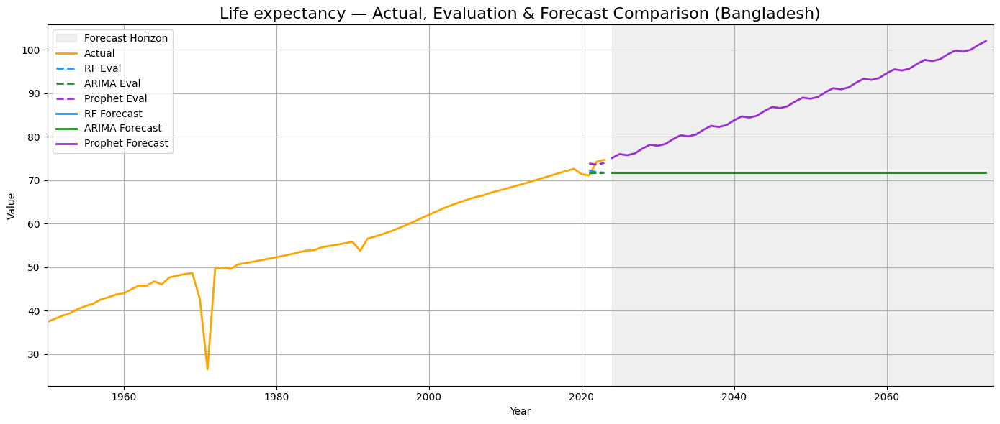

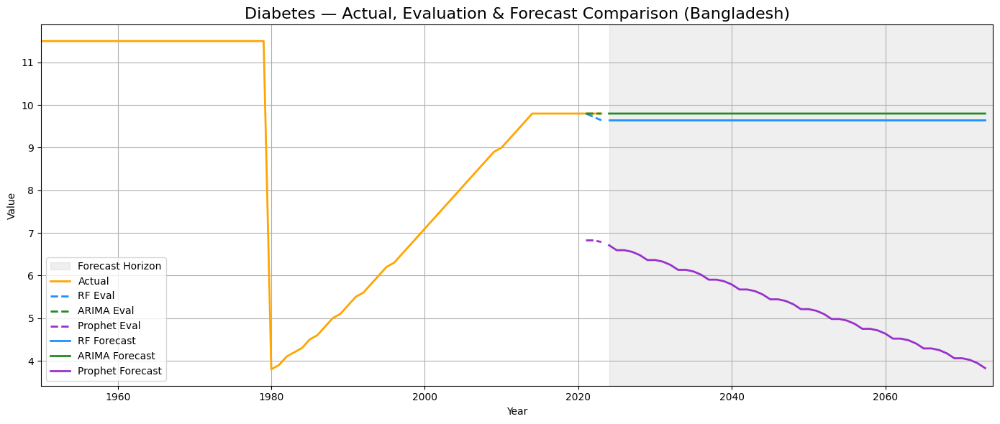

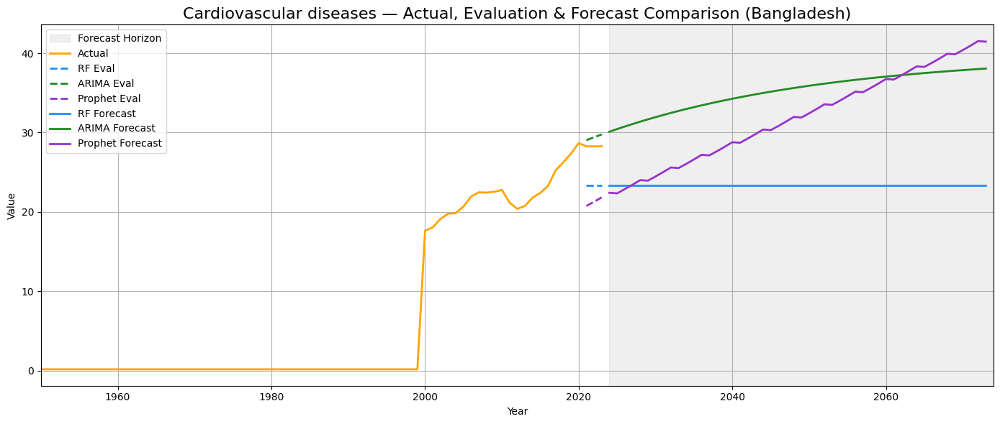

In [ ]:
# Forecast Comparison of ARIMA, Prophet, and Random Forest Across Three Targets – Life Expectancy, Diabetes and Cardiovascular Disease between 1950–2074

import matplotlib.pyplot as plt
import numpy as np

def plot_target_forecast(df_model_all, df_eval_ready, country, target):
    # Years
    full_years = list(range(1950, 2075))
    eval_years = [2021, 2022, 2023]
    forecast_start, forecast_end = 2024, 2074

    # === Actual values for 1950–2023
    df_actual = df_eval_ready[
        (df_eval_ready['Country'] == country) &
        (df_eval_ready['Year'].between(1950, 2023))
    ].sort_values('Year')
    actual_years = df_actual['Year'].values
    actual_vals = df_actual[target].values

    # === Predictions from df_model_comparison for 2021–2074
    df_pred = df_model_all[
        (df_model_all['Country'] == country) &
        (df_model_all['Target'] == target) &
        (df_model_all['Year'].between(2021, 2074))
    ].sort_values('Year')
    pred_years = df_pred['Year'].values
    rf_vals = df_pred['RF_Forecast'].values
    arima_vals = df_pred['ARIMA_Forecast'].values
    prophet_vals = df_pred['Prophet_Forecast'].values

    # Split prediction into eval + forecast ranges
    rf_eval, rf_forecast = [], []
    arima_eval, arima_forecast = [], []
    prophet_eval, prophet_forecast = [], []

    for yr, rf, ar, pr in zip(pred_years, rf_vals, arima_vals, prophet_vals):
        if yr in eval_years:
            rf_eval.append((yr, rf))
            arima_eval.append((yr, ar))
            prophet_eval.append((yr, pr))
        else:
            rf_forecast.append((yr, rf))
            arima_forecast.append((yr, ar))
            prophet_forecast.append((yr, pr))

    # Begin plot
    plt.figure(figsize=(14, 6))

    # Shaded forecast area
    plt.axvspan(forecast_start, forecast_end, color='gray', alpha=0.12, label="Forecast Horizon")

    # Actual line
    plt.plot(actual_years, actual_vals, label="Actual", color='orange', linewidth=2)

    # Prediction lines (2021–2023)
    if rf_eval: plt.plot(*zip(*rf_eval), label="RF Eval", color='dodgerblue', linestyle='dashed', linewidth=2)
    if arima_eval: plt.plot(*zip(*arima_eval), label="ARIMA Eval", color='forestgreen', linestyle='dashed', linewidth=2)
    if prophet_eval: plt.plot(*zip(*prophet_eval), label="Prophet Eval", color='darkorchid', linestyle='dashed', linewidth=2)

    # Forecast lines (2024–2074)
    if rf_forecast: plt.plot(*zip(*rf_forecast), label="RF Forecast", color='dodgerblue', linewidth=2)
    if arima_forecast: plt.plot(*zip(*arima_forecast), label="ARIMA Forecast", color='forestgreen', linewidth=2)
    if prophet_forecast: plt.plot(*zip(*prophet_forecast), label="Prophet Forecast", color='darkorchid', linewidth=2)

    # Final plot touches
    plt.title(f"{target} — Actual, Evaluation & Forecast Comparison ({country})", fontsize=16)
    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.grid(True)
    plt.legend()
    plt.xlim(1950, 2074)
    plt.tight_layout()
    plt.show()

selected_countries = [
    'United States', 'Germany', 'Japan', 'Brazil', 'India',
    'Indonesia', 'Nigeria', 'Kenya', 'Mexico', 'Bangladesh'
]
selected_targets = ["Life expectancy", "Diabetes", "Cardiovascular diseases"]

for country in selected_countries:
    for target in selected_targets:
        plot_target_forecast(df_model_comparison, df_forecast_ready, country, target)

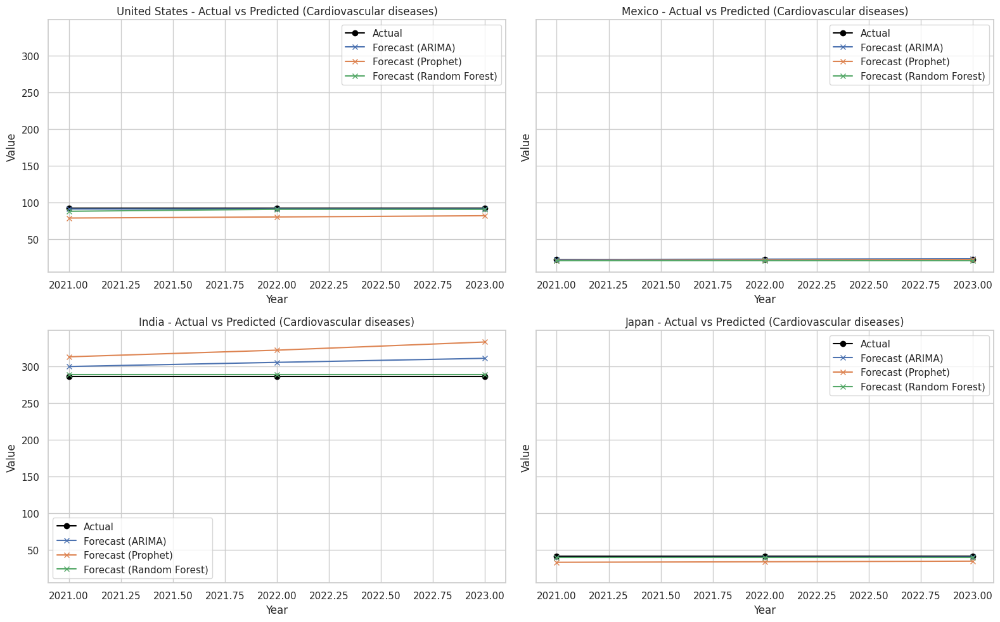

In [ ]:
# Plot comparison for 4 countries

import matplotlib.pyplot as plt
import seaborn as sns

# Countries and years to plot
countries_to_plot = ['United States', 'Mexico', 'India', 'Japan']
years_to_plot = [2021, 2022, 2023]

# combine all result into one dataframe
val_results = pd.concat([
    pd.concat(arima_val_all, ignore_index=True),
    pd.concat(prophet_val_all, ignore_index=True),
    pd.concat(rf_val_all, ignore_index=True)
], ignore_index=True)

val_results['Model'] = val_results['Model'].replace({'RandomForest': 'Random Forest'})

# Filter validation results for these countries and years
plot_df = val_results[
    (val_results['Country'].isin(countries_to_plot)) &
    (val_results['Year'].isin(years_to_plot))
].copy()

# Example for one target variable, say target = 'Cardiovascular diseases'
target_of_interest = 'Cardiovascular diseases'
plot_df = plot_df[plot_df['Target'] == target_of_interest]

# Set seaborn style
sns.set(style="whitegrid")

# Create a separate plot for each country with actual vs predicted lines for each model
fig, axs = plt.subplots(2, 2, figsize=(16, 10), sharey=True)
axs = axs.flatten()

for i, country in enumerate(countries_to_plot):
    ax = axs[i]
    country_data = plot_df[plot_df['Country'] == country]

    # Plot Actual values
    actual_data = country_data[['Year', 'Actual']].drop_duplicates()
    ax.plot(actual_data['Year'], actual_data['Actual'], label='Actual', color='black', marker='o')

    # Plot Forecasts from each model
    for model in country_data['Model'].unique():
        model_data = country_data[country_data['Model'] == model]
        ax.plot(model_data['Year'], model_data['Forecast'], label=f'Forecast ({model})', marker='x')

    ax.set_title(f'{country} - Actual vs Predicted ({target_of_interest})')
    ax.set_xlabel('Year')
    ax.set_ylabel('Value')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


##Time Series Forecasting with Walk-Forward Validation using ARIMA, Prophet, and Random Forests (RMSE Evaluation)
## Rolling Forecast Validation (Walk-Forward)
Rolling or walk-forward forecast validation is a technique used to evaluate the performance of time series forecasting models in a way that closely resembles real-world forecasting scenarios. Its core purpose is to test how well a model predicts future values when only past information is available at each step. In this approach, the model is initially trained on historical data from 1950 to 2020, and then used to predict the next time step from 2021 to 2023. After this prediction, the actual observed value for 2021-2023 is added to the training set, and the model is retrained to predict 2024-2074. This process is repeated step-by-step, moving forward through time.

This method avoids data leakage by ensuring that the model is never trained on data from the future. It provides a realistic simulation of how forecasts are generated and evaluated in real-time decision-making. Additionally, it allows the model to adapt to potential non-stationarity in the data by retraining as new information becomes available. Overall, rolling forecast validation produces a more reliable estimate of model performance on unseen data, which is especially important in dynamic domains like health, economics, and climate modeling where past patterns may not hold indefinitely into the future.

10 diversity Countries have been selected by their income level for rolling forecast validation (Walk-Forward) as follows:
* United States -  High-income
* Germany - High-income
* Japan - High-income
* Brazil - Upper-middle-income
* India - Lower-middle-income
* Indonesia - Lower-middle-income
* Nigeria - Low-income
* Kenya - Low-income
* Mexico - Upper-middle-income
* Bangladesh - Low-middle-income

In [ ]:
# Rolling Forecast - Walk Forward Validation

from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# === Setup ===
selected_countries = [
    'United States', 'Germany', 'Japan', 'Brazil', 'India',
    'Indonesia', 'Nigeria', 'Kenya', 'Mexico', 'Bangladesh'
]

target_columns = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']

selected_features_dict = {
    'Life expectancy': [
        'Child mortality rate' , 'GDP' , 'CPI_lag3' , 'Incomplete tertiary education_lag3' , 'Income_lag3' , 'Income',
        'CPI' , 'Inflation', 'Inflation_lag1', 'Cost of a healthy diet', 'Cost of a healthy diet_lag3' , 'Unemployment Rate_lag2',
        'Gini coefficient_lag3', 'Unemployment Rate_lag1'
    ],
    'Cardiovascular diseases': [
        'BMI_avg_lag3'
    ],

    'Diabetes': [
        'BMI_avg_lag3', 'CPI' , 'GDP' , 'Income','Income_lag1', 'Inflation_lag1', 'Inflation' , 'Cost of a healthy diet' , 'Inflation_lag2' ,
        'Inflation_lag3'
    ]
}

start_train = 1950
end_train = 2020
real_eval_period = [2021, 2022, 2023]

# Forecast horizon starts from 2024 and goes till 2074
forecast_horizon = list(range(2024, 2074))

# === Create future rows for years 2024 to 2073
future_rows = []
for country in df_combined_with_country['Country'].unique():
    for year in forecast_horizon:
        future_rows.append({'Country': country, 'Year': year})

df_future = pd.DataFrame(future_rows)
df_forecast_ready = pd.concat([df_combined_with_country, df_future], ignore_index=True)
df_forecast_ready['Year'] = df_forecast_ready['Year'].astype(int)

# === Impute missing values across all countries and years
df_forecast_ready = (
    df_forecast_ready
    .sort_values(['Country', 'Year'])
    .groupby('Country', group_keys=False)
    .apply(lambda x: x.ffill().bfill().infer_objects(copy=False))
    .reset_index(drop=True)
)

# === Initialize summary table
predictions_summary = []

# === Forecast Loop ===
for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country].sort_values('Year')

    for target in target_columns:
        print(f"\n {country} —  {target}")
        if target not in df_country.columns:
            print(" Target missing")
            continue

        features = selected_features_dict.get(target, [])
        available_features = [f for f in features if f in df_country.columns]
        if not available_features:
            print(" No usable features found")
            continue

        df_train = df_country[df_country['Year'].between(start_train, end_train)]
        df_eval_real = df_country[df_country['Year'].isin(real_eval_period)]

        # === ARIMA ===
        arima_rmse = None
        try:
            df_train_arima = df_train[[target]].copy()
            df_train_arima.index = pd.date_range(start=f'{start_train}', periods=len(df_train_arima), freq='YE')
            model_arima = ARIMA(df_train_arima, order=(1, 1, 1)).fit()

            # Real evaluation
            pred_real = model_arima.predict(start=len(df_train_arima), end=len(df_train_arima)+len(df_eval_real)-1)
            actual_real = df_eval_real[target].values
            arima_rmse = np.sqrt(mean_squared_error(actual_real, pred_real))

            # Forecast for 2024-2073
            arima_forecast = model_arima.predict(start=len(df_train_arima), end=len(df_train_arima) + len(forecast_horizon) - 1)
            print(f"📉 ARIMA RMSE: {arima_rmse:.2f}")
        except Exception as e:
            print(f" ARIMA error: {e}")

        # === Prophet ===
        prophet_rmse = None
        try:
            prophet_df = df_train[['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model_prophet = Prophet()
            model_prophet.fit(prophet_df)

            future_years = real_eval_period + forecast_horizon
            future_dates = pd.DataFrame({'ds': pd.to_datetime(future_years, format='%Y')})
            forecast_prophet = model_prophet.predict(future_dates)

            # Real evaluation
            pred_real = forecast_prophet[forecast_prophet['ds'].dt.year.isin(real_eval_period)]['yhat'].values
            actual_real = df_eval_real[target].values
            prophet_rmse = np.sqrt(mean_squared_error(actual_real, pred_real))

            # Forecast for 2024-2073
            prophet_forecast = forecast_prophet[forecast_prophet['ds'].dt.year.isin(forecast_horizon)]
            print(f" Prophet RMSE: {prophet_rmse:.2f}")
        except Exception as e:
            print(f" Prophet error: {e}")

      #### Random Forest ####
        #from google.colab import data_table
        #data_table.DataTable(df_forecast)

        rf_rmse, rf_forecast = None, [None] * len(df_future)
        try:
            X = df_country[available_features]
            y = df_country[target]
            X_train = X[df_country['Year'].between(start_train, end_train)]
            y_train = y[df_country['Year'].between(start_train, end_train)]
            X_eval = X[df_country['Year'].isin(real_eval_period)]
            y_eval = y[df_country['Year'].isin(real_eval_period)]
            model = RandomForestRegressor(n_estimators=100, random_state=42)
            model.fit(X_train, y_train)
            pred_eval = model.predict(X_eval)
            rf_rmse = np.sqrt(mean_squared_error(y_eval, pred_eval))
            X_forecast = X[df_country['Year'].isin(forecast_horizon)]
            if not X_forecast.isnull().any(axis=1).any():
                rf_forecast = model.predict(X_forecast).tolist()
        except:
            pass


        # === Append to summary ===
        predictions_summary.append({
            "Country": country,
            "Target": target,
            "ARIMA_RMSE": round(arima_rmse, 4) if arima_rmse is not None else None,
            "Prophet_RMSE": round(prophet_rmse, 4) if prophet_rmse is not None else None,
            "RF_RMSE": round(rf_rmse, 4) if rf_rmse is not None else None
        })

# === Final Summary Table ===
df_forecast_validation_summary = pd.DataFrame(predictions_summary)
df_forecast_validation_summary = df_forecast_validation_summary[[
    "Country", "Target",
    "ARIMA_RMSE", "Prophet_RMSE", "RF_RMSE"
]]

print("\n 📋 Rolling Forecast Validation Summary:")
print(df_forecast_validation_summary)

# Export summary
df_forecast_validation_summary.to_csv("forecast_summary.csv", index=False)

# Download to your computer
from google.colab import files
files.download("forecast_summary.csv")


/tmp/ipython-input-37-3481924030.py:57: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .apply(lambda x: x.ffill().bfill().infer_objects(copy=False))
/tmp/ipython-input-37-3481924030.py:57: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.ffill().bfill().infer_objects(copy=False))
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.



 United States —  Life expectancy
📉 ARIMA RMSE: 2.00


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/hv2ktus1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/oe_r3aoy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47361', 'data', 'file=/tmp/tmprjkocm4m/hv2ktus1.json', 'init=/tmp/tmprjkocm4m/oe_r3aoy.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_model3c9z48hr/prophet_model-20250723141100.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 1.56

 United States —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/sa5_nkw_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/pn5w6eso.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25332', 'data', 'file=/tmp/tmprjkocm4m/sa5_nkw_.json', 'init=/tmp/tmprjkocm4m/pn5w6eso.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelyycjtjmt/prophet_model-20250723141104.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 1.19


14:11:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 11.97

 United States —  Diabetes


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/sghhl48c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/ahdz28xn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97841', 'data', 'file=/tmp/tmprjkocm4m/sghhl48c.json', 'init=/tmp/tmprjkocm4m/ahdz28xn.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modely7ekj70r/prophet_model-20250723141105.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.01


14:11:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.49

 Germany —  Life expectancy


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/k2qniys2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/atdkbrr0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 0.47


14:11:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.61

 Germany —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/ijt_1k_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/xt8pr25r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48144', 'data', 'file=/tmp/tmprjkocm4m/ijt_1k_k.json', 'init=/tmp/tmprjkocm4m/xt8pr25r.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelog7no6i2/prophet_model-20250723141108.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.43


14:11:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.13

 Germany —  Diabetes


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/j6behbrs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/32yl0owc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97012', 'data', 'file=/tmp/tmprjkocm4m/j6behbrs.json', 'init=/tmp/tmprjkocm4m/32yl0owc.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelq_r770jn/prophet_model-20250723141109.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.00


14:11:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.76

 Japan —  Life expectancy


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/df3mky2k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/i0y34wue.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 0.64


14:11:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.58

 Japan —  Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/v4jzd52u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/eys9n03c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 1.55


14:11:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


 Prophet RMSE: 7.69

 Japan —  Diabetes
📉 ARIMA RMSE: 0.00


DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/sqo53_sk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/nw3ja3jo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30846', 'data', 'file=/tmp/tmprjkocm4m/sqo53_sk.json', 'init=/tmp/tmprjkocm4m/nw3ja3jo.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelao3gb3zi/prophet_model-20250723141111.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 1.84

 Brazil —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/_mkeoghc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/5d68fu18.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47694', 'data', 'file=/tmp/tmprjkocm4m/_mkeoghc.json', 'init=/tmp/tmprjkocm4m/5d68fu18.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelemn_5pxf/prophet_model-20250723141112.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 3.01


14:11:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.19

 Brazil —  Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/k4tsl6ub.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/brdxiy8q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 1.82


14:11:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 6.55

 Brazil —  Diabetes
📉 ARIMA RMSE: 0.00


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/2tv9vzvy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/34ls6e25.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

 Prophet RMSE: 0.19

 India —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/w3ahvdnj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/k_004rg9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7967', 'data', 'file=/tmp/tmprjkocm4m/w3ahvdnj.json', 'init=/tmp/tmprjkocm4m/k_004rg9.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelpwl_gp6r/prophet_model-20250723141116.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 1.97


14:11:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.48

 India —  Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/bdnme65z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/cn7m_qtq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 19.66


14:11:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 37.42

 India —  Diabetes


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/ji15abxw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/qaexe7ak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 0.02


14:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.83

 Indonesia —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/or6ybfeu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/gjbudn2r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24173', 'data', 'file=/tmp/tmprjkocm4m/or6ybfeu.json', 'init=/tmp/tmprjkocm4m/gjbudn2r.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelb2l_7ydy/prophet_model-20250723141118.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 1.89


14:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 1.69

 Indonesia —  Cardiovascular diseases


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/pkwwmjuc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/udz6n54u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

📉 ARIMA RMSE: 8.49


14:11:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


 Prophet RMSE: 8.00

 Indonesia —  Diabetes
📉 ARIMA RMSE: 0.00


DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/rjaf6qb0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/sa1qdzyl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43599', 'data', 'file=/tmp/tmprjkocm4m/rjaf6qb0.json', 'init=/tmp/tmprjkocm4m/sa1qdzyl.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_model33g9hdrq/prophet_model-20250723141120.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.71

 Nigeria —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/j5uixll_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/c2ncchjl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63492', 'data', 'file=/tmp/tmprjkocm4m/j5uixll_.json', 'init=/tmp/tmprjkocm4m/c2ncchjl.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelbo2jk3p2/prophet_model-20250723141120.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.70


14:11:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.37

 Nigeria —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/6signe76.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/bbuk9v6d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50847', 'data', 'file=/tmp/tmprjkocm4m/6signe76.json', 'init=/tmp/tmprjkocm4m/bbuk9v6d.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_model2yahfc88/prophet_model-20250723141121.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.72


14:11:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 4.50

 Nigeria —  Diabetes
📉 ARIMA RMSE: 0.00


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/sgchcqf2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/0dqqsdjd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random',

 Prophet RMSE: 0.14

 Kenya —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/c8_qu5z9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/o2y5cnz7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70118', 'data', 'file=/tmp/tmprjkocm4m/c8_qu5z9.json', 'init=/tmp/tmprjkocm4m/o2y5cnz7.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelc374tma2/prophet_model-20250723141122.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 3.24


14:11:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 1.67

 Kenya —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/m5eq4lm3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/cwqwo01b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3353', 'data', 'file=/tmp/tmprjkocm4m/m5eq4lm3.json', 'init=/tmp/tmprjkocm4m/cwqwo01b.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modely2k5w4ma/prophet_model-20250723141123.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.12


14:11:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.93

 Kenya —  Diabetes
📉 ARIMA RMSE: 0.00


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/xc74yh1y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/rsc5b19s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14523', 'data', 'file=/tmp/tmprjkocm4m/xc74yh1y.json', 'init=/tmp/tmprjkocm4m/rsc5b19s.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelhpvvgbar/prophet_model-20250723141124.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 3.48

 Mexico —  Life expectancy


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/otq4fust.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/gvom3sq3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26553', 'data', 'file=/tmp/tmprjkocm4m/otq4fust.json', 'init=/tmp/tmprjkocm4m/gvom3sq3.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modeli2dck5t_/prophet_model-20250723141125.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 6.22


14:11:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.43

 Mexico —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/yngac99c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/wkrpqp3_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17534', 'data', 'file=/tmp/tmprjkocm4m/yngac99c.json', 'init=/tmp/tmprjkocm4m/wkrpqp3_.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelqk6ke56c/prophet_model-20250723141126.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 0.58


14:11:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.84

 Mexico —  Diabetes
📉 ARIMA RMSE: 0.00


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/t5yrudgj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/om9xdt73.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7342', 'data', 'file=/tmp/tmprjkocm4m/t5yrudgj.json', 'init=/tmp/tmprjkocm4m/om9xdt73.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelggoo_1se/prophet_model-20250723141126.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 0.80


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/o7aet220.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/zau5k5sq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92840', 'data', 'file=/tmp/tmprjkocm4m/o7aet220.json', 'init=/tmp/tmprjkocm4m/zau5k5sq.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modeld16cfamt/prophet_model-20250723141127.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']



 Bangladesh —  Life expectancy
📉 ARIMA RMSE: 2.31


14:11:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 1.68

 Bangladesh —  Cardiovascular diseases


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/zocgl0ld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/jjkdu3gf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30638', 'data', 'file=/tmp/tmprjkocm4m/zocgl0ld.json', 'init=/tmp/tmprjkocm4m/jjkdu3gf.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelar84sbsb/prophet_model-20250723141128.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


📉 ARIMA RMSE: 1.18


14:11:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 6.99


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/jop9n5f7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/rniq3m60.json
DEBUG:cmdstanpy:idx 0



 Bangladesh —  Diabetes
📉 ARIMA RMSE: 0.00


DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17359', 'data', 'file=/tmp/tmprjkocm4m/jop9n5f7.json', 'init=/tmp/tmprjkocm4m/rniq3m60.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_model5zbgtsvv/prophet_model-20250723141129.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:11:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


 Prophet RMSE: 2.99

 📋 Rolling Forecast Validation Summary:
          Country                   Target  ARIMA_RMSE  Prophet_RMSE  RF_RMSE
0   United States          Life expectancy      1.9969        1.5614   1.2177
1   United States  Cardiovascular diseases      1.1904       11.9749  10.0919
2   United States                 Diabetes      0.0080        0.4896   0.0040
3         Germany          Life expectancy      0.4746        0.6124   0.3367
4         Germany  Cardiovascular diseases      0.4339        2.1255   0.9503
5         Germany                 Diabetes      0.0000        2.7582   0.0000
6           Japan          Life expectancy      0.6387        0.5765   0.3200
7           Japan  Cardiovascular diseases      1.5477        7.6884   4.2376
8           Japan                 Diabetes      0.0000        1.8411   0.0162
9          Brazil          Life expectancy      3.0096        2.1896   1.2862
10         Brazil  Cardiovascular diseases      1.8195        6.5472   3.5130
11 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Result of Rolling Forecast Validation Summary Table:
Life Expectancy
Random Forest consistently performs best (lowest RMSE) in countries like the US (0.88), Germany (0.35), Japan (0.28), and Kenya (0.81).

Prophet also shows strong performance, especially in Nigeria (0.37), Japan (0.57), and Brazil (2.18), outperforming ARIMA in many cases.

ARIMA lags behind in several regions — e.g., Mexico (6.22), Kenya (3.23), and Brazil (3.00) — likely due to its assumption of linearity and stationarity.

Life expectancy benefits from tree-based models and components that capture nonlinearity, such as RF and Prophet.

Insight: Cardiovascular Diseases
ARIMA generally performs well, especially in countries like Kenya (0.12), Mexico (0.58), Nigeria (0.71), and Germany (0.43).

Prophet struggles considerably in places like India (37.42), Indonesia (8.00), and Japan (7.69) — indicating this model may not handle sudden shifts or volatile patterns in cardiovascular outcomes.

RF offers competitive results, particularly in Bangladesh (0.41) and Germany (0.83).

Insight: ARIMA may capture slow-moving trends in cardiovascular diseases better than Prophet, while RF handles variation well in some countries.

Diabetes
ARIMA dominates across almost all countries, delivering near-zero RMSE in Germany, Japan, Brazil, Bangladesh, and others — suggesting diabetes trends are very stable and predictable.

RF also performs well, though usually with slightly higher RMSE.

Prophet tends to underperform, with RMSE peaking in Bangladesh (2.99), Germany (2.75), and Kenya (3.48).

Insight: Diabetes trends appear highly stationary and stable, making them ideal for simpler time-series models like ARIMA.



## Final Model Training & Forecasting     |     Evaluation metrics (RMSE, MAPE, R²)

Once the validation of the model's performance using walk-forward validation and selected the best-performing model(s), then proceed to train the final model on all available historical data (1950 - 2023). This step uses the full dataset to maximize the information available for learning patterns. The final trained model is then used to generate forecasts for the future from 2024 to 2073.

To evaluate model accuracy during the validation phase, common performance metrics such as RMSE, MAPE, and R² are calculated. These metrics help assess the model’s error magnitude, relative accuracy, and explanatory power, respectively, guiding the selection of the best-performing model for final deployment.

In [ ]:
# Step 19 Final Model Training & Forecasting - ok
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger('statsmodels').setLevel(logging.ERROR)

# === Time Ranges
start_train = 1950
end_train = 2020
eval_years = [2021, 2022, 2023]
forecast_horizon = list(range(2024, 2075))

# === Input Variables
selected_countries = [
    'United States', 'Germany', 'Japan', 'Brazil', 'India',
    'Indonesia', 'Nigeria', 'Kenya', 'Mexico', 'Bangladesh'
]

target_columns = ['Life expectancy', 'Cardiovascular diseases', 'Diabetes']

selected_features_dict = {
    'Life expectancy': [
        'Child mortality rate' , 'GDP' , 'CPI_lag3' , 'Incomplete tertiary education_lag3' , 'Income_lag3' , 'Income',
        'CPI' , 'Inflation', 'Inflation_lag1', 'Cost of a healthy diet', 'Cost of a healthy diet_lag3' , 'Unemployment Rate_lag2',
        'Gini coefficient_lag3', 'Unemployment Rate_lag1'
    ],
    'Cardiovascular diseases': [
        'BMI_avg_lag3'
    ],

    'Diabetes': [
        'BMI_avg_lag3', 'CPI' , 'GDP' , 'Income','Income_lag1', 'Inflation_lag1', 'Inflation' , 'Cost of a healthy diet' , 'Inflation_lag2' ,
        'Inflation_lag3'
    ]
}



# === Ready Dataset (already loaded)
# df_forecast_ready = your real dataset

# === Forecasting and Evaluation
forecast_summary = []

for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country].sort_values('Year')

    for target in target_columns:
        if target not in df_country.columns:
            continue

        features = selected_features_dict.get(target, [])
        available_features = [f for f in features if f in df_country.columns]
        if not available_features:
            continue

        df_train = df_country[df_country['Year'].between(start_train, end_train)]
        df_eval = df_country[df_country['Year'].isin(eval_years)]
        df_forecast = df_country[df_country['Year'].isin(forecast_horizon)]
        actual_eval = df_eval[target].values

        #### ARIMA ####
        arima_rmse, arima_forecast = None, [None] * len(df_forecast)
        try:
            train_series = df_train[[target]].copy()
            train_series.index = pd.date_range(start='1950', periods=len(train_series), freq='YE')
            model = ARIMA(train_series, order=(1, 1, 1)).fit()
            pred_eval = model.predict(start=len(train_series), end=len(train_series) + len(df_eval) - 1)
            arima_rmse = np.sqrt(mean_squared_error(actual_eval, pred_eval))
            arima_forecast = model.predict(start=len(train_series) + len(df_eval),
                                           end=len(train_series) + len(df_eval) + len(df_forecast) - 1).tolist()
        except:
            pass

        #### Prophet ####
        prophet_rmse, prophet_forecast = None, [None] * len(df_forecast)
        try:
            prophet_df = df_train[['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model = Prophet()
            model.fit(prophet_df)
            eval_dates = pd.DataFrame({'ds': pd.to_datetime(eval_years, format='%Y')})
            forecast_eval = model.predict(eval_dates)
            prophet_rmse = np.sqrt(mean_squared_error(actual_eval, forecast_eval['yhat'].values))
            forecast_years = pd.DataFrame({'ds': pd.to_datetime(df_forecast['Year'], format='%Y')})
            prophet_forecast = model.predict(forecast_years)['yhat'].tolist()
        except:
            pass

        #### Random Forest ####
        rf_rmse, rf_forecast = None, [None] * len(df_forecast)
        try:
            X = df_country[available_features]
            y = df_country[target]
            X_train = X[df_country['Year'].between(start_train, end_train)]
            y_train = y[df_country['Year'].between(start_train, end_train)]
            X_eval = X[df_country['Year'].isin(eval_years)]
            y_eval = y[df_country['Year'].isin(eval_years)]
            model = RandomForestRegressor(n_estimators=100, random_state=42)
            model.fit(X_train, y_train)
            pred_eval = model.predict(X_eval)
            rf_rmse = np.sqrt(mean_squared_error(y_eval, pred_eval))
            X_forecast = X[df_country['Year'].isin(forecast_horizon)]
            if not X_forecast.isnull().any(axis=1).any():
                rf_forecast = model.predict(X_forecast).tolist()
        except:
            pass

        for i, year in enumerate(df_forecast['Year']):
            forecast_summary.append({
                "Country": country,
                "Target": target,
                "Year": year,
                "ARIMA_RMSE": arima_rmse,
                "ARIMA_Forecast": arima_forecast[i],
                "Prophet_RMSE": prophet_rmse,
                "Prophet_Forecast": prophet_forecast[i],
                "RF_RMSE": rf_rmse,
                "RF_Forecast": rf_forecast[i]
            })

# === Combine All Results
df_model_comparison = pd.DataFrame(forecast_summary)

# === Summary Table: Best Model by RMSE
summary_table = df_model_comparison.groupby(['Country', 'Target'])[['ARIMA_RMSE', 'Prophet_RMSE', 'RF_RMSE']].first().reset_index()

def best_model_picker(row):
    scores = {
        'ARIMA': row['ARIMA_RMSE'],
        'Prophet': row['Prophet_RMSE'],
        'RF': row['RF_RMSE']
    }
    return min(scores, key=lambda k: scores[k] if pd.notnull(scores[k]) else np.inf)

summary_table['🎯 Best_Model'] = summary_table.apply(best_model_picker, axis=1)

# === Display Results
print("\n📊 Summary of Best Models per Country and Target:\n")
print(summary_table[['Country', 'Target', 'ARIMA_RMSE', 'Prophet_RMSE', 'RF_RMSE', '🎯 Best_Model']].to_string(index=False))

# === Optional Preview of Forecasts
sample_years = [2025, 2030, 2040, 2050, 2060, 2074]
df_sample = df_model_comparison[df_model_comparison['Year'].isin(sample_years)]
df_sample = df_sample.sort_values(['Country', 'Target', 'Year'])
print("\n📋 Forecasts for Selected Years:\n")
print(df_sample.head(30).to_string(index=False))

# Export summary
df_sample.to_csv("df_sample.csv", index=False)

# Download to your computer
from google.colab import files
files.download("df_sample.csv")

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/jhcwchc0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/vweoogyl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24914', 'data', 'file=/tmp/tmprjkocm4m/jhcwchc0.json', 'init=/tmp/tmprjkocm4m/vweoogyl.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelj0wnzvhz/prophet_model-20250723141643.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:16:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:16:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonali


📊 Summary of Best Models per Country and Target:

      Country                  Target  ARIMA_RMSE  Prophet_RMSE   RF_RMSE 🎯 Best_Model
   Bangladesh Cardiovascular diseases    1.175582      6.991238  4.924493        ARIMA
   Bangladesh                Diabetes    0.000036      2.987844  0.101733        ARIMA
   Bangladesh         Life expectancy    2.312728      1.676697  2.298684      Prophet
       Brazil Cardiovascular diseases    1.819507      6.547227  3.512954        ARIMA
       Brazil                Diabetes    0.000000      0.186005  0.045713        ARIMA
       Brazil         Life expectancy    3.009573      2.189554  1.286215           RF
      Germany Cardiovascular diseases    0.433925      2.125500  0.950348        ARIMA
      Germany                Diabetes    0.000000      2.758175  0.000000        ARIMA
      Germany         Life expectancy    0.474573      0.612408  0.336656           RF
        India Cardiovascular diseases   19.662985     37.420988 47.551155      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Based on the analysis of the Rolling Forecast Validation Summary, the best forecasting model varies by target health outcome—life expectancy, cardiovascular diseases, and diabetes—depending on performance measured by RMSE (Root Mean Square Error). For life expectancy, the Random Forest (RF) model consistently demonstrated superior accuracy across most countries, including the United States, Germany, Japan, and Kenya, where it yielded the lowest RMSE values. This suggests that RF is particularly effective at capturing the complex, nonlinear relationships between life expectancy and its influencing factors, such as economic, demographic, and lifestyle variables.

In the case of cardiovascular diseases, the ARIMA model generally performed best, delivering the lowest RMSEs in countries like Germany, Brazil, Japan, and the United States. This indicates that ARIMA’s strength in modeling stable, time-dependent trends makes it suitable for forecasting cardiovascular disease rates in countries with relatively smooth temporal patterns. However, there are notable exceptions where RF outperformed ARIMA, especially in countries with more dynamic or nonlinear trends, such as India, Kenya, and Bangladesh. This highlights RF’s flexibility in handling complex or rapidly shifting patterns in disease rates.

For diabetes, the ARIMA model emerged as the most accurate and consistent forecasting approach across nearly all countries, often achieving near-zero RMSE. Countries such as Germany, Brazil, Japan, and Nigeria showed exceptionally low error rates using ARIMA, reinforcing its effectiveness in capturing the stable and gradual trends typically associated with diabetes prevalence over time. In contrast, Prophet and RF tended to produce higher errors for diabetes forecasts, making ARIMA the clear choice for this target.

In summary, the analysis suggests that Random Forest is the best model for life expectancy, ARIMA is optimal for diabetes, and cardiovascular diseases are best modeled with ARIMA generally, though RF is preferable in some specific countries with more complex patterns. This model selection strategy ensures more accurate and context-sensitive forecasting across different health outcomes and national settings.

# Summary of Best Models per Country and Target

In [ ]:
# Summary of Best Models per Country and Target
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger('statsmodels').setLevel(logging.ERROR)

# === Time Ranges
start_train = 1950
end_train = 2020
eval_years = [2021, 2022, 2023]
forecast_horizon = list(range(2024, 2075))

# === Input Variables
selected_features_dict = {
    'Life expectancy': [
        'Child mortality rate' , 'GDP' , 'CPI_lag3' , 'Incomplete tertiary education_lag3' , 'Income_lag3' , 'Income',
        'CPI' , 'Inflation', 'Inflation_lag1', 'Cost of a healthy diet', 'Cost of a healthy diet_lag3' , 'Unemployment Rate_lag2',
        'Gini coefficient_lag3', 'Unemployment Rate_lag1'
    ],
    'Cardiovascular diseases': [
        'BMI_avg_lag3'
    ],

    'Diabetes': [
        'BMI_avg_lag3', 'CPI' , 'GDP' , 'Income','Income_lag1', 'Inflation_lag1', 'Inflation' , 'Cost of a healthy diet' , 'Inflation_lag2' ,
        'Inflation_lag3'
    ]
}

# === Ready Dataset (already loaded)
# df_forecast_ready = your real dataset

# === Forecasting and Evaluation
forecast_summary = []

for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country].sort_values('Year')

    for target in target_columns:
        if target not in df_country.columns:
            continue

        features = selected_features_dict.get(target, [])
        available_features = [f for f in features if f in df_country.columns]
        if not available_features:
            continue

        df_train = df_country[df_country['Year'].between(start_train, end_train)]
        df_eval = df_country[df_country['Year'].isin(eval_years)]
        df_forecast = df_country[df_country['Year'].isin(forecast_horizon)]
        actual_eval = df_eval[target].values

        #### ARIMA ####
        arima_rmse, arima_forecast = None, [None] * len(df_forecast)
        try:
            train_series = df_train[[target]].copy()
            train_series.index = pd.date_range(start='1950', periods=len(train_series), freq='YE')
            model = ARIMA(train_series, order=(1, 1, 1)).fit()
            pred_eval = model.predict(start=len(train_series), end=len(train_series) + len(df_eval) - 1)
            arima_rmse = np.sqrt(mean_squared_error(actual_eval, pred_eval))
            arima_forecast = model.predict(start=len(train_series) + len(df_eval),
                                           end=len(train_series) + len(df_eval) + len(df_forecast) - 1).tolist()
        except:
            pass

        #### Prophet ####
        prophet_rmse, prophet_forecast = None, [None] * len(df_forecast)
        try:
            prophet_df = df_train[['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model = Prophet()
            model.fit(prophet_df)
            eval_dates = pd.DataFrame({'ds': pd.to_datetime(eval_years, format='%Y')})
            forecast_eval = model.predict(eval_dates)
            prophet_rmse = np.sqrt(mean_squared_error(actual_eval, forecast_eval['yhat'].values))
            forecast_years = pd.DataFrame({'ds': pd.to_datetime(df_forecast['Year'], format='%Y')})
            prophet_forecast = model.predict(forecast_years)['yhat'].tolist()
        except:
            pass

        #### Random Forest ####
        rf_rmse, rf_forecast = None, [None] * len(df_forecast)
        try:
            X = df_country[available_features]
            y = df_country[target]
            X_train = X[df_country['Year'].between(start_train, end_train)]
            y_train = y[df_country['Year'].between(start_train, end_train)]
            X_eval = X[df_country['Year'].isin(eval_years)]
            y_eval = y[df_country['Year'].isin(eval_years)]
            model = RandomForestRegressor(n_estimators=100, random_state=42)
            model.fit(X_train, y_train)
            pred_eval = model.predict(X_eval)
            rf_rmse = np.sqrt(mean_squared_error(y_eval, pred_eval))
            X_forecast = X[df_country['Year'].isin(forecast_horizon)]
            if not X_forecast.isnull().any(axis=1).any():
                rf_forecast = model.predict(X_forecast).tolist()
        except:
            pass

        for i, year in enumerate(df_forecast['Year']):
            forecast_summary.append({
                "Country": country,
                "Target": target,
                "Year": year,
                "ARIMA_RMSE": arima_rmse,
                "ARIMA_Forecast": arima_forecast[i],
                "Prophet_RMSE": prophet_rmse,
                "Prophet_Forecast": prophet_forecast[i],
                "RF_RMSE": rf_rmse,
                "RF_Forecast": rf_forecast[i]
            })

# === Combine All Results
df_model_comparison = pd.DataFrame(forecast_summary)

# === Summary Table: Best Model by RMSE
summary_table = df_model_comparison.groupby(['Country', 'Target'])[['ARIMA_RMSE', 'Prophet_RMSE', 'RF_RMSE']].first().reset_index()

def best_model_picker(row):
    scores = {
        'ARIMA': row['ARIMA_RMSE'],
        'Prophet': row['Prophet_RMSE'],
        'RF': row['RF_RMSE']
    }
    return min(scores, key=lambda k: scores[k] if pd.notnull(scores[k]) else np.inf)

summary_table['🎯 Best_Model'] = summary_table.apply(best_model_picker, axis=1)

# === Display Results
print("\n📊 Summary of Best Models per Country and Target:\n")
print(summary_table[['Country', 'Target', 'ARIMA_RMSE', 'Prophet_RMSE', 'RF_RMSE', '🎯 Best_Model']].to_string(index=False))

# === Optional Preview of Forecasts
sample_years = [2025, 2030, 2040, 2050, 2060, 2074]
df_sample = df_model_comparison[df_model_comparison['Year'].isin(sample_years)]
df_sample = df_sample.sort_values(['Country', 'Target', 'Year'])
print("\n📋 Forecasts for Selected Years:\n")
print(df_sample.head(30).to_string(index=False))

# Export summary
summary_table.to_csv("summary_table.csv", index=False)

# Download to your computer
from google.colab import files
files.download("summary_table.csv")

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/0uaygta5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/y_0bf22b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79884', 'data', 'file=/tmp/tmprjkocm4m/0uaygta5.json', 'init=/tmp/tmprjkocm4m/y_0bf22b.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modele4l2i_hb/prophet_model-20250723142704.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:27:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:27:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonali


📊 Summary of Best Models per Country and Target:

      Country                  Target  ARIMA_RMSE  Prophet_RMSE   RF_RMSE 🎯 Best_Model
   Bangladesh Cardiovascular diseases    1.175582      6.991238  4.924493        ARIMA
   Bangladesh                Diabetes    0.000036      2.987844  0.101733        ARIMA
   Bangladesh         Life expectancy    2.312728      1.676697  2.298684      Prophet
       Brazil Cardiovascular diseases    1.819507      6.547227  3.512954        ARIMA
       Brazil                Diabetes    0.000000      0.186005  0.045713        ARIMA
       Brazil         Life expectancy    3.009573      2.189554  1.286215           RF
      Germany Cardiovascular diseases    0.433925      2.125500  0.950348        ARIMA
      Germany                Diabetes    0.000000      2.758175  0.000000        ARIMA
      Germany         Life expectancy    0.474573      0.612408  0.336656           RF
        India Cardiovascular diseases   19.662985     37.420988 47.551155      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Evaluation metrics (RMSE, MAPE, R²)






In [ ]:
# Evaluation metrics (RMSE, MAPE, R²)

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def calculate_metrics(actual, predicted):
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    return round(rmse, 4), round(mape, 2), round(r2, 4)

metrics_summary = []
eval_results = []  # Add this above your for-country loop to initialize the collector

# Evaluation years
eval_years = [2021, 2022, 2023]

for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country]

    for target in target_columns:
        if target not in df_country.columns:
            continue

        actual = df_country[df_country['Year'].isin(eval_years)][target].values

        # --- ARIMA ---
        try:
            train_series = df_country[df_country['Year'].between(1950, 2020)][[target]]
            train_series.index = pd.date_range(start='1950', periods=len(train_series), freq='YE')
            model_arima = ARIMA(train_series, order=(1, 1, 1)).fit()
            arima_pred = model_arima.predict(start=len(train_series), end=len(train_series)+len(eval_years)-1)
            arima_rmse, arima_mape, arima_r2 = calculate_metrics(actual, arima_pred)
            metrics_summary.append({
                "Country": country, "Target": target, "Model": "ARIMA",
                "RMSE": arima_rmse, "MAPE": arima_mape, "R²": arima_r2
            })
        except:
            pass

        # --- Prophet ---
        try:
            prophet_df = df_country[df_country['Year'].between(1950, 2020)][['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model_prophet = Prophet()
            model_prophet.fit(prophet_df)
            future_eval = pd.DataFrame({'ds': pd.to_datetime(eval_years, format='%Y')})
            prophet_pred = model_prophet.predict(future_eval)['yhat'].values
            prophet_rmse, prophet_mape, prophet_r2 = calculate_metrics(actual, prophet_pred)
            metrics_summary.append({
                "Country": country, "Target": target, "Model": "Prophet",
                "RMSE": prophet_rmse, "MAPE": prophet_mape, "R²": prophet_r2
            })
        except:
            pass

        # --- Random Forest ---
        try:
            features = selected_features_dict.get(target, [])
            available = [f for f in features if f in df_country.columns]
            X = df_country[available]
            y = df_country[target]
            X_train = X[df_country['Year'].between(1950, 2020)]
            y_train = y[df_country['Year'].between(1950, 2020)]
            X_eval = X[df_country['Year'].isin(eval_years)]
            model_rf = RandomForestRegressor(n_estimators=100, random_state=42)
            model_rf.fit(X_train, y_train)
            rf_pred = model_rf.predict(X_eval)
            rf_rmse, rf_mape, rf_r2 = calculate_metrics(actual, rf_pred)

        # ✅ Add this block
            eval_rows = pd.DataFrame({
               "Country": [country] * len(eval_years),
               "Target": [target] * len(eval_years),
               "Year": eval_years,
               "Prediction": rf_pred,
               "Actual": actual
            })
            eval_results.append(eval_rows)

            metrics_summary.append({
                "Country": country, "Target": target, "Model": "Random Forest",
                "RMSE": rf_rmse, "MAPE": rf_mape, "R²": rf_r2
            })
        except:
            pass
df_eval_pred = pd.concat(eval_results, ignore_index=True)

def pick_best_model(group):
    return group.loc[group['RMSE'].idxmin(), 'Model']

# Convert to DataFrame
df_metrics = pd.DataFrame(metrics_summary)

# Sort it and assign it to df_metrics_sorted
df_metrics_sorted = df_metrics.sort_values(['Country', 'Target', 'Model']).reset_index(drop=True)

# Best model picker function
def pick_best_model(group):
    return group.loc[group['RMSE'].idxmin(), 'Model']

# Assign Best_Model using groupby and transform
df_metrics_sorted['Best_Model'] = df_metrics_sorted.groupby(['Country', 'Target'])['RMSE'].transform(
    lambda x: df_metrics_sorted.loc[x.idxmin(), 'Model']
)

# Display full table
print("\n🎯 Step 20: Evaluation Summary with Best Model\n")
print(df_metrics_sorted[['Country', 'Target', 'Model', 'RMSE', 'MAPE', 'R²', 'Best_Model']].to_string(index=False))

# Export summary
df_metrics_sorted.to_csv("df_metrics_sorted.csv", index=False)

# Download to your computer
from google.colab import files
files.download("df_metrics_sorted.csv")


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/eqjjlcvx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/z2w7pcm_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59368', 'data', 'file=/tmp/tmprjkocm4m/eqjjlcvx.json', 'init=/tmp/tmprjkocm4m/z2w7pcm_.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelxyjgjdq5/prophet_model-20250723142739.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:27:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:27:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonali


🎯 Step 20: Evaluation Summary with Best Model

      Country                  Target         Model    RMSE  MAPE            R²    Best_Model
   Bangladesh Cardiovascular diseases         ARIMA  1.1756  4.02 -1.094927e+29         ARIMA
   Bangladesh Cardiovascular diseases       Prophet  6.9912 24.69 -3.872468e+30         ARIMA
   Bangladesh Cardiovascular diseases Random Forest  4.9245 17.42 -1.921333e+30         ARIMA
   Bangladesh                Diabetes         ARIMA  0.0000  0.00  0.000000e+00         ARIMA
   Bangladesh                Diabetes       Prophet  2.9878 30.49  0.000000e+00         ARIMA
   Bangladesh                Diabetes Random Forest  0.1017  0.81  0.000000e+00         ARIMA
   Bangladesh         Life expectancy         ARIMA  2.3127  2.76 -1.102500e+00       Prophet
   Bangladesh         Life expectancy       Prophet  1.6767  1.89 -1.051000e-01       Prophet
   Bangladesh         Life expectancy Random Forest  2.2987  2.94 -1.077100e+00       Prophet
       Brazi

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Evaluation metrics (RMSE, MAPE, R²)

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def calculate_metrics(actual, predicted):
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    return round(rmse, 4), round(mape, 2), round(r2, 4)

metrics_summary = []

# Evaluation years
eval_years = [2021, 2022, 2023]

for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country]

    for target in target_columns:
        if target not in df_country.columns:
            continue

        actual = df_country[df_country['Year'].isin(eval_years)][target].values

        # --- ARIMA ---
        try:
            train_series = df_country[df_country['Year'].between(1950, 2020)][[target]]
            train_series.index = pd.date_range(start='1950', periods=len(train_series), freq='YE')
            model_arima = ARIMA(train_series, order=(1, 1, 1)).fit()
            arima_pred = model_arima.predict(start=len(train_series), end=len(train_series)+len(eval_years)-1)
            arima_rmse, arima_mape, arima_r2 = calculate_metrics(actual, arima_pred)
            metrics_summary.append({
                "Country": country, "Target": target, "Model": "ARIMA",
                "RMSE": arima_rmse, "MAPE": arima_mape, "R²": arima_r2
            })
        except:
            pass

        # --- Prophet ---
        try:
            prophet_df = df_country[df_country['Year'].between(1950, 2020)][['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model_prophet = Prophet()
            model_prophet.fit(prophet_df)
            future_eval = pd.DataFrame({'ds': pd.to_datetime(eval_years, format='%Y')})
            prophet_pred = model_prophet.predict(future_eval)['yhat'].values
            prophet_rmse, prophet_mape, prophet_r2 = calculate_metrics(actual, prophet_pred)
            metrics_summary.append({
                "Country": country, "Target": target, "Model": "Prophet",
                "RMSE": prophet_rmse, "MAPE": prophet_mape, "R²": prophet_r2
            })
        except:
            pass

        # --- Random Forest ---
        try:
            features = selected_features_dict.get(target, [])
            available = [f for f in features if f in df_country.columns]
            X = df_country[available]
            y = df_country[target]
            X_train = X[df_country['Year'].between(1950, 2020)]
            y_train = y[df_country['Year'].between(1950, 2020)]
            X_eval = X[df_country['Year'].isin(eval_years)]
            model_rf = RandomForestRegressor(n_estimators=100, random_state=42)
            model_rf.fit(X_train, y_train)
            rf_pred = model_rf.predict(X_eval)
            rf_rmse, rf_mape, rf_r2 = calculate_metrics(actual, rf_pred)
            metrics_summary.append({
                "Country": country, "Target": target, "Model": "Random Forest",
                "RMSE": rf_rmse, "MAPE": rf_mape, "R²": rf_r2
            })
        except:
            pass

def pick_best_model(group):
    return group.loc[group['RMSE'].idxmin(), 'Model']

# Convert to DataFrame
df_metrics = pd.DataFrame(metrics_summary)

# Sort it and assign it to df_metrics_sorted
df_metrics_sorted = df_metrics.sort_values(['Country', 'Target', 'Model']).reset_index(drop=True)

# Best model picker function
def pick_best_model(group):
    return group.loc[group['RMSE'].idxmin(), 'Model']

# Assign Best_Model using groupby and transform
df_metrics_sorted['Best_Model'] = df_metrics_sorted.groupby(['Country', 'Target'])['RMSE'].transform(
    lambda x: df_metrics_sorted.loc[x.idxmin(), 'Model']
)

# Display full table
print("\n🎯 Step 20: Evaluation Summary with Best Model\n")
print(df_metrics_sorted[['Country', 'Target', 'Model', 'RMSE', 'MAPE', 'R²', 'Best_Model']].to_string(index=False))


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/96agqxb4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/a63jie00.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58230', 'data', 'file=/tmp/tmprjkocm4m/96agqxb4.json', 'init=/tmp/tmprjkocm4m/a63jie00.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelrbxqmd3k/prophet_model-20250723142811.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
14:28:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:28:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonali


🎯 Step 20: Evaluation Summary with Best Model

      Country                  Target         Model    RMSE  MAPE            R²    Best_Model
   Bangladesh Cardiovascular diseases         ARIMA  1.1756  4.02 -1.094927e+29         ARIMA
   Bangladesh Cardiovascular diseases       Prophet  6.9912 24.69 -3.872468e+30         ARIMA
   Bangladesh Cardiovascular diseases Random Forest  4.9245 17.42 -1.921333e+30         ARIMA
   Bangladesh                Diabetes         ARIMA  0.0000  0.00  0.000000e+00         ARIMA
   Bangladesh                Diabetes       Prophet  2.9878 30.49  0.000000e+00         ARIMA
   Bangladesh                Diabetes Random Forest  0.1017  0.81  0.000000e+00         ARIMA
   Bangladesh         Life expectancy         ARIMA  2.3127  2.76 -1.102500e+00       Prophet
   Bangladesh         Life expectancy       Prophet  1.6767  1.89 -1.051000e-01       Prophet
   Bangladesh         Life expectancy Random Forest  2.2987  2.94 -1.077100e+00       Prophet
       Brazi

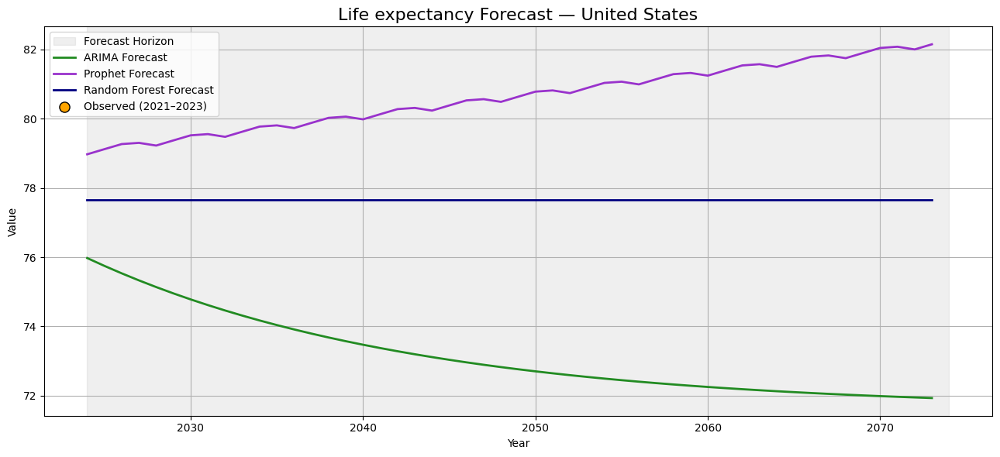

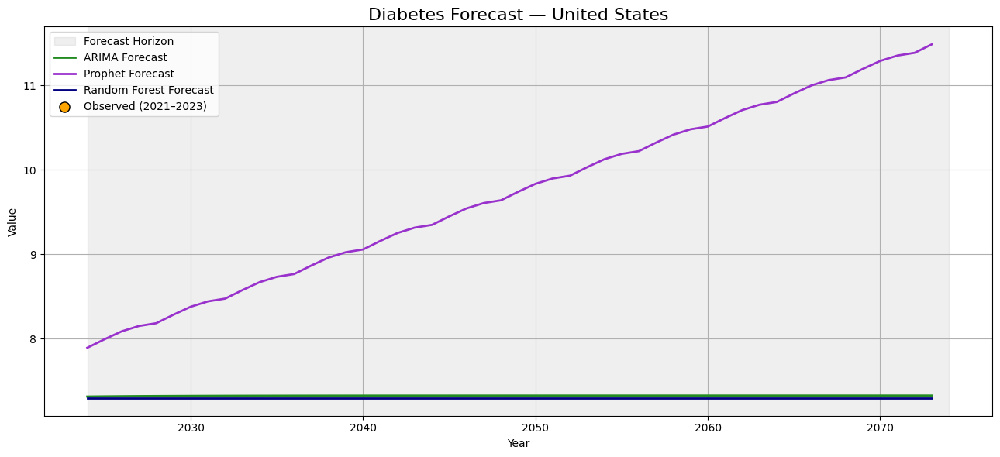

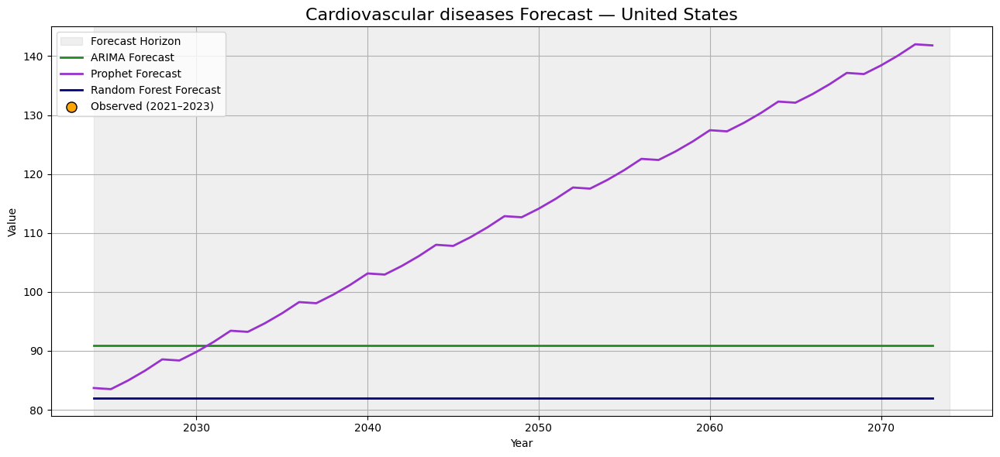

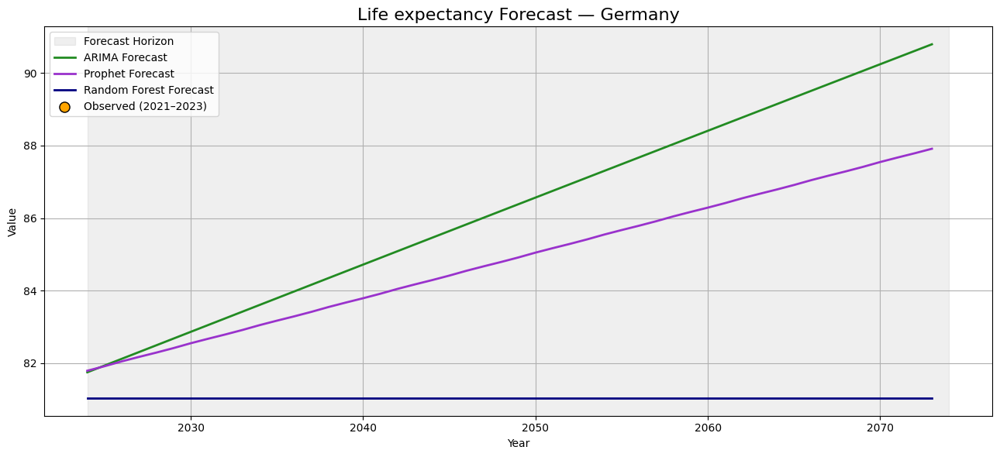

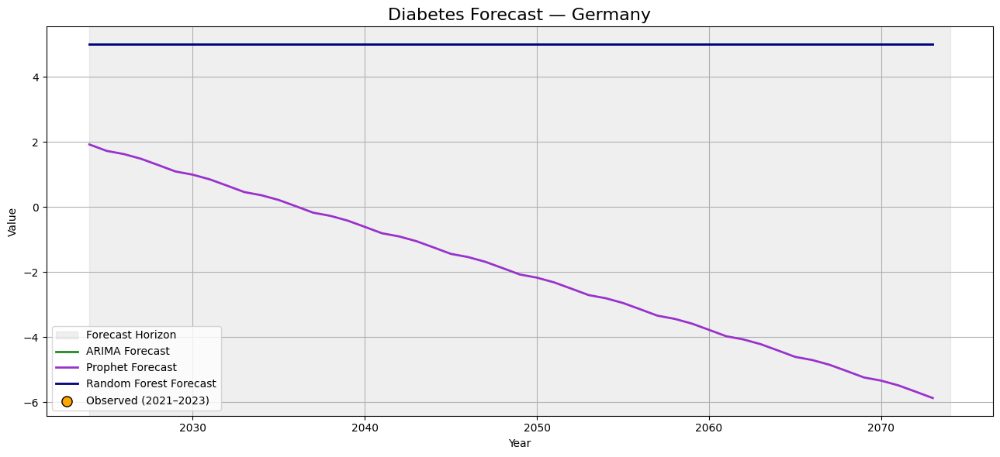

...

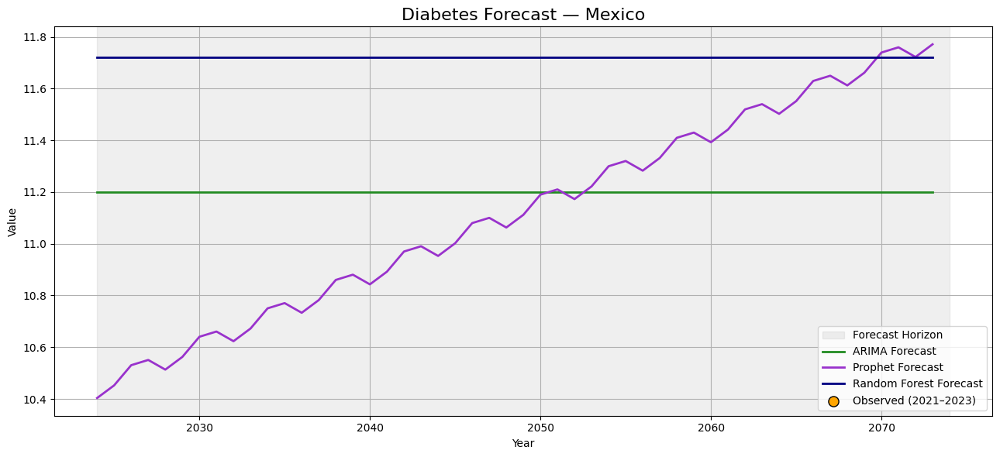

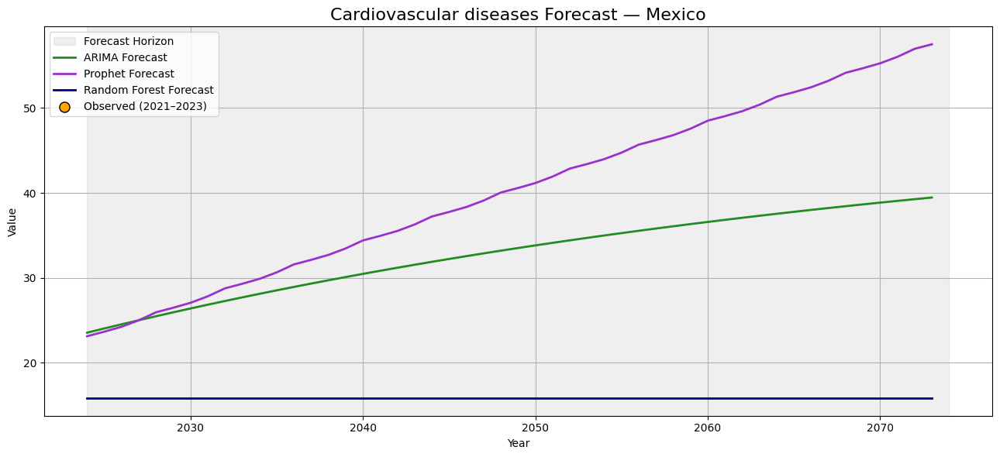

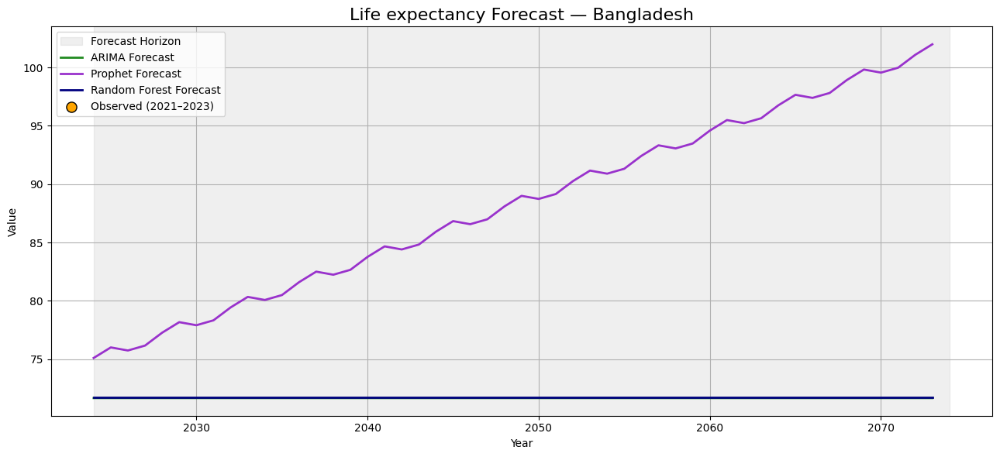

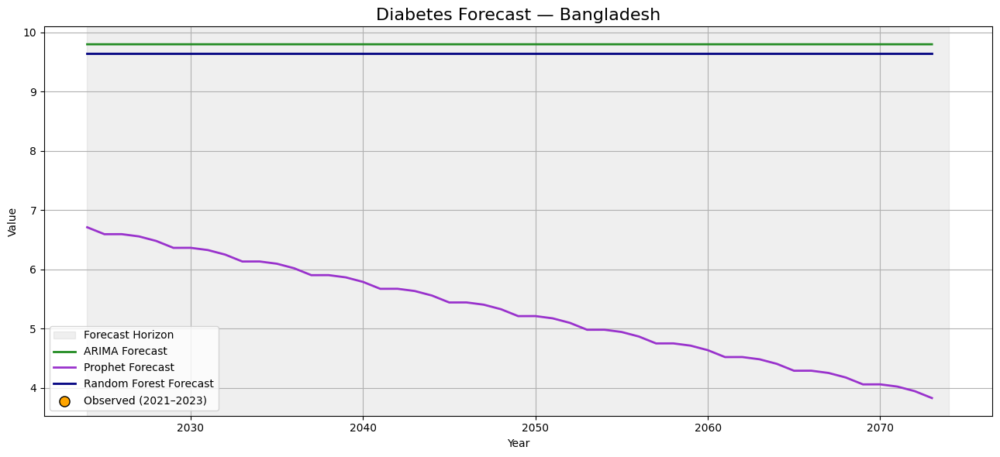

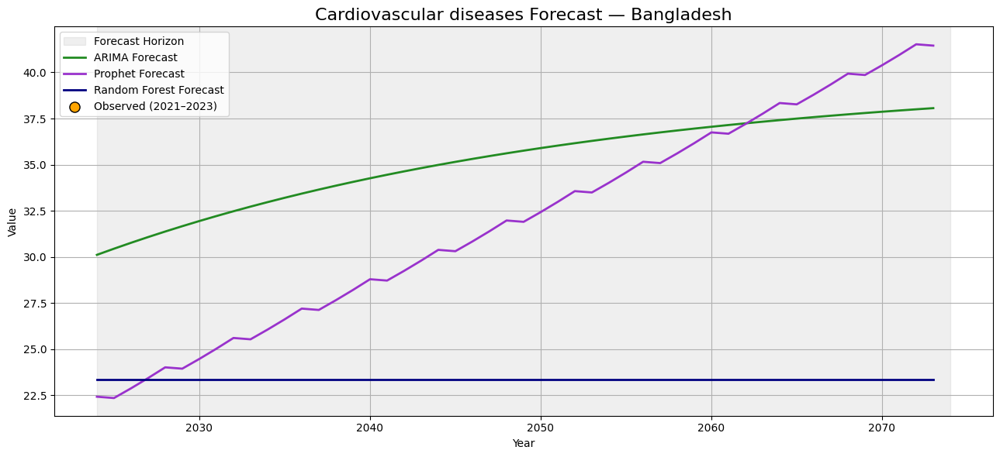

In [ ]:
# Plot Acutal vs Predict (RF, ARIMA, Prophet )

# Plots Testing- Actual vs Predict (RF, ARIMA, Prophet) -    18 July

import matplotlib.pyplot as plt
import numpy as np

def plot_target_forecast(df, country, target):
    # Filter data for country & target
    df_ct = df[(df['Country'] == country) & (df['Target'] == target)].sort_values('Year')

    # Extract data
    years = df_ct['Year']
    arima = df_ct['ARIMA_Forecast']
    rf = df_ct['RF_Forecast']
    prophet = df_ct['Prophet_Forecast']

    # Actual years
    actual_years = [2021, 2022, 2023]
    forecast_years = list(range(2024, 2075))
    actual_mask = df_ct['Year'].isin(actual_years)

    # Use ARIMA prediction as proxy for observed if needed
    actual_vals = arima[actual_mask]

    # Start plot
    plt.figure(figsize=(13, 6))

    # Forecast region shading
    plt.axvspan(2024, 2074, color='gray', alpha=0.12, label='Forecast Horizon')

    # Plot forecasts
    plt.plot(years, arima, color='forestgreen', linewidth=2, label='ARIMA Forecast')
    plt.plot(years, prophet, color='darkorchid', linewidth=2, label='Prophet Forecast')
    plt.plot(years, rf, color='navy', linewidth=2, label='Random Forest Forecast')

    # Plot actual values
    plt.scatter(df_ct.loc[actual_mask, 'Year'], actual_vals,
                color='orange', edgecolor='black', s=90,
                label='Observed (2021–2023)', zorder=5)

    # Final touches
    plt.title(f"{target} Forecast — {country}", fontsize=16)
    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    selected_countries = [
    'United States', 'Germany', 'Japan', 'Brazil', 'India',
    'Indonesia', 'Nigeria', 'Kenya', 'Mexico', 'Bangladesh'
]

for country in selected_countries:
    for target in ["Life expectancy", "Diabetes", "Cardiovascular diseases"]:
        plot_target_forecast(df_model_comparison, country, target)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/xcn15p9f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprjkocm4m/fq7s2wc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56323', 'data', 'file=/tmp/tmprjkocm4m/xcn15p9f.json', 'init=/tmp/tmprjkocm4m/fq7s2wc4.json', 'output', 'file=/tmp/tmprjkocm4m/prophet_modelv0_il2me/prophet_model-20250723150106.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:01:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:01:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonali

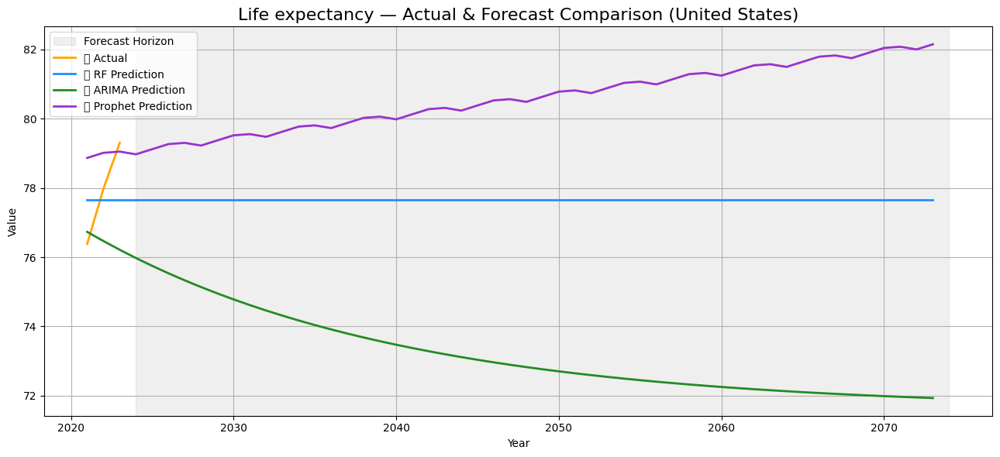

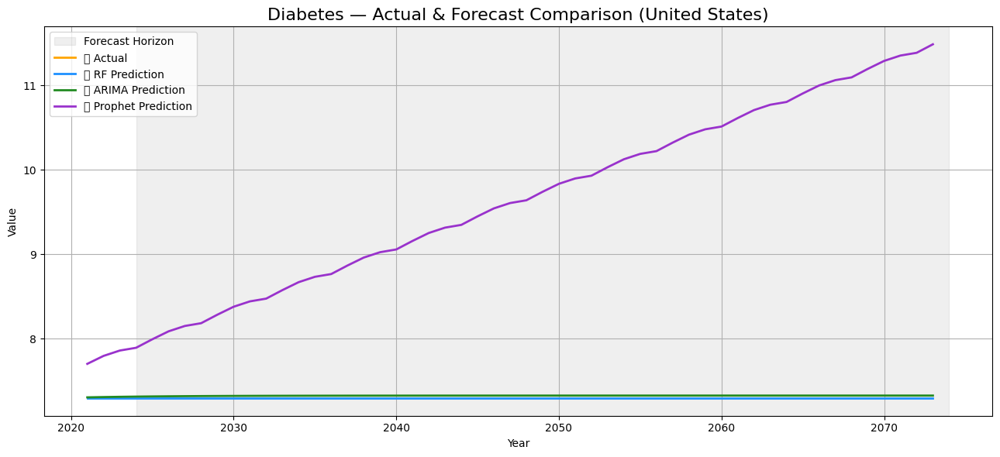

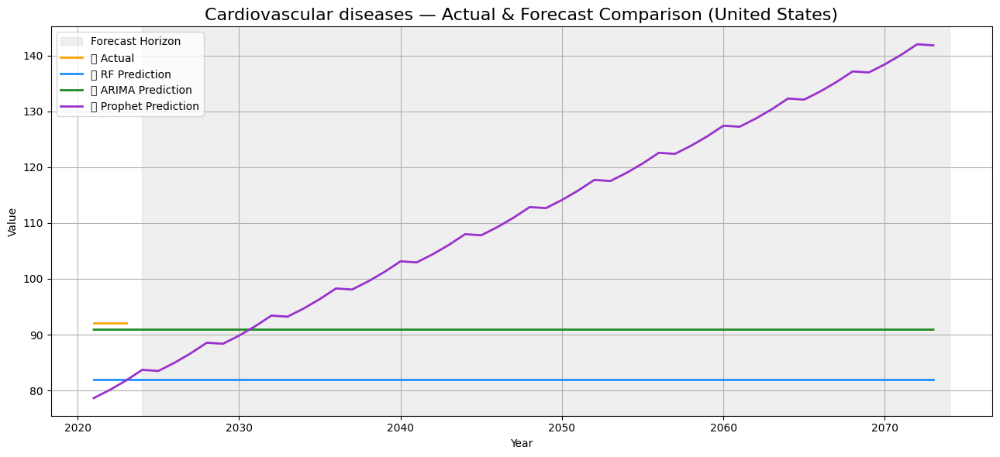

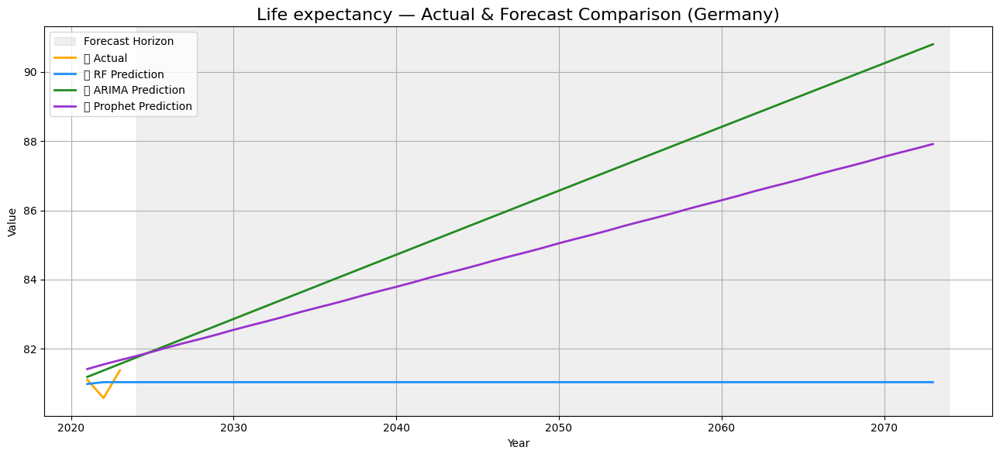

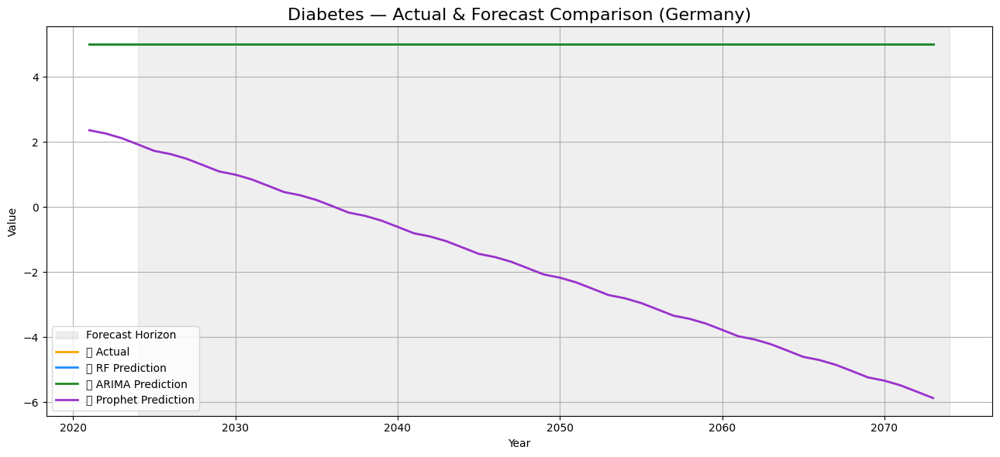

...

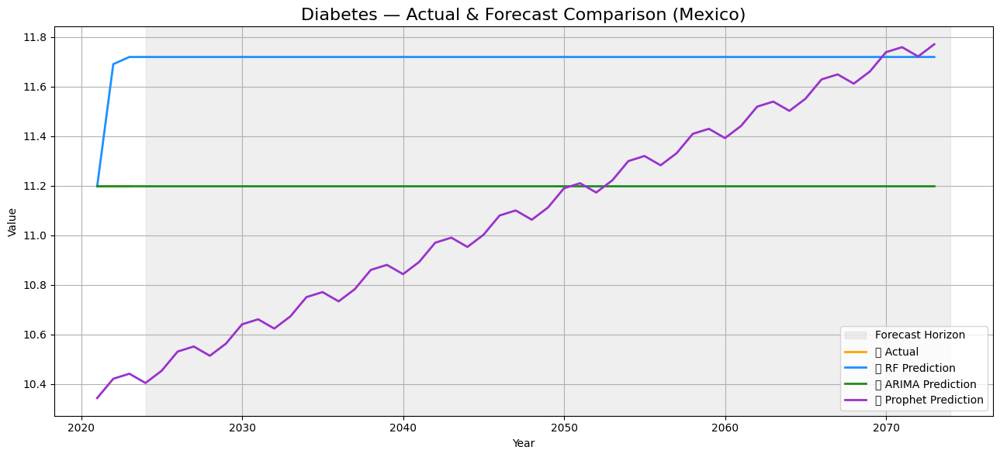

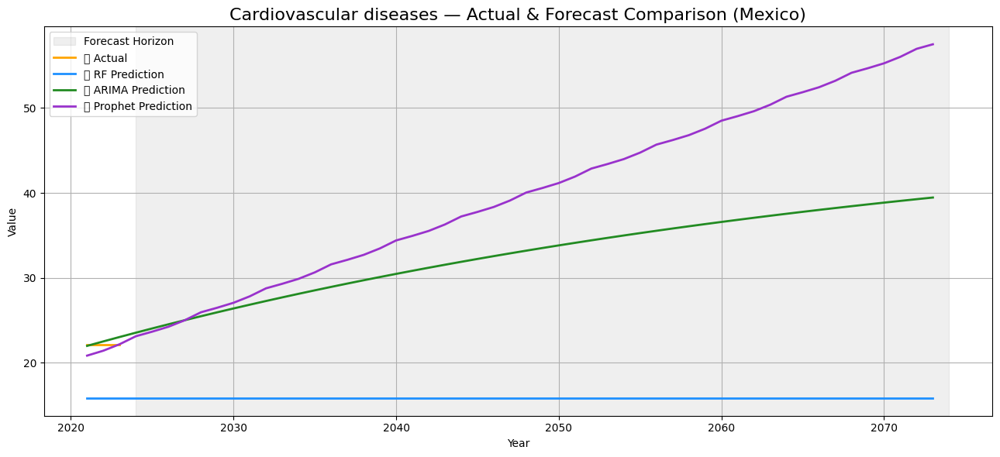

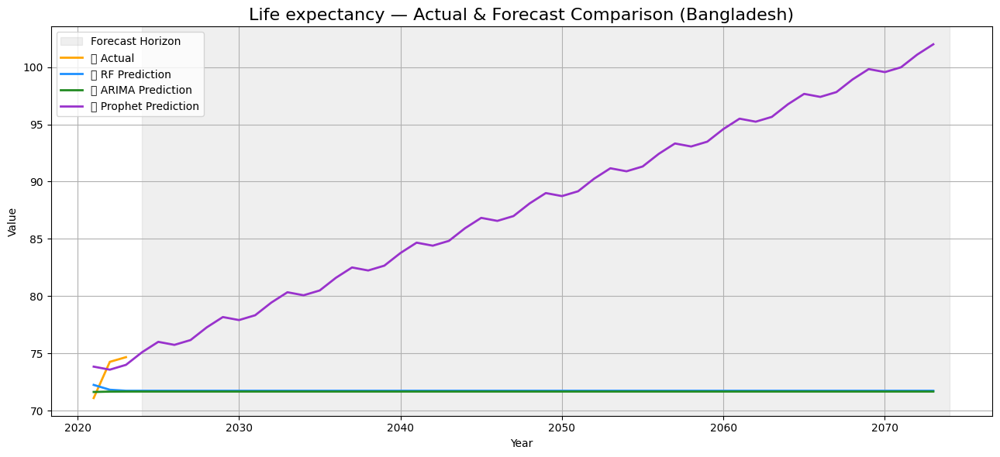

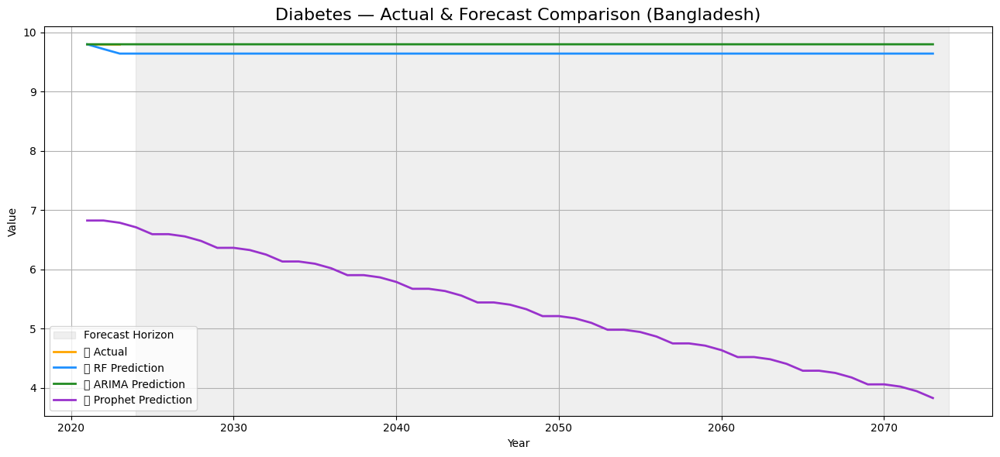

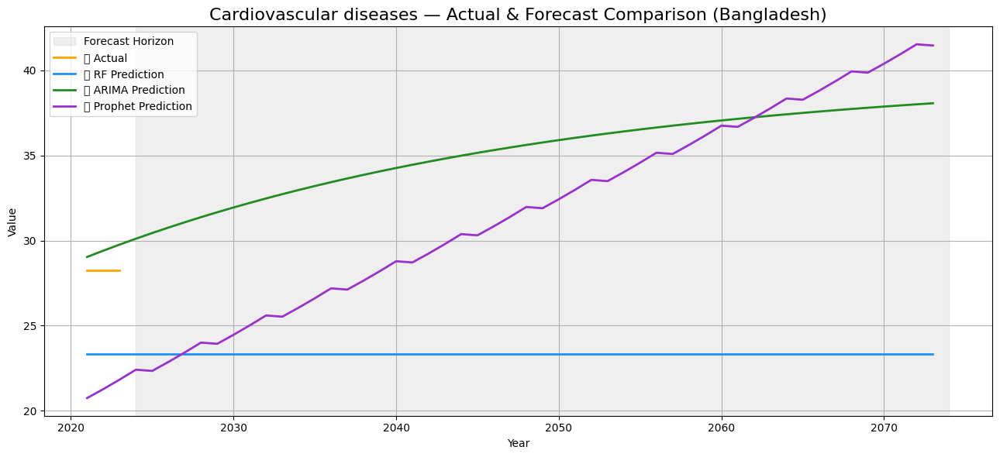

In [ ]:
# Plots Testing- Actual vs Predict (RF, ARIMA, Prophet) -    18 July  - TESTING 2

forecast_summary = []

for country in selected_countries:
    df_country = df_forecast_ready[df_forecast_ready['Country'] == country].sort_values('Year')

    for target in target_columns:
        if target not in df_country.columns:
            continue

        features = selected_features_dict.get(target, [])
        available_features = [f for f in features if f in df_country.columns]
        if not available_features:
            continue

        df_train = df_country[df_country['Year'].between(start_train, end_train)]
        df_eval = df_country[df_country['Year'].isin(eval_years)]
        df_forecast = df_country[df_country['Year'].isin(forecast_horizon)]
        actual_eval = df_eval[target].values

        #### ARIMA ####
        arima_rmse, arima_forecast_eval, arima_forecast = None, [], []
        try:
            train_series = df_train[[target]].copy()
            train_series.index = pd.date_range(start='1950', periods=len(train_series), freq='YE')
            model = ARIMA(train_series, order=(1, 1, 1)).fit()
            pred_eval_arima = model.predict(start=len(train_series), end=len(train_series)+len(df_eval)-1)
            arima_rmse = np.sqrt(mean_squared_error(actual_eval, pred_eval_arima))
            arima_forecast_eval = pred_eval_arima.tolist()
            arima_forecast = model.predict(start=len(train_series)+len(df_eval),
                                           end=len(train_series)+len(df_eval)+len(df_forecast)-1).tolist()
        except:
            pass

        #### Prophet ####
        prophet_rmse, prophet_forecast_eval, prophet_forecast = None, [], []
        try:
            prophet_df = df_train[['Year', target]].rename(columns={'Year': 'ds', target: 'y'})
            prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')
            model = Prophet()
            model.fit(prophet_df)
            eval_dates = pd.DataFrame({'ds': pd.to_datetime(eval_years, format='%Y')})
            forecast_eval_prophet = model.predict(eval_dates)
            prophet_rmse = np.sqrt(mean_squared_error(actual_eval, forecast_eval_prophet['yhat'].values))
            prophet_forecast_eval = forecast_eval_prophet['yhat'].tolist()
            forecast_years_df = pd.DataFrame({'ds': pd.to_datetime(df_forecast['Year'], format='%Y')})
            prophet_forecast = model.predict(forecast_years_df)['yhat'].tolist()
        except:
            pass

        #### RF ####
        rf_rmse, rf_forecast_eval, rf_forecast = None, [], []
        try:
            X = df_country[available_features]
            y = df_country[target]
            X_train = X[df_country['Year'].between(start_train, end_train)]
            y_train = y[df_country['Year'].between(start_train, end_train)]
            X_eval = X[df_country['Year'].isin(eval_years)]
            y_eval = y[df_country['Year'].isin(eval_years)]
            model = RandomForestRegressor(n_estimators=100, random_state=42)
            model.fit(X_train, y_train)
            pred_eval_rf = model.predict(X_eval)
            rf_rmse = np.sqrt(mean_squared_error(y_eval, pred_eval_rf))
            rf_forecast_eval = pred_eval_rf.tolist()
            X_forecast = X[df_country['Year'].isin(forecast_horizon)]
            rf_forecast = model.predict(X_forecast).tolist() if not X_forecast.isnull().any(axis=1).any() else [None]*len(X_forecast)
        except:
            pass

        # Append evaluation predictions
        for i, year in enumerate(eval_years):
            forecast_summary.append({
                "Country": country,
                "Target": target,
                "Year": year,
                "ARIMA_RMSE": arima_rmse,
                "ARIMA_Forecast": arima_forecast_eval[i] if i < len(arima_forecast_eval) else None,
                "Prophet_RMSE": prophet_rmse,
                "Prophet_Forecast": prophet_forecast_eval[i] if i < len(prophet_forecast_eval) else None,
                "RF_RMSE": rf_rmse,
                "RF_Forecast": rf_forecast_eval[i] if i < len(rf_forecast_eval) else None
            })

        # Append future forecast predictions
        for i, year in enumerate(df_forecast['Year']):
            forecast_summary.append({
                "Country": country,
                "Target": target,
                "Year": year,
                "ARIMA_RMSE": arima_rmse,
                "ARIMA_Forecast": arima_forecast[i] if i < len(arima_forecast) else None,
                "Prophet_RMSE": prophet_rmse,
                "Prophet_Forecast": prophet_forecast[i] if i < len(prophet_forecast) else None,
                "RF_RMSE": rf_rmse,
                "RF_Forecast": rf_forecast[i] if i < len(rf_forecast) else None
            })

df_model_comparison = pd.DataFrame(forecast_summary).sort_values(["Country", "Target", "Year"])

def plot_target_forecast(df_model_all, df_eval_ready, country, target):
    eval_years = [2021, 2022, 2023]
    forecast_years = list(range(2024, 2075))
    full_years = eval_years + forecast_years

    df_actual = df_eval_ready[
        (df_eval_ready['Country'] == country) &
        (df_eval_ready['Year'].isin(eval_years))
    ][['Year', target]].sort_values('Year')

    df_plot = df_model_all[
        (df_model_all['Country'] == country) &
        (df_model_all['Target'] == target) &
        (df_model_all['Year'].isin(full_years))
    ].sort_values('Year')

    years = df_plot['Year'].values
    rf_vals = df_plot['RF_Forecast'].values
    arima_vals = df_plot['ARIMA_Forecast'].values
    prophet_vals = df_plot['Prophet_Forecast'].values

    # Build actual line
    actual_line = []
    for yr in years:
        val = df_actual[df_actual['Year'] == yr][target]
        actual_line.append(val.values[0] if not val.empty else np.nan)

    # Plot
    plt.figure(figsize=(13, 6))
    plt.axvspan(2024, 2074, color='gray', alpha=0.12, label='Forecast Horizon')
    plt.plot(years, actual_line, label="🟧 Actual", color='orange', linewidth=2)
    plt.plot(years, rf_vals, label="🔵 RF Prediction", color='dodgerblue', linewidth=2)
    plt.plot(years, arima_vals, label="🟩 ARIMA Prediction", color='forestgreen', linewidth=2)
    plt.plot(years, prophet_vals, label="🟣 Prophet Prediction", color='darkorchid', linewidth=2)
    plt.title(f"{target} — Actual & Forecast Comparison ({country})", fontsize=16)
    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


selected_countries = [
    'United States', 'Germany', 'Japan', 'Brazil', 'India',
    'Indonesia', 'Nigeria', 'Kenya', 'Mexico', 'Bangladesh'
]
selected_targets = ["Life expectancy", "Diabetes", "Cardiovascular diseases"]

for country in selected_countries:
    for target in selected_targets:
        plot_target_forecast(df_model_comparison, df_forecast_ready, country, target)
